# Akuisisi senyawa aktif

In [1]:
import pubchempy as pcp
import pandas as pd
import requests
from bs4 import BeautifulSoup
import json
import xmltodict
import os
import ssl
import certifi
import urllib3

ssl._create_default_https_context = ssl._create_unverified_context

#Matikan warning SSL
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

#Verifikasi PubChem

In [23]:
import requests
import pandas as pd
import urllib3
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

def get_cids(compound_name):
    url = f"https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/name/{compound_name}/cids/TXT"
    r = requests.get(url, timeout=20, verify=False)
    if r.status_code == 200 and r.text.strip():
        return r.text.strip().split("\n")
    return []

def get_properties(cid):
    url = f"https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/cid/{cid}/property/MolecularFormula,MolecularWeight,CanonicalSMILES,IsomericSMILES,SMILES,IUPACName/JSON"
    r = requests.get(url, timeout=20, verify=False)
    if r.status_code == 200:
        data = r.json().get("PropertyTable", {}).get("Properties", [{}])[0]
        props = {}
        props["CID"] = cid
        props["Formula"] = data.get("MolecularFormula", "-")
        props["MolecularWeight"] = data.get("MolecularWeight", "-")
        props["IUPACName"] = data.get("IUPACName", "-")

        if "CanonicalSMILES" in data and data["CanonicalSMILES"]:
            props["SMILES"] = data["CanonicalSMILES"]
        elif "SMILES" in data and data["SMILES"]:
            props["SMILES"] = data["SMILES"]
        elif "IsomericSMILES" in data and data["IsomericSMILES"]:
            props["SMILES"] = data["IsomericSMILES"]
        else:
            props["SMILES"] = "-"
        return props
    return None

def search_compounds(compounds):
    results = []
    not_found = []

    for name in compounds:
        print("="*70)
        print(f"Senyawa : {name}")
        cids = get_cids(name)

        if not cids:
            print("❌ Tidak ditemukan di PubChem")
            results.append({
                "Compound": name,
                "CID": "",
                "Formula": "",
                "MolecularWeight": "",
                "IUPACName": "",
                "SMILES": "",
                "Status": "❌ Tidak ditemukan"
            })
            not_found.append(name)
            continue

        print(f"✅ Ditemukan {len(cids)} CID: {', '.join(cids)}")
        for cid in cids:
            props = get_properties(cid)
            if props:
                print(f"   CID {props['CID']}")
                print(f"      Formula     : {props['Formula']}")
                print(f"      MolWeight   : {props['MolecularWeight']}")
                print(f"      IUPAC Name  : {props['IUPACName']}")
                print(f"      SMILES      : {props['SMILES']}")
                results.append({
                    "Compound": name,
                    "CID": props["CID"],
                    "Formula": props["Formula"],
                    "MolecularWeight": props["MolecularWeight"],
                    "IUPACName": props["IUPACName"],
                    "SMILES": props["SMILES"],
                    "Status": "✅ Ditemukan"
                })
            else:
                print(f"   CID {cid} → ❌ Data tidak tersedia")
                results.append({
                    "Compound": name,
                    "CID": cid,
                    "Formula": "",
                    "MolecularWeight": "",
                    "IUPACName": "",
                    "SMILES": "",
                    "Status": "❌ Data tidak tersedia"
                })

    # Simpan semua hasil ke Excel
    df = pd.DataFrame(results)
    df.to_excel("D:/semhas/Data/senyawa_pubchem.xlsx", index=False)
    print("\n✅ Semua data tersimpan di 'senyawa_pubchem.xlsx'")

    if not_found:
        print("\nDaftar senyawa yang tidak ditemukan:")
        for nf in not_found:
            print(f" - {nf}")

# ==== CONTOH PENGGUNAAN ====
compounds = [
    "4-aminobenzoic acid",
    "Citric acid",
    "L-phenylalanine",
    "Trans-3-indoleacrylic acid",
    "DL-tryptophan",
    "4-O-feruloyl-D-quinic acid",
    "Murrangatin",
    "Alpha-lapachone",
    "Hainanmurpanin",
    "Murraol",
    "Murralongin",
    "(1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one",
    "Paniculatin",
    "Limonene, (+/-)-",  
    "Pheophorbide a",
    "SB236057"
]

search_compounds(compounds)


Senyawa : 4-aminobenzoic acid
✅ Ditemukan 1 CID: 978
   CID 978
      Formula     : C7H7NO2
      MolWeight   : 137.14
      IUPAC Name  : 4-aminobenzoic acid
      SMILES      : C1=CC(=CC=C1C(=O)O)N
Senyawa : Citric acid
✅ Ditemukan 1 CID: 311
   CID 311
      Formula     : C6H8O7
      MolWeight   : 192.12
      IUPAC Name  : 2-hydroxypropane-1,2,3-tricarboxylic acid
      SMILES      : C(C(=O)O)C(CC(=O)O)(C(=O)O)O
Senyawa : L-phenylalanine
✅ Ditemukan 1 CID: 6140
   CID 6140
      Formula     : C9H11NO2
      MolWeight   : 165.19
      IUPAC Name  : (2S)-2-amino-3-phenylpropanoic acid
      SMILES      : C1=CC=C(C=C1)C[C@@H](C(=O)O)N
Senyawa : Trans-3-indoleacrylic acid
✅ Ditemukan 1 CID: 5375048
   CID 5375048
      Formula     : C11H9NO2
      MolWeight   : 187.19
      IUPAC Name  : (E)-3-(1H-indol-3-yl)prop-2-enoic acid
      SMILES      : C1=CC=C2C(=C1)C(=CN2)/C=C/C(=O)O
Senyawa : DL-tryptophan
✅ Ditemukan 1 CID: 1148
   CID 1148
      Formula     : C11H12N2O2
      MolWeight  

#smiles Limonene, (+/-)-(CID=22311)

In [24]:
def get_properties_by_cid(cid):
    """Ambil Formula, MolWeight, IUPAC Name, dan SMILES dari CID PubChem"""
    url = f"https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/cid/{cid}/property/MolecularFormula,MolecularWeight,CanonicalSMILES,IsomericSMILES,SMILES,IUPACName/JSON"
    r = requests.get(url, timeout=20)
    
    if r.status_code == 200:
        data = r.json().get("PropertyTable", {}).get("Properties", [{}])[0]
        return {
            "CID": cid,
            "Formula": data.get("MolecularFormula", "-"),
            "MolWeight": data.get("MolecularWeight", "-"),
            "IUPACName": data.get("IUPACName", "-"),
            "SMILES": data.get("CanonicalSMILES") or data.get("IsomericSMILES") or data.get("SMILES", "-")
        }
    return None

# Ambil data Limonene
cid = "22311"
props = get_properties_by_cid(cid)

# Tampilkan hasil
print("="*60)
print(f"CID         : {props['CID']}")
print(f"Formula     : {props['Formula']}")
print(f"MolWeight   : {props['MolWeight']}")
print(f"IUPAC Name  : {props['IUPACName']}")
print(f"SMILES      : {props['SMILES']}")
print("="*60)

# Buat DataFrame untuk disimpan
df_limonene = pd.DataFrame([props])

# Simpan ke Excel, sheet baru "Limonene"
excel_file = "D:/semhas/Data/senyawa_pubchem.xlsx"
with pd.ExcelWriter(excel_file, mode="a", engine="openpyxl") as writer:
    df_limonene.to_excel(writer, sheet_name="Limonene", index=False)

print(f"✅ Data Limonene tersimpan di sheet 'Limonene' pada {excel_file}")


CID         : 22311
Formula     : C10H16
MolWeight   : 136.23
IUPAC Name  : 1-methyl-4-prop-1-en-2-ylcyclohexene
SMILES      : CC1=CCC(CC1)C(=C)C
✅ Data Limonene tersimpan di sheet 'Limonene' pada D:/semhas/Data/senyawa_pubchem.xlsx


# (1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one (CACTUS)

In [19]:
import urllib.parse

def get_from_cactus(compound_name):
    base_url = "https://cactus.nci.nih.gov/chemical/structure"
    formats = {
        "SMILES": "smiles",
        "Formula": "formula",
        "MolecularWeight": "mw",
        "IUPAC_Name": "iupac_name"
    }

    results = {"Compound": compound_name}
    encoded_name = urllib.parse.quote(compound_name)

    for key, fmt in formats.items():
        url = f"{base_url}/{encoded_name}/{fmt}"
        try:
            r = requests.get(url, timeout=20)
            if r.status_code == 200 and r.text.strip():
                results[key] = r.text.strip()
            else:
                results[key] = "-"
        except Exception as e:
            results[key] = f"Error: {e}"
    return results


# ==== Contoh penggunaan ====
compound_name = "(1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one"

props = get_from_cactus(compound_name)

print("="*70)
print(f"Nama Senyawa   : {props['Compound']}")
print(f"SMILES         : {props['SMILES']}")
print(f"Formula        : {props['Formula']}")
print(f"MolecularWeight: {props['MolecularWeight']}")
print(f"IUPAC Name     : {props['IUPAC_Name']}")
print("="*70)


Nama Senyawa   : (1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one
SMILES         : Clc1ccc(cc1)\C=C\C2=CC=C3[C@@H]4C[C@@H](CN(C4)C(=O)c5cncnc5)CN3C2=O
Formula        : C24H21ClN4O2
MolecularWeight: 432.9085
IUPAC Name     : -


#Mencari cid dari smiles (1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one 
#di pubchem

In [26]:
def get_cid_from_smiles(smiles):
    """Cari CID PubChem berdasarkan SMILES"""
    encoded = urllib.parse.quote(smiles)
    url = f"https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/smiles/{encoded}/cids/TXT"
    r = requests.get(url, timeout=20)
    if r.status_code == 200 and r.text.strip():
        return r.text.strip().split("\n")  # bisa lebih dari satu CID
    return []

def get_properties_by_cid(cid):
    """Ambil Formula, MolWeight, IUPAC Name, dan SMILES dari CID PubChem"""
    url = f"https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/cid/{cid}/property/MolecularFormula,MolecularWeight,CanonicalSMILES,IsomericSMILES,SMILES,IUPACName/JSON"
    r = requests.get(url, timeout=20)
    
    if r.status_code == 200:
        data = r.json().get("PropertyTable", {}).get("Properties", [{}])[0]
        return {
            "CID": cid,
            "Formula": data.get("MolecularFormula", "-"),
            "MolWeight": data.get("MolecularWeight", "-"),
            "IUPACName": data.get("IUPACName", "-"),
            "SMILES": data.get("CanonicalSMILES") or data.get("IsomericSMILES") or data.get("SMILES", "-")
        }
    return None

def search_smiles_and_save(smiles, excel_file="D:/semhas/Data/senyawa_pubchem.xlsx", sheet_name="From_SMILES"):
    print("="*70)
    print(f"SMILES yang dicari: {smiles}")
    
    cids = get_cid_from_smiles(smiles)
    results = []

    if not cids:
        print("❌ CID tidak ditemukan di PubChem")
        return

    print(f"✅ Ditemukan CID(s): {', '.join(cids)}")
    for cid in cids:
        props = get_properties_by_cid(cid)
        if props:
            print(f"--- CID {props['CID']} ---")
            print(f"Formula       : {props['Formula']}")
            print(f"MolWeight     : {props['MolWeight']}")
            print(f"IUPAC Name    : {props['IUPACName']}")
            print(f"SMILES        : {props['SMILES']}")
            results.append(props)
        else:
            print(f"CID {cid} → ❌ Data tidak tersedia")

    # Simpan ke Excel di sheet baru
    if results:
        df = pd.DataFrame(results)
        with pd.ExcelWriter(excel_file, mode="a", engine="openpyxl") as writer:
            df.to_excel(writer, sheet_name=sheet_name, index=False)
        print(f"\n✅ Data disimpan di sheet '{sheet_name}' pada {excel_file}")

# SMILES
smiles = r"Clc1ccc(cc1)\C=C\C2=CC=C3[C@@H]4C[C@@H](CN(C4)C(=O)c5cncnc5)CN3C2=O" 
search_smiles_and_save(smiles)


SMILES yang dicari: Clc1ccc(cc1)\C=C\C2=CC=C3[C@@H]4C[C@@H](CN(C4)C(=O)c5cncnc5)CN3C2=O
✅ Ditemukan CID(s): 11886484
--- CID 11886484 ---
Formula       : C24H21ClN4O2
MolWeight     : 432.9
IUPAC Name    : (1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one
SMILES        : C1[C@H]2CN(C[C@@H]1C3=CC=C(C(=O)N3C2)/C=C/C4=CC=C(C=C4)Cl)C(=O)C5=CN=CN=C5

✅ Data disimpan di sheet 'From_SMILES' pada D:/semhas/Data/senyawa_pubchem.xlsx


In [ ]:
#recap

In [ ]:
!pip install tabulate

In [32]:
import pandas as pd
import requests
import urllib.parse
from tabulate import tabulate

# ----- Fungsi bantu -----
def get_cids_from_name(name):
    url = f"https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/name/{urllib.parse.quote(name)}/cids/TXT"
    r = requests.get(url, timeout=20)
    if r.status_code == 200 and r.text.strip():
        return r.text.strip().split("\n")
    return []

def get_properties_by_cid(cid):
    url = f"https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/cid/{cid}/property/MolecularFormula,MolecularWeight,CanonicalSMILES,IsomericSMILES,SMILES,IUPACName/JSON"
    r = requests.get(url, timeout=20)
    if r.status_code == 200:
        data = r.json().get("PropertyTable", {}).get("Properties", [{}])[0]
        return data.get("CanonicalSMILES") or data.get("IsomericSMILES") or data.get("SMILES", "-")
    return "-"

# ----- Keterangan manual -----
manual_notes = {
    "(1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one":
        "Ditentukan manual via CACTUS → Terverifikasi PubChem",
    "Limonene, (+/-)-":
        "Hanya tersedia rasemat (Xu et al., 2017) → Terverifikasi PubChem"
}

# ----- Daftar senyawa -----
compounds = [
    "4-aminobenzoic acid",
    "Citric acid",
    "L-phenylalanine",
    "Trans-3-indoleacrylic acid",
    "DL-tryptophan",
    "4-O-feruloyl-D-quinic acid",
    "Murrangatin",
    "Alpha-lapachone",
    "Hainanmurpanin",
    "Murraol",
    "Murralongin",
    "(1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one",
    "Paniculatin",
    "Limonene, (+/-)-",
    "Pheophorbide a",
    "SB236057"
]

# ----- Proses semua senyawa -----
results = []
no = 1
for name in compounds:
    cids = get_cids_from_name(name)
    if cids:
        for cid in cids:
            smiles = get_properties_by_cid(cid)
            keterangan = manual_notes.get(name, "Diverifikasi")
            results.append({
                "No.": no,
                "Compound": name,
                "CID": cid,
                "SMILES": smiles,
                "Status Di PubChem": "Ada",
                "Keterangan": keterangan
            })
            no += 1
    else:
        keterangan = manual_notes.get(name, "Belum Diverifikasi")
        results.append({
            "No.": no,
            "Compound": name,
            "CID": "-",
            "SMILES": "-",
            "Status Di PubChem": "Tidak Ada",
            "Keterangan": keterangan
        })
        no += 1

# ----- Buat DataFrame -----
df = pd.DataFrame(results)
print(tabulate(df, headers='keys', tablefmt='grid', showindex=False))

# ----- Simpan ke Excel (sheet berbeda) -----
output_file = "D:/semhas/Data/senyawa_pubchem.xlsx"
sheet_name = "Hasil_Senyawa"  # bisa diganti tiap run, misalnya "Batch1", "Batch2"

with pd.ExcelWriter(output_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"\n✅ Data tersimpan di file '{output_file}' pada sheet '{sheet_name}'")


+-------+---------------------------------------------------------------------------------------------------------------------------+----------+------------------------------------------------------------------------------------------------------------------------------------+---------------------+------------------------------------------------------------------+
|   No. | Compound                                                                                                                  | CID      | SMILES                                                                                                                             | Status Di PubChem   | Keterangan                                                       |
+=======+===========================================================================================================================+==========+==========================================================================================================================

# SwissAdme

In [7]:
import pandas as pd

# File Excel
compound_file = 'D:/semhas/Data/senyawa_pubchem.xlsx'
swissadme_file = 'D:/semhas/Data/swissadme_hasil.csv'

# Baca sheet verifikasi_senyawa
df_verif = pd.read_excel(compound_file, sheet_name='Hasil_Senyawa')
print(f"Jumlah baris verifikasi_senyawa: {len(df_verif)}")

# Baca file SwissADME
df_swiss = pd.read_csv(swissadme_file)
print(f"Jumlah baris SwissADME: {len(df_swiss)}")

# Pastikan jumlah baris sama
if len(df_verif) != len(df_swiss):
    raise ValueError("Jumlah baris SwissADME dan verifikasi_senyawa tidak sama!")

# Tambahkan kolom Compound dan CID dari verifikasi_senyawa
df_swiss['Compound'] = df_verif['Compound']
df_swiss['CID'] = df_verif['CID']

# Tambahkan Status akhir berdasarkan Bioavailability Score
df_swiss['Status akhir'] = df_swiss['Bioavailability Score'].apply(
    lambda x: 'Dipilih' if x >= 0.55 else 'Tidak dipilih'
)

# Tambahkan kolom No.
df_swiss.insert(0, 'No.', range(1, len(df_swiss) + 1))

# Simpan ke sheet baru di file Excel yang sama
with pd.ExcelWriter(compound_file, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
    df_swiss.to_excel(writer, sheet_name='swissadme_senyawa', index=False)

print(f"\n✅ Data SwissADME berhasil disimpan di sheet 'swissadme_senyawa' dalam file {compound_file}")

# --- Tambahan: Hitung jumlah senyawa unik dan jumlah total SMILES ---
jumlah_senyawa = df_verif['Compound'].nunique()
jumlah_smiles = len(df_verif)

print("\n📊 Ringkasan Data Senyawa:")
print(f"Jumlah senyawa unik   : {jumlah_senyawa} senyawa")
print(f"Jumlah total SMILES   : {jumlah_smiles} SMILES")

# Tampilkan daftar senyawa unik
print("\nDaftar senyawa unik:")
for i, senyawa in enumerate(df_verif['Compound'].unique(), start=1):
    print(f"{i}. {senyawa}")

# --- Tambahan: Ringkasan berdasarkan Status akhir ---
dipilih = df_swiss[df_swiss['Status akhir'] == 'Dipilih']
tidak_dipilih = df_swiss[df_swiss['Status akhir'] == 'Tidak dipilih']

print("\n📌 Ringkasan Status Akhir:")
print(f"Senyawa dengan status 'Dipilih'     : {dipilih['Compound'].nunique()} senyawa ({len(dipilih)} SMILES)")
print(f"Senyawa dengan status 'Tidak dipilih': {tidak_dipilih['Compound'].nunique()} senyawa ({len(tidak_dipilih)} SMILES)")

# Tampilkan daftar senyawa dipilih & tidak dipilih
print("\nDaftar senyawa dengan status 'Dipilih':")
for i, senyawa in enumerate(dipilih['Compound'].unique(), start=1):
    print(f"{i}. {senyawa}")

print("\nDaftar senyawa dengan status 'Tidak dipilih':")
for i, senyawa in enumerate(tidak_dipilih['Compound'].unique(), start=1):
    print(f"{i}. {senyawa}")

# --- Preview hasil SwissADME ---
pd.set_option('display.max_rows', 20)
print("\nPreview hasil SwissADME:")
print(df_swiss.head())


Jumlah baris verifikasi_senyawa: 17
Jumlah baris SwissADME: 17

✅ Data SwissADME berhasil disimpan di sheet 'swissadme_senyawa' dalam file D:/semhas/Data/senyawa_pubchem.xlsx

📊 Ringkasan Data Senyawa:
Jumlah senyawa unik   : 16 senyawa
Jumlah total SMILES   : 17 SMILES

Daftar senyawa unik:
1. 4-aminobenzoic acid
2. Citric acid
3. L-phenylalanine
4. Trans-3-indoleacrylic acid
5. DL-tryptophan
6. 4-O-feruloyl-D-quinic acid
7. Murrangatin
8. Alpha-lapachone
9. Hainanmurpanin
10. Murraol
11. Murralongin
12. (1R,9S)-5-[(E)-2-(4-chlorophenyl)ethenyl]-11-(pyrimidine-5-carbonyl)-7,11-diazatricyclo[7.3.1.02,7]trideca-2,4-dien-6-one
13. Paniculatin
14. Limonene, (+/-)-
15. Pheophorbide a
16. SB236057

📌 Ringkasan Status Akhir:
Senyawa dengan status 'Dipilih'     : 13 senyawa (14 SMILES)
Senyawa dengan status 'Tidak dipilih': 3 senyawa (3 SMILES)

Daftar senyawa dengan status 'Dipilih':
1. 4-aminobenzoic acid
2. Citric acid
3. L-phenylalanine
4. Trans-3-indoleacrylic acid
5. DL-tryptophan
6. Mu

# Akuisisi Protein Target

In [ ]:
#Superpred+Swiss

In [1]:
import pandas as pd

# File Excel
target_file = 'D:/semhas/Data/targetsuperpred.xlsx'

# Baca semua sheet
xls = pd.ExcelFile(target_file)
sheet_names = xls.sheet_names[:14]  # Ambil 14 sheet pertama

all_data = []

for sheet in sheet_names:
    try:
        # Baca mulai dari baris kedua sebagai header
        df = pd.read_excel(target_file, sheet_name=sheet, header=1)
        all_data.append(df)
    except Exception as e:
        print(f"⚠️ Gagal membaca sheet {sheet}: {e}")

# Gabungkan semua sheet
if all_data:
    df_all = pd.concat(all_data, ignore_index=True)
    print("\n✅ Semua 14 sheet berhasil digabungkan. Preview:")
    
    # Ambil hanya kolom yang diinginkan
    selected_cols = ['Target Name','UniProt ID','Min Activity','Assay type','Probability']
    df_selected = df_all.reindex(columns=selected_cols)
    
    print(df_selected.head(20))
    
    # --- Tambahkan ringkasan jumlah ---
    total_rows = len(df_selected)
    print(f"\nJumlah total baris: {total_rows}")
    print("\nJumlah baris non-NA per kolom:")
    print(df_selected.count())
    
    # Simpan ke sheet baru
    with pd.ExcelWriter(target_file, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        df_selected.to_excel(writer, sheet_name='all_14_sheets', index=False)
    
    print(f"\n✅ Data berhasil disimpan di sheet 'all_14_sheets' dalam file {target_file}")
else:
    print("❌ Tidak ada data yang berhasil dibaca.")



✅ Semua 14 sheet berhasil digabungkan. Preview:
                                          Target Name UniProt ID Min Activity  \
0                Thyroid stimulating hormone receptor     P16473     125.9 nm   
1                                     NADPH oxidase 1     Q9Y5S8          NaN   
2                          Ras-related protein Rab-9A     P51151          NaN   
3                               Kruppel-like factor 5     Q13887          NaN   
4                             Niemann-Pick C1 protein     O15118          NaN   
5           Transcription intermediary factor 1-alpha     O15164          NaN   
6                             Proteasome component C5     P20618          NaN   
7   Endoplasmic reticulum-associated amyloid beta-...     Q99714          NaN   
8                                    Cyclooxygenase-1     P23219          NaN   
9                                       Transthyretin     P02766          NaN   
10                       Proteasome Macropain subunit     P4

In [2]:
import pandas as pd

# File SuperPred
file_superpred = "D:/semhas/Data/targetsuperpred.xlsx"

# Baca sheet yang sudah difilter sebelumnya
df = pd.read_excel(file_superpred, sheet_name="all_14_sheets", engine="openpyxl")

# Bersihkan dan ubah kolom

df["Probability"] = pd.to_numeric(df["Probability"].astype(str).str.replace(",", "."), errors="coerce")
df["Assay type"] = df["Assay type"].astype(str).str.strip().str.capitalize()
df["UniProt ID"] = df["UniProt ID"].astype(str).str.strip()

# Filter: Probability >= 0.55 atau Assay type == "Potency"
df_filtered = df[(df["Probability"] >= 0.55) | (df["Assay type"] == "Potency")]

# Hapus duplikat UniProt ID
df_filtered_unique = df_filtered.drop_duplicates(subset=["UniProt ID"], keep="first")

# Simpan hasil
with pd.ExcelWriter(file_superpred, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_filtered_unique.to_excel(writer, sheet_name="all_14_sheets_unik", index=False)

# Tampilkan jumlah
print("Jumlah total baris:", len(df))
print("Jumlah setelah filter (Probability >=0.55 atau Potency):", len(df_filtered))
print("Jumlah UniProt ID unik setelah filter:", df_filtered_unique["UniProt ID"].nunique())
print("Selesai. Hasil tersimpan di sheet 'all_14_sheets_unik'.")


Jumlah total baris: 1068
Jumlah setelah filter (Probability >=0.55 atau Potency): 819
Jumlah UniProt ID unik setelah filter: 229
Selesai. Hasil tersimpan di sheet 'all_14_sheets_unik'.


In [ ]:
#targetswiss

In [3]:
import pandas as pd

# Path file Excel
file_path = "D:/semhas/Data/targetswiss.xlsx"

# Ambil 3 sheet pertama
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[:3]

# Baca tiap sheet, skip baris pertama, gunakan baris kedua sebagai header
df_list = [
    pd.read_excel(file_path, sheet_name=sh, engine="openpyxl", skiprows=1, header=0)
    for sh in sheet_names
]

# Gabungkan semua sheet
df_all = pd.concat(df_list, ignore_index=True)

# Simpan hasil gabungan ke sheet baru
with pd.ExcelWriter(file_path, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_all.to_excel(writer, sheet_name="all_3_sheets", index=False)

print("Sheet yang dibaca:", sheet_names)
print("Jumlah total baris gabungan:", len(df_all))


Sheet yang dibaca: ['Sheet16', 'Sheet12', 'Sheet14(limone)']
Jumlah total baris gabungan: 293


In [ ]:
#syarat Probability* > 0,

In [5]:
import pandas as pd

# Path file Excel
file_path = "D:/semhas/Data/targetswiss.xlsx"

# --- Baca 3 sheet pertama, abaikan baris pertama (header asli) ---
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[:3]

df_list = []
for sh in sheet_names:
    # header=1 agar baris ke-2 dijadikan header, skip baris pertama
    df = pd.read_excel(file_path, sheet_name=sh, engine="openpyxl", header=1)
    df_list.append(df)

# Gabungkan semua sheet
df_all = pd.concat(df_list, ignore_index=True)

# --- Cari kolom Probability ---
prob_col = None
for col in df_all.columns:
    if "Probability" in col:
        prob_col = col
        break

if prob_col is None:
    raise ValueError("Kolom Probability* tidak ditemukan.")

# Ubah menjadi numerik (ganti koma desimal jika ada)
df_all[prob_col] = pd.to_numeric(df_all[prob_col].astype(str).str.replace(",", "."), errors="coerce")

# Filter Probability > 0
df_filtered = df_all[df_all[prob_col] > 0]

# --- Pisahkan UniProt ID menjadi satu per baris ---
if "Uniprot ID" in df_filtered.columns:
    df_filtered_exp = df_filtered.copy()
    df_filtered_exp["Uniprot ID"] = df_filtered_exp["Uniprot ID"].astype(str).str.split()
    df_filtered_exp = df_filtered_exp.explode("Uniprot ID")
else:
    raise ValueError("Kolom 'Uniprot ID' tidak ditemukan dalam data!")

# --- Hapus duplikat berdasarkan UniProt ID ---
df_filtered_unique = df_filtered_exp.drop_duplicates(subset=["Uniprot ID"], keep="first")

# Hitung statistik
total_rows = len(df_filtered)
unique_uniprot = df_filtered_exp["Uniprot ID"].nunique()

print("Jumlah baris setelah filter Probability > 0:", total_rows)
print("Jumlah UniProt ID unik:", unique_uniprot)

# --- Simpan hasil ke dua sheet: semua hasil & hanya yang unik ---
with pd.ExcelWriter(file_path, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_filtered.to_excel(writer, sheet_name="all_3_sheets_filter", index=False)           # hasil filter asli
    df_filtered_unique.to_excel(writer, sheet_name="all_3_sheets_filter_unik", index=False)  # hasil unik

print("✅ Hasil tersimpan ke:")
print("- 'all_3_sheets_filter' (hasil filter Probability > 0)")
print("- 'all_3_sheets_filter_unik' (UniProt ID unik)")


Jumlah baris setelah filter Probability > 0: 51
Jumlah UniProt ID unik: 53
✅ Hasil tersimpan ke:
- 'all_3_sheets_filter' (hasil filter Probability > 0)
- 'all_3_sheets_filter_unik' (UniProt ID unik)


In [ ]:
#Gabungan Superpred dan swiss

In [23]:
import pandas as pd

# --- File paths ---
file_superpred = "D:/semhas/Data/targetsuperpred.xlsx"
file_swiss = "D:/semhas/Data/targetswiss.xlsx"
file_output = "D:/semhas/Data/stat_awal.xlsx"

# --- Baca sheet sesuai sumber ---
df_superpred = pd.read_excel(file_superpred, sheet_name="all_14_sheets_unik").copy()
df_swiss = pd.read_excel(file_swiss, sheet_name="all_3_sheets_filter_unik").copy()

# --- Normalisasi nama kolom ---
rename_cols = {
    "Target Name": "Target",
    "Uniprot ID": "UniProt ID",
    "Probability*": "Probability"
}
df_superpred = df_superpred.rename(columns=rename_cols)
df_swiss = df_swiss.rename(columns=rename_cols)

# --- Pastikan kolom penting tersedia ---
kolom = ["Target", "UniProt ID", "Min Activity", "Assay type", "Probability"]
for df in [df_superpred, df_swiss]:
    for col in kolom:
        if col not in df.columns:
            df[col] = None

# --- Ambil kolom yang diperlukan & tambah kolom sumber ---
df_superpred_sel = df_superpred[kolom].copy().assign(Sumber="SuperPred")
df_swiss_sel = df_swiss[kolom].copy().assign(Sumber="Swiss")

# --- Gabungkan keduanya ---
df_gabungan = pd.concat([df_superpred_sel, df_swiss_sel], ignore_index=True)

# --- Data unik & duplikat ---
df_gabungan_unik = df_gabungan.drop_duplicates(subset=["UniProt ID"], keep="first").copy()
df_gabungan_duplikat = df_gabungan[df_gabungan.duplicated(subset=["UniProt ID"], keep=False)].copy()

# --- Statistik ---
print("Jumlah total gabungan:", len(df_gabungan))
print("Jumlah UniProt ID unik gabungan:", df_gabungan['UniProt ID'].nunique())
print("Jumlah UniProt ID duplikat:", len(df_gabungan_duplikat))

# --- Simpan semua hasil ke Excel ---
with pd.ExcelWriter(file_output, engine="openpyxl") as writer:
    df_superpred_sel.to_excel(writer, sheet_name="superpred_final", index=False)
    df_swiss_sel.to_excel(writer, sheet_name="swiss_final", index=False)
    df_gabungan.to_excel(writer, sheet_name="gabungan_total", index=False)
    df_gabungan_unik.to_excel(writer, sheet_name="gabungan_unik", index=False)
    df_gabungan_duplikat.to_excel(writer, sheet_name="gabungan_duplikat", index=False)

print("✅ Semua tahap berhasil disimpan ke:", file_output)


Jumlah total gabungan: 282
Jumlah UniProt ID unik gabungan: 273
Jumlah UniProt ID duplikat: 18
✅ Semua tahap berhasil disimpan ke: D:/semhas/Data/stat_awal.xlsx


#OMIM

In [24]:
import pandas as pd

# 📁 Path ke file Excel
file_path = "D:/semhas/Data/OMIM-Entry.xlsx"

# 🔹 Baca file dari baris ke-5 (karena header berada di baris ke-5)
df = pd.read_excel(file_path, header=4)

# 🔹 Filter baris dengan Entrez Gene ID tidak kosong
df_filtered = df[df["Entrez Gene ID"].notna()].copy()
total_filtered = len(df_filtered)

# 🔹 Cari duplikat berdasarkan Entrez Gene ID
df_duplicates = df_filtered[df_filtered.duplicated(subset=["Entrez Gene ID"], keep=False)].copy()
total_duplikat = len(df_duplicates)

# 🔹 Simpan ke file (Filtered: Sheet2, Duplicates: Sheet3)
with pd.ExcelWriter(file_path, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_filtered.to_excel(writer, sheet_name="Filtered", index=False)
    df_duplicates.to_excel(writer, sheet_name="Duplicates", index=False)

# 🔹 Tampilkan ringkasan
print("📊 Ringkasan:")
print(f"🔹 Setelah filter (Entrez Gene ID tidak kosong): {total_filtered}")
print(f"🔹 Jumlah baris duplikat berdasarkan Entrez Gene ID: {total_duplikat}")


📊 Ringkasan:
🔹 Setelah filter (Entrez Gene ID tidak kosong): 176
🔹 Jumlah baris duplikat berdasarkan Entrez Gene ID: 0


In [ ]:
# Cek Validasi UniProt ID dengan Taxonomy ID: 9606(Homo sapiens)  dari #Superpred+Swiss

In [9]:
import pandas as pd

# --- File input ---
target_file = "D:/semhas/Data/stat_awal.xlsx"
mapping_file = "D:/semhas/Data/HUMAN_9606_idmapping.dat"

# --- Baca sheet "UniProt_ID_merged_unique" ---
df_target = pd.read_excel(target_file, sheet_name="gabungan_unik")

# Normalisasi nama kolom
df_target.columns = df_target.columns.str.strip()

# Pastikan nama kolom UniProt sesuai
col_uniprot = "UniProt ID"

# --- Baca file mapping UniProt ---
df_map = pd.read_csv(mapping_file, sep="\t", header=None,
                     names=["UniProtKB-AC", "ID_Type", "Value"])

# --- Ambil mapping UniProt → Gene Name ---
df_gene = df_map[df_map["ID_Type"] == "Gene_Name"][["UniProtKB-AC", "Value"]]
df_gene.rename(columns={"UniProtKB-AC": "UniProt", "Value": "Gene Name"}, inplace=True)

# --- Merge dengan gene name ---
df_merge = df_target.merge(df_gene, how="left", left_on=col_uniprot, right_on="UniProt")

# --- Tambahkan Status Verifikasi ---
valid_uniprot_set = set(df_map["UniProtKB-AC"].unique())
df_merge["Status Verifikasi"] = df_merge[col_uniprot].apply(
    lambda x: "Valid (Homo sapiens)" if pd.notna(x) and x in valid_uniprot_set else "Tidak valid"
)


# --- Format final ---
df_final = pd.DataFrame({
    "No.": range(1, len(df_merge) + 1),
    "ID Asal": df_merge[col_uniprot],
    "UniProt": df_merge[col_uniprot],
    "Status Verifikasi": df_merge["Status Verifikasi"],
    "Gene Name": df_merge["Gene Name"],
    "Sumber": df_merge["Sumber"]
})

# --- Hitung ringkasan ---
total_uniprot_awal = df_target[col_uniprot].nunique()
uniprot_valid = (df_final["Status Verifikasi"] == "Valid (Homo sapiens)").sum()
uniprot_invalid = (df_final["Status Verifikasi"] == "Tidak valid").sum()
unique_valid_uniprot = df_final.loc[df_final["Status Verifikasi"] == "Valid (Homo sapiens)", "UniProt"].nunique()

# --- Simpan ke sheet baru ---
with pd.ExcelWriter(target_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_final.to_excel(writer, sheet_name="SuperPred_UniProt_validated", index=False)

# --- Cetak ringkasan ---
print("Hasil validasi sudah disimpan ke sheet 'SuperPred_UniProt_validated'")
print(df_final.head(10))

print("\n📊 Ringkasan hasil validasi SuperPred:")
print(f"- Jumlah UniProt ID awal (unik)        : {total_uniprot_awal}")
print(f"- Jumlah UniProt valid (Homo sapiens)  : {uniprot_valid}")
print(f"- Jumlah UniProt tidak valid           : {uniprot_invalid}")
print(f"- Jumlah UniProt unik valid (final)    : {unique_valid_uniprot}")


Hasil validasi sudah disimpan ke sheet 'SuperPred_UniProt_validated'
   No. ID Asal UniProt     Status Verifikasi Gene Name     Sumber
0    1  P16473  P16473  Valid (Homo sapiens)      TSHR  SuperPred
1    2  Q9Y5S8  Q9Y5S8  Valid (Homo sapiens)      NOX1  SuperPred
2    3  P51151  P51151  Valid (Homo sapiens)     RAB9A  SuperPred
3    4  Q13887  Q13887  Valid (Homo sapiens)      KLF5  SuperPred
4    5  O15118  O15118  Valid (Homo sapiens)      NPC1  SuperPred
5    6  O15164  O15164  Valid (Homo sapiens)    TRIM24  SuperPred
6    7  P20618  P20618  Valid (Homo sapiens)     PSMB1  SuperPred
7    8  Q99714  Q99714  Valid (Homo sapiens)  HSD17B10  SuperPred
8    9  P23219  P23219  Valid (Homo sapiens)     PTGS1  SuperPred
9   10  P02766  P02766  Valid (Homo sapiens)       TTR  SuperPred

📊 Ringkasan hasil validasi SuperPred:
- Jumlah UniProt ID awal (unik)        : 273
- Jumlah UniProt valid (Homo sapiens)  : 273
- Jumlah UniProt tidak valid           : 0
- Jumlah UniProt unik valid (fina

In [ ]:
# Cek Validasi UniProt ID dengan Taxonomy ID: 9606(Homo sapiens)  dari omim

In [37]:
import pandas as pd

# --- File input ---
target_file = "D:/semhas/Data/OMIM-Entry.xlsx"
mapping_file = "D:/semhas/Data/HUMAN_9606_idmapping.dat"

# --- Baca sheet "Filtered" ---
df_target = pd.read_excel(target_file, sheet_name="Filtered")

# Normalisasi nama kolom
df_target.columns = df_target.columns.str.strip()

# Tentukan nama kolom ID Asal
col_id_asal = "Entrez Gene ID"

# Pastikan kolom Entrez di target jadi string
df_target[col_id_asal] = df_target[col_id_asal].astype(str)

# --- Baca file mapping UniProt ---
df_map = pd.read_csv(mapping_file, sep="\t", header=None,
                     names=["UniProtKB-AC", "ID_Type", "Value"])

# --- Ambil mapping Entrez Gene ID → UniProt ---
df_entrez2uniprot = df_map[df_map["ID_Type"] == "GeneID"][["Value", "UniProtKB-AC"]]
df_entrez2uniprot.rename(columns={"Value": col_id_asal, "UniProtKB-AC": "UniProt"}, inplace=True)
df_entrez2uniprot[col_id_asal] = df_entrez2uniprot[col_id_asal].astype(str)

# --- Ambil mapping UniProt → Gene Name ---
df_gene = df_map[df_map["ID_Type"] == "Gene_Name"][["UniProtKB-AC", "Value"]]
df_gene.rename(columns={"UniProtKB-AC": "UniProt", "Value": "Gene Name"}, inplace=True)

# --- Merge Entrez dengan UniProt ---
df_merge = df_target.merge(df_entrez2uniprot, how="left", on=col_id_asal)

# --- Tambahkan Gene Name ---
df_merge = df_merge.merge(df_gene, how="left", on="UniProt")

# --- Tambahkan Status Verifikasi ---
valid_uniprot_set = set(df_map["UniProtKB-AC"].unique())
df_merge["Status Verifikasi"] = df_merge["UniProt"].apply(
    lambda x: "Valid (Homo sapiens)" if pd.notna(x) and x in valid_uniprot_set else "Tidak valid"
)

# --- Tambahkan kolom Sumber ---
df_merge["Sumber"] = "OMIM"

# --- Format final ---
df_final = pd.DataFrame({
    "No.": range(1, len(df_merge) + 1),
    "ID Asal": df_merge[col_id_asal],
    "UniProt": df_merge["UniProt"],
    "Status Verifikasi": df_merge["Status Verifikasi"],
    "Gene Name": df_merge["Gene Name"],
    "Sumber": df_merge["Sumber"]
})

# --- Hitung ringkasan ---
total_entrez_awal = df_target[col_id_asal].nunique()  # jumlah Entrez unik awal
entrez_dengan_uniprot = df_final[df_final["UniProt"].notna()]["ID Asal"].nunique()

total_data = len(df_final)
valid_count = (df_final["Status Verifikasi"] == "Valid (Homo sapiens)").sum()
invalid_count = (df_final["Status Verifikasi"] == "Tidak valid").sum()
unique_uniprot = df_final["UniProt"].nunique()

# --- Tambahkan perhitungan UniProt unik valid saja ---
unique_uniprot_valid = df_final[df_final["Status Verifikasi"] == "Valid (Homo sapiens)"]["UniProt"].nunique()

# --- Simpan ke sheet baru ---
with pd.ExcelWriter(target_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_final.to_excel(writer, sheet_name="OMIM_UniProt_validated", index=False)
   
    # Simpan hanya UniProt valid
    df_valid = df_final[df_final["Status Verifikasi"] == "Valid (Homo sapiens)"].copy()
    df_valid.to_excel(writer, sheet_name="OMIM_UniProt_valid_only", index=False)

# --- Cetak ringkasan ---
print("✅ Hasil validasi sudah disimpan ke sheet 'OMIM_UniProt_validated'")
print(df_final.head(10))

print("\n📊 Ringkasan hasil validasi OMIM:")
print(f"- Jumlah Entrez awal (unik)               : {total_entrez_awal}")
print(f"- Jumlah Entrez dengan UniProt            : {entrez_dengan_uniprot}")
print(f"- Total baris hasil merge                 : {total_data}")
print(f"- UniProt valid (Homo sapiens)            : {valid_count}")
print(f"- Tidak valid                             : {invalid_count}")
print(f"- Jumlah UniProt unik (valid & invalid)   : {unique_uniprot}")
print(f"- Jumlah UniProt unik valid saja          : {unique_uniprot_valid}")
print("✅ Hasil validasi lengkap dan valid-only sudah disimpan ke sheet baru")


✅ Hasil validasi sudah disimpan ke sheet 'OMIM_UniProt_validated'
   No. ID Asal UniProt     Status Verifikasi Gene Name Sumber
0    1    7350  P25874  Valid (Homo sapiens)      UCP1   OMIM
1    2    7350  Q4KMT7  Valid (Homo sapiens)      UCP1   OMIM
2    3   26027  Q8WXI4  Valid (Homo sapiens)    ACOT11   OMIM
3    4   54976  Q9GZN8  Valid (Homo sapiens)    ADISSP   OMIM
4    5  388581  Q5T7M4  Valid (Homo sapiens)  C1QTNF12   OMIM
5    6   56246  Q8TCY5  Valid (Homo sapiens)      MRAP   OMIM
6    7   51129  Q9BY76  Valid (Homo sapiens)   ANGPTL4   OMIM
7    8   10891  Q9UBK2  Valid (Homo sapiens)  PPARGC1A   OMIM
8    9    8841  O15379  Valid (Homo sapiens)     HDAC3   OMIM
9   10    5743  P35354  Valid (Homo sapiens)     PTGS2   OMIM

📊 Ringkasan hasil validasi OMIM:
- Jumlah Entrez awal (unik)               : 176
- Jumlah Entrez dengan UniProt            : 172
- Total baris hasil merge                 : 305
- UniProt valid (Homo sapiens)            : 301
- Tidak valid             

In [ ]:
# Mengabungkan omim dan superpred+swiss

In [10]:
import pandas as pd

# --- File input ---
omim_file = "D:/semhas/Data/OMIM-Entry.xlsx"
superpred_file = "D:/semhas/Data/stat_awal.xlsx"
output_file = "D:/semhas/Data/All_UniProt_validated.xlsx"  # file gabungan baru

# --- Baca masing-masing sheet hasil validasi ---
df_omim = pd.read_excel(omim_file, sheet_name="OMIM_UniProt_valid_only")
df_superpred = pd.read_excel(superpred_file, sheet_name="SuperPred_UniProt_validated")

# --- Gabungkan keduanya ---
df_combined = pd.concat([df_superpred, df_omim], ignore_index=True)

# --- Reset nomor urut ---
df_combined["No."] = range(1, len(df_combined) + 1)

# --- Hitung ringkasan ---
total_rows = len(df_combined)

# --- Simpan ke file baru ---
df_combined.to_excel(output_file, sheet_name="All_UniProt_validated", index=False)

# --- Cetak ringkasan ---
print("✅ Gabungan OMIM + SuperPred sudah disimpan ke file:", output_file)
print(df_combined.head(10))
print(f"\n📊 Ringkasan gabungan:")
print(f"- Total baris gabungan               : {total_rows}")


✅ Gabungan OMIM + SuperPred sudah disimpan ke file: D:/semhas/Data/All_UniProt_validated.xlsx
   No. ID Asal UniProt     Status Verifikasi Gene Name     Sumber
0    1  P16473  P16473  Valid (Homo sapiens)      TSHR  SuperPred
1    2  Q9Y5S8  Q9Y5S8  Valid (Homo sapiens)      NOX1  SuperPred
2    3  P51151  P51151  Valid (Homo sapiens)     RAB9A  SuperPred
3    4  Q13887  Q13887  Valid (Homo sapiens)      KLF5  SuperPred
4    5  O15118  O15118  Valid (Homo sapiens)      NPC1  SuperPred
5    6  O15164  O15164  Valid (Homo sapiens)    TRIM24  SuperPred
6    7  P20618  P20618  Valid (Homo sapiens)     PSMB1  SuperPred
7    8  Q99714  Q99714  Valid (Homo sapiens)  HSD17B10  SuperPred
8    9  P23219  P23219  Valid (Homo sapiens)     PTGS1  SuperPred
9   10  P02766  P02766  Valid (Homo sapiens)       TTR  SuperPred

📊 Ringkasan gabungan:
- Total baris gabungan               : 574


In [11]:
import pandas as pd

# --- File input/output ---
input_file = "D:/semhas/Data/All_UniProt_validated.xlsx"

# --- Baca sheet gabungan ---
df = pd.read_excel(input_file, sheet_name="All_UniProt_validated")

# --- Ambil UniProt unik ---
df_unique = df.drop_duplicates(subset="UniProt").reset_index(drop=True)

# --- Reset nomor urut ---
#df_unique.insert(0, "No.", range(1, len(df_unique) + 1))

# --- Tampilkan 10 UniProt ID unik pertama ---
print("📄 10 UniProt ID unik pertama:")
print(df_unique.head(10))

# --- Simpan ke sheet baru di file yang sama ---
with pd.ExcelWriter(input_file, mode="a", engine="openpyxl", if_sheet_exists="replace") as writer:
    df_unique.to_excel(writer, sheet_name="UniProt_unique", index=False)

print(f"\n✅ UniProt ID unik sudah disimpan di sheet 'UniProt_unique'.")
print(f"📊 Total UniProt unik: {len(df_unique)}")


📄 10 UniProt ID unik pertama:
   No. ID Asal UniProt     Status Verifikasi Gene Name     Sumber
0    1  P16473  P16473  Valid (Homo sapiens)      TSHR  SuperPred
1    2  Q9Y5S8  Q9Y5S8  Valid (Homo sapiens)      NOX1  SuperPred
2    3  P51151  P51151  Valid (Homo sapiens)     RAB9A  SuperPred
3    4  Q13887  Q13887  Valid (Homo sapiens)      KLF5  SuperPred
4    5  O15118  O15118  Valid (Homo sapiens)      NPC1  SuperPred
5    6  O15164  O15164  Valid (Homo sapiens)    TRIM24  SuperPred
6    7  P20618  P20618  Valid (Homo sapiens)     PSMB1  SuperPred
7    8  Q99714  Q99714  Valid (Homo sapiens)  HSD17B10  SuperPred
8    9  P23219  P23219  Valid (Homo sapiens)     PTGS1  SuperPred
9   10  P02766  P02766  Valid (Homo sapiens)       TTR  SuperPred

✅ UniProt ID unik sudah disimpan di sheet 'UniProt_unique'.
📊 Total UniProt unik: 564


# Data PPI

In [13]:
import pandas as pd

# --- File input/output ---
targets_file = "D:/semhas/Data/All_UniProt_validated.xlsx"      # file Excel target
ppi_file = "D:/semhas/Data/PPI.tsv"                             # file TSV PPI
output_file = "D:/semhas/Data/PPI_filtered_targets_full.xlsx"   # output Excel

# --- Baca target protein ---
df_targets = pd.read_excel(targets_file, sheet_name="UniProt_unique")

# --- Buat mapping Gene Name <-> UniProt ---
gene2uniprot = dict(zip(df_targets["Gene Name"], df_targets["UniProt"]))
uniprot2gene = dict(zip(df_targets["UniProt"], df_targets["Gene Name"]))

target_genes = df_targets["Gene Name"].dropna().tolist()

# --- Baca file PPI (TSV) ---
df_ppi = pd.read_csv(ppi_file, sep="\t", dtype=str)
df_ppi.columns = [col.strip().replace("#", "") for col in df_ppi.columns]

# --- Filter PPI berdasarkan Gene Name ---
df_ppi_target = df_ppi[
    df_ppi['node1'].isin(target_genes) | df_ppi['node2'].isin(target_genes)
].copy()

# --- Tambahkan kolom Gene Name & UniProt ---
df_ppi_target['node1_gene'] = df_ppi_target['node1'].map(gene2uniprot).map(uniprot2gene)
df_ppi_target['node1_UniProt'] = df_ppi_target['node1'].map(gene2uniprot)

df_ppi_target['node2_gene'] = df_ppi_target['node2'].map(gene2uniprot).map(uniprot2gene)
df_ppi_target['node2_UniProt'] = df_ppi_target['node2'].map(gene2uniprot)

# --- Reorder kolom termasuk combined_score ---
cols = ['node1', 'node1_gene', 'node1_UniProt',
        'node2', 'node2_gene', 'node2_UniProt', 'combined_score']
df_ppi_target = df_ppi_target[cols]

# --- Hitung jumlah node & edges ---
nodes_gene = set(df_ppi_target['node1']).union(set(df_ppi_target['node2']))
nodes_uniprot = set(df_ppi_target['node1_UniProt'].dropna()).union(
    set(df_ppi_target['node2_UniProt'].dropna())
)
num_edges = len(df_ppi_target)

# --- Gene Name yang tidak punya UniProt ---
missing_uniprot_nodes = df_ppi_target[
    df_ppi_target['node1_UniProt'].isna()]['node1'].tolist() + \
    df_ppi_target[df_ppi_target['node2_UniProt'].isna()]['node2'].tolist()
missing_uniprot_nodes = list(set(missing_uniprot_nodes))

# --- Tampilkan statistik ---
print("=== Statistik PPI Target Protein ===")
print(f"📊 Jumlah interaksi (edges): {num_edges}")
print(f"📊 Jumlah node (Gene Name) yang muncul di PPI: {len(nodes_gene)}")
print(f"📊 Jumlah node (UniProt ID) yang muncul di PPI: {len(nodes_uniprot)}")
print(f"📊 Node Gene Name tanpa UniProt ({len(missing_uniprot_nodes)}): {missing_uniprot_nodes}")

# --- Filter PPI yang kedua node punya UniProt ID ---
df_ppi_with_uniprot = df_ppi_target.dropna(subset=['node1_UniProt', 'node2_UniProt'])

# --- Simpan ke sheet baru di Excel ---
with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
    df_ppi_target.to_excel(writer, sheet_name="PPI_all", index=False)
    df_ppi_with_uniprot.to_excel(writer, sheet_name="PPI_with_UniProt", index=False)

print("\n✅ PPI lengkap dan PPI dengan UniProt tersimpan di file Excel:")
print(f"   {output_file}")
print(f"📈 Jumlah interaksi (edges) dengan UniProt lengkap: {len(df_ppi_with_uniprot)}")


=== Statistik PPI Target Protein ===
📊 Jumlah interaksi (edges): 4029
📊 Jumlah node (Gene Name) yang muncul di PPI: 414
📊 Jumlah node (UniProt ID) yang muncul di PPI: 411
📊 Node Gene Name tanpa UniProt (3): ['TSTA3', 'GBA', 'ATP5MD']

✅ PPI lengkap dan PPI dengan UniProt tersimpan di file Excel:
   D:/semhas/Data/PPI_filtered_targets_full.xlsx
📈 Jumlah interaksi (edges) dengan UniProt lengkap: 4015


# Data ddi

In [ ]:
#UniProt --> Domain PFam

In [1]:
import requests
import pandas as pd
import time

# === 1. Baca daftar UniProt ID dari Excel ===
input_file = "D:/semhas/Data/All_UniProt_validated.xlsx"
df = pd.read_excel(input_file, sheet_name="UniProt_unique")
uniprot_ids = [uid.strip() for uid in df["UniProt"].dropna().unique().tolist()]

# === 2. Ambil Pfam dari UniProt API ===
results = []

for idx, uid in enumerate(uniprot_ids, start=1):
    url = f"https://rest.uniprot.org/uniprotkb/{uid}.json"
    r = requests.get(url)
    if r.status_code == 200:
        pfams = []
        data = r.json()
        for dbref in data.get("uniProtKBCrossReferences", []):
            if dbref["database"] == "Pfam":
                pfams.append(dbref["id"])
        results.append({"UniProt": uid, "Pfam_IDs": ";".join(pfams) if pfams else "Tidak ada Pfam"})
    else:
        results.append({"UniProt": uid, "Pfam_IDs": "Gagal diambil"})

    print(f"🔍 {idx}/{len(uniprot_ids)} | {uid} → {results[-1]['Pfam_IDs']}")
    time.sleep(0.5)  # jeda untuk menghindari limit

# === 3. Simpan ke Excel ===
df_pfam = pd.DataFrame(results)
output_file = "D:/semhas/Data/UniProt_Pfam.xlsx"
df_pfam.to_excel(output_file, index=False)

# === 4. Hitung jumlah UniProt dan Pfam ===
# Hitung jumlah UniProt valid (yang tidak "Gagal diambil")
valid_uniprot = df_pfam[df_pfam["Pfam_IDs"] != "Gagal diambil"]["UniProt"].nunique()

# Hitung jumlah Pfam unik (abaikan yg 'Tidak ada Pfam' dan 'Gagal diambil')
pfam_all = df_pfam[~df_pfam["Pfam_IDs"].isin(["Tidak ada Pfam", "Gagal diambil"])]["Pfam_IDs"]
pfam_split = pfam_all.dropna().str.split(";")

print("\n📊 === RINGKASAN HASIL ===")
print(f"✅ Total UniProt dalam input     : {len(uniprot_ids)}")
print(f"✅ UniProt berhasil diproses     : {valid_uniprot}")
print(f"📁 File hasil tersimpan di      : {output_file}")


🔍 1/564 | P16473 → PF00001;PF13306
🔍 2/564 | Q9Y5S8 → PF08022;PF01794;PF08030
🔍 3/564 | P51151 → PF00071
🔍 4/564 | Q13887 → PF00096
🔍 5/564 | O15118 → PF22314;PF16414;PF12349
🔍 6/564 | O15164 → PF00439;PF00628;PF00643
🔍 7/564 | P20618 → PF00227
🔍 8/564 | Q99714 → PF00106
🔍 9/564 | P23219 → PF03098
🔍 10/564 | P02766 → PF00576
🔍 11/564 | P49721 → PF00227
🔍 12/564 | P28482 → PF00069
🔍 13/564 | P34995 → PF00001
🔍 14/564 | Q06124 → PF00017;PF00102
🔍 15/564 | Q92753 → PF00104;PF00105
🔍 16/564 | Q9Y345 → PF00209
🔍 17/564 | P19838 → PF00023;PF12796;PF00531;PF16179;PF00554
🔍 18/564 | P30926 → PF02931;PF02932
🔍 19/564 | P27695 → PF03372
🔍 20/564 | P24557 → PF00067
🔍 21/564 | P11166 → PF00083
🔍 22/564 | O15151 → PF13920;PF00641
🔍 23/564 | P42224 → PF00017;PF12162;PF01017;PF02864;PF02865;PF21354
🔍 24/564 | P02708 → PF02931;PF02932
🔍 25/564 | P23415 → PF02931;PF02932
🔍 26/564 | P30305 → PF06617;PF00581
🔍 27/564 | O14672 → PF21299;PF00200;PF13574
🔍 28/564 | P07384 → PF01067;PF13833;PF00648
🔍 29/564 

In [9]:
import pandas as pd

# === 1. Baca file Excel berisi UniProt → Pfam ===
input_file = "D:/semhas/Data/UniProt_Pfam.xlsx"
df = pd.read_excel(input_file)

# === 2. Hitung total UniProt, dengan dan tanpa Pfam ===
total_uniprot = df["UniProt"].nunique()
with_pfam = df[~df["Pfam_IDs"].isin(["Tidak ada Pfam", "Gagal diambil"])]["UniProt"].nunique()
without_pfam = df[df["Pfam_IDs"].isin(["Tidak ada Pfam", "Gagal diambil"])]["UniProt"].nunique()

# === 3. Pisahkan Pfam_IDs menjadi list per UniProt ===
df["Pfam_list"] = df["Pfam_IDs"].dropna().apply(
    lambda x: [pfam.strip() for pfam in str(x).split(";") if pfam.strip() != ""]
)

# === 4. Flatten list untuk mendapatkan pasangan UniProt – Pfam ===
records = []
for _, row in df.iterrows():
    uniprot_id = row["UniProt"]
    pfam_list = row["Pfam_list"]
    for pfam in pfam_list:
        records.append({"UniProt": uniprot_id, "Pfam_ID": pfam})

# === 5. Buat DataFrame dan hilangkan duplikat ===
pfam_mapping_df = pd.DataFrame(records).drop_duplicates().reset_index(drop=True)

# === 6. Hitung jumlah domain ===
all_pfams = pfam_mapping_df["Pfam_ID"].tolist()
unique_pfams = pfam_mapping_df["Pfam_ID"].nunique()

# === 7. Tampilkan ringkasan di terminal ===
print("📊 Ringkasan Hasil Pemetaan UniProt → Pfam")
print(f"🔢 Total UniProt ID              : {total_uniprot}")
print(f"✅ UniProt dengan Pfam           : {with_pfam}")
print(f"❌ UniProt tanpa Pfam            : {without_pfam}")
print(f"📂 Jumlah seluruh domain (total) : {len(all_pfams)}")
print(f"📌 Jumlah domain unik            : {unique_pfams}\n")

# === 8. Siapkan DataFrame ringkasan ===
summary_df = pd.DataFrame({
    "Kategori": ["Total UniProt", "Dengan Pfam", "Tanpa Pfam", "Jumlah seluruh domain", "Domain unik"],
    "Jumlah": [total_uniprot, with_pfam, without_pfam, len(all_pfams), unique_pfams]
})

# === 9. Simpan ke file yang sama, sheet berbeda ===
with pd.ExcelWriter(input_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    summary_df.to_excel(writer, sheet_name="Summary", index=False)
    pfam_mapping_df.to_excel(writer, sheet_name="UniProt_Pfam_Mapping", index=False)

print(f"📁 Ringkasan disimpan di sheet 'Summary' dan pasangan UniProt–Pfam unik di sheet 'UniProt_Pfam_Mapping' dalam file yang sama: {input_file}")


📊 Ringkasan Hasil Pemetaan UniProt → Pfam
🔢 Total UniProt ID              : 564
✅ UniProt dengan Pfam           : 550
❌ UniProt tanpa Pfam            : 14
📂 Jumlah seluruh domain (total) : 1089
📌 Jumlah domain unik            : 471

📁 Ringkasan disimpan di sheet 'Summary' dan pasangan UniProt–Pfam unik di sheet 'UniProt_Pfam_Mapping' dalam file yang sama: D:/semhas/Data/UniProt_Pfam.xlsx


#Menghilangkan duplikat domain

In [1]:
import pandas as pd

# === 1. Baca file Excel berisi UniProt → Pfam ===
input_file = "D:/semhas/Data/UniProt_Pfam.xlsx"
df = pd.read_excel(input_file)

# === 2. Hitung total UniProt, dengan dan tanpa Pfam ===
total_uniprot = df["UniProt"].nunique()
with_pfam = df[~df["Pfam_IDs"].isin(["Tidak ada Pfam", "Gagal diambil"])]["UniProt"].nunique()
without_pfam = df[df["Pfam_IDs"].isin(["Tidak ada Pfam", "Gagal diambil"])]["UniProt"].nunique()

# === 3. Pisahkan Pfam_IDs menjadi list per UniProt ===
df["Pfam_list"] = df["Pfam_IDs"].dropna().apply(
    lambda x: [pfam.strip() for pfam in str(x).split(";") if pfam.strip() != ""]
)

# === 4. Flatten list untuk mendapatkan semua Pfam ID ===
all_pfams = [pfam for sublist in df["Pfam_list"] for pfam in sublist]

# === 5. Hapus duplikat Pfam ID ===
all_pfams_unique = list(pd.Series(all_pfams).drop_duplicates())

# === 6. Hitung statistik domain ===
total_domains_mapped = len(all_pfams)                       # total domain hasil pemetaan (termasuk duplikat)
unique_domains = len(all_pfams_unique)                     # jumlah domain unik
non_unique_domains = total_domains_mapped - unique_domains  # jumlah domain tidak unik (duplikat)

# === 7. Hitung frekuensi kemunculan setiap domain ===
pfam_counts = pd.Series(all_pfams).value_counts().reset_index()
pfam_counts.columns = ["Pfam_ID", "Frekuensi"]

# Filter hanya yang muncul lebih dari 1 kali (tidak unik)
non_unique_df = pfam_counts[pfam_counts["Frekuensi"] > 1].reset_index(drop=True)

# === 8. Tampilkan ringkasan di terminal ===
print("📊 Ringkasan Hasil Pemetaan UniProt → Pfam")
print(f"🔢 Total UniProt ID                : {total_uniprot}")
print(f"✅ UniProt dengan Pfam             : {with_pfam}")
print(f"❌ UniProt tanpa Pfam              : {without_pfam}")
print(f"📦 Jumlah total domain dipetakan  : {total_domains_mapped}")
print(f"📂 Jumlah domain unik             : {unique_domains}")
print(f"🔁 Jumlah domain tidak unik       : {non_unique_domains}\n")

# === 9. Siapkan DataFrame ringkasan dan Pfam unik ===
summary_df = pd.DataFrame({
    "Kategori": [
        "Total UniProt",
        "Dengan Pfam",
        "Tanpa Pfam",
        "Jumlah total domain hasil pemetaan",
        "Jumlah domain unik",
        "Jumlah domain tidak unik"
    ],
    "Jumlah": [
        total_uniprot,
        with_pfam,
        without_pfam,
        total_domains_mapped,
        unique_domains,
        non_unique_domains
    ]
})

all_pfams_df = pd.DataFrame({"Pfam_ID": all_pfams_unique})

# === 10. Simpan ke file yang sama, sheet berbeda ===
with pd.ExcelWriter(input_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    summary_df.to_excel(writer, sheet_name="Summary", index=False)
    all_pfams_df.to_excel(writer, sheet_name="All_Pfams_Unique", index=False)
    non_unique_df.to_excel(writer, sheet_name="Non_Unique_Pfam", index=False)

print("📁 Ringkasan disimpan di:")
print("   - Sheet 'Summary'              ✅ statistik utama")
print("   - Sheet 'All_Pfams_Unique'     ✅ daftar domain unik")
print("   - Sheet 'Non_Unique_Pfam'      ✅ domain tidak unik & frekuensinya")
print(f"📂 File: {input_file}")


📊 Ringkasan Hasil Pemetaan UniProt → Pfam
🔢 Total UniProt ID                : 564
✅ UniProt dengan Pfam             : 550
❌ UniProt tanpa Pfam              : 14
📦 Jumlah total domain dipetakan  : 1089
📂 Jumlah domain unik             : 471
🔁 Jumlah domain tidak unik       : 618

📁 Ringkasan disimpan di:
   - Sheet 'Summary'              ✅ statistik utama
   - Sheet 'All_Pfams_Unique'     ✅ daftar domain unik
   - Sheet 'Non_Unique_Pfam'      ✅ domain tidak unik & frekuensinya
📂 File: D:/semhas/Data/UniProt_Pfam.xlsx


In [ ]:
#pasangan DDI

In [2]:
import pandas as pd

# === 1. Baca file Excel berisi UniProt → Pfam ===
input_file = "D:/semhas/Data/UniProt_Pfam.xlsx"
df = pd.read_excel(input_file)

# === 2. Hitung total UniProt, dengan dan tanpa Pfam ===
total_uniprot = df["UniProt"].nunique()
with_pfam = df[~df["Pfam_IDs"].isin(["Tidak ada Pfam", "Gagal diambil"])]["UniProt"].nunique()
without_pfam = df[df["Pfam_IDs"].isin(["Tidak ada Pfam", "Gagal diambil"])]["UniProt"].nunique()

# === 3. Pisahkan Pfam_IDs menjadi list per UniProt ===
df["Pfam_list"] = df["Pfam_IDs"].dropna().apply(
    lambda x: [pfam.strip() for pfam in str(x).split(";") if pfam.strip() != ""]
)

# === 4. Flatten list untuk mendapatkan semua Pfam ID ===
all_pfams = [pfam for sublist in df["Pfam_list"] for pfam in sublist]

# === 5. Hapus duplikat Pfam ID ===
all_pfams_unique = list(pd.Series(all_pfams).drop_duplicates())

# === 6. Hitung statistik domain ===
total_domains_mapped = len(all_pfams)                      # total domain hasil pemetaan (termasuk duplikat)
unique_domains = len(all_pfams_unique)                    # jumlah domain unik
non_unique_domains = total_domains_mapped - unique_domains  # jumlah domain tidak unik (duplikat)

# === 7. Tampilkan ringkasan di terminal ===
print("📊 Ringkasan Hasil Pemetaan UniProt → Pfam")
print(f"🔢 Total UniProt ID                : {total_uniprot}")
print(f"✅ UniProt dengan Pfam             : {with_pfam}")
print(f"❌ UniProt tanpa Pfam              : {without_pfam}")
print(f"📦 Jumlah total domain dipetakan  : {total_domains_mapped}")
print(f"📂 Jumlah domain unik             : {unique_domains}")
print(f"🔁 Jumlah domain tidak unik       : {non_unique_domains}\n")

# === 8. Siapkan DataFrame ringkasan dan Pfam unik ===
summary_df = pd.DataFrame({
    "Kategori": [
        "Total UniProt",
        "Dengan Pfam",
        "Tanpa Pfam",
        "Jumlah total domain hasil pemetaan",
        "Jumlah domain unik",
        "Jumlah domain tidak unik"
    ],
    "Jumlah": [
        total_uniprot,
        with_pfam,
        without_pfam,
        total_domains_mapped,
        unique_domains,
        non_unique_domains
    ]
})

all_pfams_df = pd.DataFrame({"Pfam_ID": all_pfams_unique})

# === 9. Simpan ke file yang sama, sheet berbeda ===
with pd.ExcelWriter(input_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    summary_df.to_excel(writer, sheet_name="Summary", index=False)
    all_pfams_df.to_excel(writer, sheet_name="All_Pfams_Unique", index=False)

print(f"📁 Ringkasan disimpan di sheet 'Summary' dan semua Pfam unik di sheet 'All_Pfams_Unique' dalam file yang sama: {input_file}")


📊 Ringkasan Hasil Pemetaan UniProt → Pfam
🔢 Total UniProt ID                : 564
✅ UniProt dengan Pfam             : 550
❌ UniProt tanpa Pfam              : 14
📦 Jumlah total domain dipetakan  : 1089
📂 Jumlah domain unik             : 471
🔁 Jumlah domain tidak unik       : 618

📁 Ringkasan disimpan di sheet 'Summary' dan semua Pfam unik di sheet 'All_Pfams_Unique' dalam file yang sama: D:/semhas/Data/UniProt_Pfam.xlsx


In [ ]:
# Mapping PFAM --> DDI

In [23]:
import pandas as pd
import re

# === 1. BACA DAN BERSIHKAN DOMAIN ===
file_domain = "D:/semhas/Data/UniProt_PFam.xlsx"
sheet_name = "All_Pfams_Unique"  # sheet khusus domain unik

# Baca sheet All_Pfams_Unique
df_pfam = pd.read_excel(file_domain, sheet_name=sheet_name)
print(f"Jumlah total baris domain: {len(df_pfam)}")

# Ambil dan bersihkan ID domain (PFxxxxx)
df_pfam['Pfam_ID_Clean'] = df_pfam['Pfam_ID'].astype(str).str.extract(r'(PF\d{5,6})')

domain_unik = set(df_pfam['Pfam_ID_Clean'].dropna().unique())

print(f"📊 Jumlah domain unik dari protein target: {len(domain_unik)}")
missing = df_pfam[df_pfam['Pfam_ID_Clean'].isna()]['Pfam_ID'].unique()
print("Domain yang tidak terdeteksi regex:", missing)

# === 2. PARSE FILE 3DID ===
file_3did = "D:/semhas/Data/3did_flat_Mar_3_2025.dat"
ddi_all = []

with open(file_3did, "r") as f:
    for line in f:
        if line.startswith("#=ID"):
            match = re.findall(r'PF\d{5}', line)
            if len(match) == 2:
                d1, d2 = match
                ddi_all.append((d1, d2))

print(f"📂 Jumlah total pasangan DDI di 3DID: {len(ddi_all)}")

# === 3. COCOKKAN DENGAN DOMAIN UNIK ===
ddi_relevan = [(d1, d2) for d1, d2 in ddi_all if d1 in domain_unik and d2 in domain_unik]

print(f"✅ Jumlah pasangan DDI yang relevan: {len(ddi_relevan)}")

# --- HITUNG DOMAIN UNIK YANG TERPAKAI DI DDI RELEVAN ---
domains_in_ddi = set([d for pair in ddi_relevan for d in pair])
print(f"📊 Jumlah domain unik yang muncul di DDI relevan: {len(domains_in_ddi)}")

# === 4. SIMPAN KE EXCEL ===
df_ddi_relevan = pd.DataFrame(ddi_relevan, columns=["Domain_1", "Domain_2"])
output_path = "D:/semhas/Data/DDI_Relevan.xlsx"
df_ddi_relevan.to_excel(output_path, index=False)

print(f"💾 DDI relevan disimpan di: {output_path}")


Jumlah total baris domain: 471
📊 Jumlah domain unik dari protein target: 470
Domain yang tidak terdeteksi regex: ['Tidak ada Pfam']
📂 Jumlah total pasangan DDI di 3DID: 20644
✅ Jumlah pasangan DDI yang relevan: 849
📊 Jumlah domain unik yang muncul di DDI relevan: 396
💾 DDI relevan disimpan di: D:/semhas/Data/DDI_Relevan.xlsx


In [ ]:
# Menentukan PDA

In [16]:
import pandas as pd
from tqdm import tqdm

# === 1. Baca data PPI ===
ppi_file = "D:/semhas/Data/PPI_filtered_targets_full.xlsx"
ppi_df = pd.read_excel(ppi_file, sheet_name="PPI_with_UniProt")
ppi_df = ppi_df[['node1_UniProt', 'node2_UniProt']].dropna().drop_duplicates()

# === 2. Baca pemetaan UniProt -> Pfam ===
pfam_file = "D:/semhas/Data/UniProt_Pfam.xlsx"
pfam_df = pd.read_excel(pfam_file, sheet_name="UniProt_Pfam_Mapping")
protein_to_domains = pfam_df.groupby("UniProt")["Pfam_ID"].apply(list).to_dict()

# === 3. Baca data DDI relevan ===
ddi_file = "D:/semhas/Data/DDI_Relevan.xlsx"
ddi_df = pd.read_excel(ddi_file, sheet_name="Sheet1")
ddi_pairs = set(zip(ddi_df["Domain_1"], ddi_df["Domain_2"]))

# === 4. Identifikasi PDA ===
pda_results = []

print("🔍 Mencari pasangan domain yang cocok untuk tiap PPI...")
for _, row in tqdm(ppi_df.iterrows(), total=len(ppi_df)):
    p1, p2 = row["node1_UniProt"], row["node2_UniProt"]
    domains1 = protein_to_domains.get(p1, [])
    domains2 = protein_to_domains.get(p2, [])

    for d1 in domains1:
        for d2 in domains2:
            if (d1, d2) in ddi_pairs or (d2, d1) in ddi_pairs:
                pda_results.append([p1, p2, d1, d2])

# === 5. Simpan ke DataFrame PDA lengkap ===
pda_df = pd.DataFrame(pda_results, columns=["Protein_1", "Protein_2", "Domain_1", "Domain_2"])
pda_df.insert(0, "No.", range(1, len(pda_df) + 1))

# === 6. Hitung edge unik Protein → Domain ===
edges_set = set()
for _, row in pda_df.iterrows():
    edges_set.add((row['Protein_1'], row['Domain_1']))
    edges_set.add((row['Protein_2'], row['Domain_2']))
unique_edges_df = pd.DataFrame(list(edges_set), columns=["Protein", "Domain"])

# === 7. Simpan ke file Excel dengan sheet berbeda ===
output_file = "D:/semhas/Data/PDA_all.xlsx"
with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
    pda_df.to_excel(writer, sheet_name="PDA_Lengkap", index=False)
    unique_edges_df.to_excel(writer, sheet_name="PDA_Unique_Edges", index=False)

# === 8. Hitung ringkasan ===
protein_unique = pd.unique(pda_df[["Protein_1", "Protein_2"]].values.ravel("K"))
domain_unique = pd.unique(pda_df[["Domain_1", "Domain_2"]].values.ravel("K"))
total_nodes = len(protein_unique) + len(domain_unique)
total_pda_rows = len(pda_df)
total_edges_unique = len(unique_edges_df)

# === 9. Tampilkan ringkasan ===
print("\n✅ Selesai membentuk PDA!")
print(f"📁 File PDA lengkap & edge unik disimpan di: {output_file}")
print("📊 Ringkasan PDA Network:")
print(f"   - Protein unik : {len(protein_unique)}")
print(f"   - Domain unik  : {len(domain_unique)}")
print(f"   - Total node   : {total_nodes}")
print(f"   - Total kombinasi domain (semua baris PDA) : {total_pda_rows}")
print(f"   - Total edge unik (Protein → Domain) : {total_edges_unique}")


🔍 Mencari pasangan domain yang cocok untuk tiap PPI...


100%|████████████████████████████████████████████████████████████████████████████| 4015/4015 [00:00<00:00, 8997.77it/s]



✅ Selesai membentuk PDA!
📁 File PDA lengkap & edge unik disimpan di: D:/semhas/Data/PDA_all.xlsx
📊 Ringkasan PDA Network:
   - Protein unik : 281
   - Domain unik  : 186
   - Total node   : 467
   - Total kombinasi domain (semua baris PDA) : 1683
   - Total edge unik (Protein → Domain) : 489


In [29]:
import pandas as pd

# === 1. Baca file PDA_results ===
pda_file = "D:/semhas/Data/PDA_results.xlsx"
pda_df = pd.read_excel(pda_file)
pda_df = pda_df[['Protein_1', 'Protein_2', 'Domain_1', 'Domain_2']].dropna()

# === 2. Baca PPI dan DDI ===
ppi_file = "D:/semhas/Data/PPI_filtered_targets_full.xlsx"
ppi_df = pd.read_excel(ppi_file, sheet_name="PPI_with_UniProt")
ppi_df = ppi_df[['node1_UniProt','node2_UniProt']].dropna().drop_duplicates()
proteins_in_ppi = sorted(pd.unique(ppi_df[['node1_UniProt','node2_UniProt']].values.ravel()))

ddi_file = "D:/semhas/Data/DDI_Relevan.xlsx"
ddi_df = pd.read_excel(ddi_file, sheet_name="Sheet1")
domains_in_ddi = sorted(pd.unique(ddi_df[['Domain_1','Domain_2']].values.ravel()))

# === 3. Buat mapping protein -> domain dari PDA ===
protein_domains = {}
for _, row in pda_df.iterrows():
    protein_domains.setdefault(row['Protein_1'], set()).add(row['Domain_1'])
    protein_domains.setdefault(row['Protein_2'], set()).add(row['Domain_2'])

# === 4. Buat matriks protein x domain ===
matrix = pd.DataFrame(0, index=proteins_in_ppi, columns=domains_in_ddi)
for protein in matrix.index:
    domains = protein_domains.get(protein, set())
    for domain in domains:
        if domain in matrix.columns:
            matrix.at[protein, domain] = 1

# === 5. Simpan ke sheet baru di file PDA_results.xlsx ===
with pd.ExcelWriter(pda_file, engine='openpyxl', mode='a') as writer:  # mode='a' = append
    matrix.to_excel(writer, sheet_name="Protein_Domain_Matrix")

print(f"Matriks protein-domain berhasil ditambahkan ke sheet 'Protein_Domain_Matrix' di '{pda_file}'.")


Matriks protein-domain berhasil ditambahkan ke sheet 'Protein_Domain_Matrix' di 'D:/semhas/Data/PDA_results.xlsx'.


#KOnstruksi jaringan

Gambar jaringan disimpan ke: D:/semhas/Data/PPI_Network_Hub.png


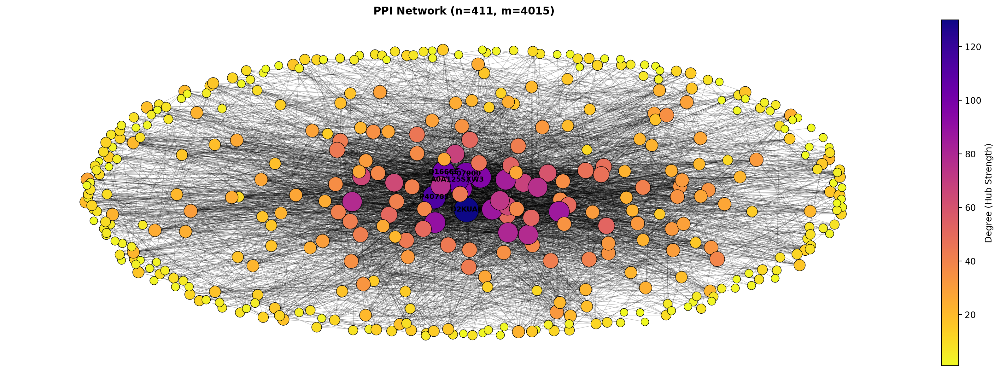


=== Top 5 hubs in PPI ===
         Node  Degree
0      D2KUA6     130
1      P40763     113
2  A0A125SXW3     106
3      Q16665     103
4      P07900      99
Gambar jaringan disimpan ke: D:/semhas/Data/DDI_Network_Hub.png


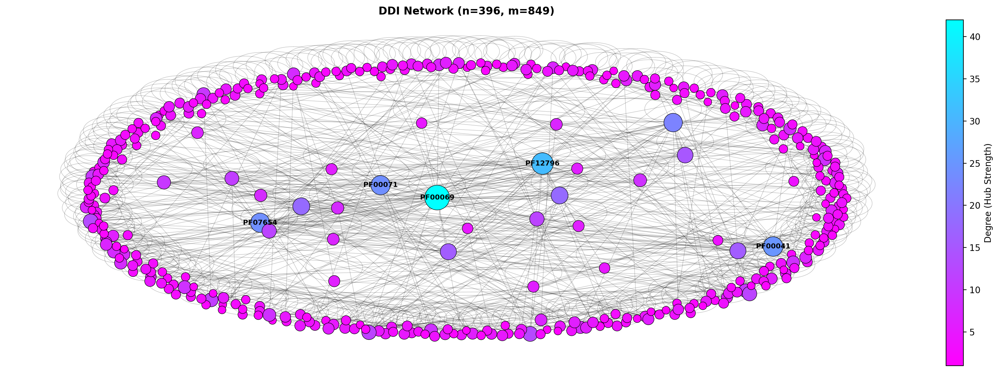


=== Top 5 hubs in DDI ===
      Node  Degree
0  PF00069      42
1  PF12796      31
2  PF00041      25
3  PF07654      24
4  PF00071      24


In [38]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# === 1. --- Baca Data ===
ppi_df = pd.read_excel(
    "D:/semhas/Data/PPI_filtered_targets_full.xlsx",
    sheet_name="PPI_with_UniProt"
)[['node1_UniProt', 'node2_UniProt']].dropna()

ddi_df = pd.read_excel(
    "D:/semhas/Data/DDI_relevan.xlsx",
    sheet_name=0
)[['Domain_1', 'Domain_2']].dropna()

pda_df = pd.read_excel(
    "D:/semhas/Data/PDA_results.xlsx"
)[['Protein_1', 'Protein_2', 'Domain_1', 'Domain_2']].dropna()

# === 2. --- PPI Network ===
G_ppi = nx.Graph()
G_ppi.add_edges_from(ppi_df.values)
ppi_deg = dict(G_ppi.degree())
ppi_norm = Normalize(vmin=min(ppi_deg.values()), vmax=max(ppi_deg.values()))
ppi_colors = {n: plt.cm.plasma_r(ppi_norm(d)) for n, d in ppi_deg.items()}

# === 3. --- DDI Network ===
G_ddi = nx.Graph()
G_ddi.add_edges_from(ddi_df.values)
ddi_deg = dict(G_ddi.degree())
ddi_norm = Normalize(vmin=min(ddi_deg.values()), vmax=max(ddi_deg.values()))
ddi_colors = {n: plt.cm.cool_r(ddi_norm(d)) for n, d in ddi_deg.items()}

# === 4. --- PDA Network ===
G_pda = nx.Graph()
for _, row in pda_df.iterrows():
    G_pda.add_edge(row['Protein_1'], row['Domain_1'])
    G_pda.add_edge(row['Protein_2'], row['Domain_2'])
pda_deg = dict(G_pda.degree())

# Warna PDA mengikuti warna protein/domain
pda_colors = []
for n in G_pda.nodes():
    if n in ppi_colors:
        pda_colors.append(ppi_colors[n])
    elif n in ddi_colors:
        pda_colors.append(ddi_colors[n])
    else:
        pda_colors.append("#D3D3D3")

# Fungsi menampilkan hub utama dalam bentuk tabel
def display_top_hubs(degrees, top_n=5, node_type_dict=None, network_name="Network"):
    top_nodes = sorted(degrees, key=degrees.get, reverse=True)[:top_n]
    data = {
        "Node": top_nodes,
        "Degree": [degrees[n] for n in top_nodes]
    }
    if node_type_dict:
        data["Type"] = [node_type_dict.get(n, "Unknown") for n in top_nodes]
    df = pd.DataFrame(data)
    print(f"\n=== Top {top_n} hubs in {network_name} ===")
    print(df)
    return df

# Tentukan tipe node untuk PDA
pda_node_type = {}
for n in G_pda.nodes():
    if n in ppi_colors:
        pda_node_type[n] = "Protein"
    elif n in ddi_colors:
        pda_node_type[n] = "Domain"
    else:
        pda_node_type[n] = "Unknown"

# Fungsi visualisasi
def draw_network_horizontal_with_hub(G, degrees, node_colors, title, cmap=None, pos_seed=42, save_path=None):
    fig, ax = plt.subplots(figsize=(16, 6), dpi=200)
    pos = nx.spring_layout(G, k=2.3, iterations=100, seed=pos_seed)

    # Ukuran node
    min_size, max_size = 80, 800
    vmin, vmax = min(degrees.values()), max(degrees.values())
    node_sizes = [
        min_size + (degrees[n] - vmin) / (vmax - vmin + 1e-9) * (max_size - min_size)
        for n in G.nodes()
    ]

    # Top 5 hub untuk label
    top_nodes = sorted(degrees, key=degrees.get, reverse=True)[:5]

    # Gambar edges
    nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.25, width=0.5)

    # Gambar node
    nodes = nx.draw_networkx_nodes(
        G, pos, ax=ax,
        node_size=node_sizes,
        node_color=node_colors,
        edgecolors='black',
        linewidths=0.5
    )

    # Label hub utama
    labels = {n: n for n in top_nodes}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, font_weight='bold', font_color='black', ax=ax)

    # Colorbar jika node_colors berbasis degree
    if cmap is not None:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=Normalize(vmin=vmin, vmax=vmax))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
        cbar.set_label('Degree (Hub Strength)')

    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
        print(f"Gambar jaringan disimpan ke: {save_path}")
    plt.show()

# === 6. --- Visualisasi & Tabel hub utama ===

# PPI
draw_network_horizontal_with_hub(
    G_ppi,
    ppi_deg,
    [ppi_colors[n] for n in G_ppi.nodes()],
    title=f"PPI Network (n={G_ppi.number_of_nodes()}, m={G_ppi.number_of_edges()})",
    cmap=plt.cm.plasma_r,
    save_path="D:/semhas/Data/PPI_Network_Hub.png"
)
ppi_hub_df = display_top_hubs(ppi_deg, top_n=5, network_name="PPI")

# DDI
draw_network_horizontal_with_hub(
    G_ddi,
    ddi_deg,
    [ddi_colors[n] for n in G_ddi.nodes()],
    title=f"DDI Network (n={G_ddi.number_of_nodes()}, m={G_ddi.number_of_edges()})",
    cmap=plt.cm.cool_r,
    save_path="D:/semhas/Data/DDI_Network_Hub.png"
)
ddi_hub_df = display_top_hubs(ddi_deg, top_n=5, network_name="DDI")



Jumlah node di graph PDA (Protein:Domain aktif): 489
Jumlah protein unik: 281
Jumlah domain unik : 186
Gambar jaringan disimpan ke: D:/semhas/Data/PDA_Network_Matrix_Fixed.png


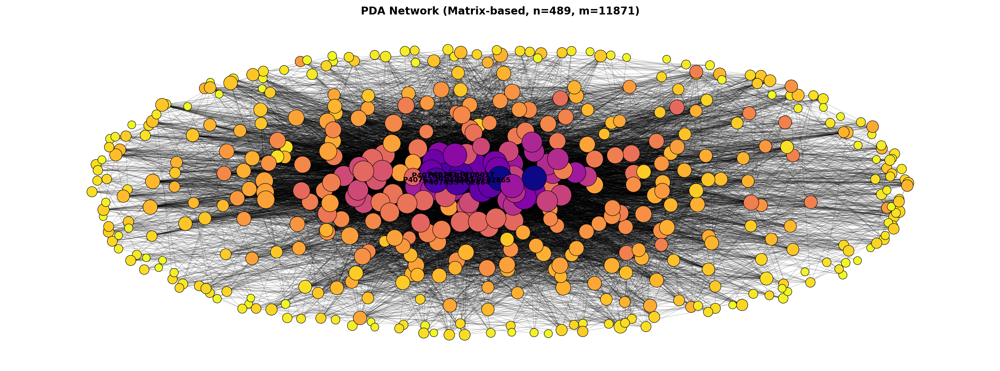


=== Top 5 hubs in PDA (Matrix-Fixed) ===
             Node  Degree     Type
0  P40763:PF02865     187  Protein
1  P40763:PF01017     187  Protein
2  P40763:PF00017     187  Protein
3  P40763:PF02864     187  Protein
4  P40763:PF21354     187  Protein


In [37]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# === 1. Baca data dan bersihkan string ===
ppi_df = pd.read_excel(
    "D:/semhas/Data/PPI_filtered_targets_full.xlsx",
    sheet_name="PPI_with_UniProt"
)[['node1_UniProt', 'node2_UniProt']].dropna()

ppi_df['node1_UniProt'] = ppi_df['node1_UniProt'].map(lambda x: str(x).strip())
ppi_df['node2_UniProt'] = ppi_df['node2_UniProt'].map(lambda x: str(x).strip())

ddi_df = pd.read_excel(
    "D:/semhas/Data/DDI_relevan.xlsx",
    sheet_name=0
)[['Domain_1', 'Domain_2']].dropna()

ddi_df['Domain_1'] = ddi_df['Domain_1'].map(lambda x: str(x).strip())
ddi_df['Domain_2'] = ddi_df['Domain_2'].map(lambda x: str(x).strip())

matrix_df = pd.read_excel(
    "D:/semhas/Data/PDA_results.xlsx",
    sheet_name="Protein_Domain_Matrix",
    index_col=0
)
matrix_df.index = matrix_df.index.astype(str).str.strip()
matrix_df.columns = matrix_df.columns.astype(str).str.strip()

# === 2. PPI & DDI Networks untuk pewarnaan ===
G_ppi = nx.Graph()
G_ppi.add_edges_from(ppi_df.values)
ppi_deg = dict(G_ppi.degree())
ppi_norm = Normalize(vmin=min(ppi_deg.values()), vmax=max(ppi_deg.values()))
ppi_colors = {n: plt.cm.plasma_r(ppi_norm(d)) for n, d in ppi_deg.items()}

G_ddi = nx.Graph()
G_ddi.add_edges_from(ddi_df.values)
ddi_deg = dict(G_ddi.degree())
ddi_norm = Normalize(vmin=min(ddi_deg.values()), vmax=max(ddi_deg.values()))
ddi_colors = {n: plt.cm.cool_r(ddi_norm(d)) for n, d in ddi_deg.items()}

# === 3. Buat PDA Network dari matriks ===
active_nodes = set(f"{p}:{d}" for p in matrix_df.index for d in matrix_df.columns if matrix_df.at[p,d]==1)
G_pda = nx.Graph()
G_pda.add_nodes_from(active_nodes)

ppi_set = set(map(tuple, ppi_df.values))
for i, protein1 in enumerate(matrix_df.index):
    for protein2 in matrix_df.index[i+1:]:
        if (protein1, protein2) in ppi_set or (protein2, protein1) in ppi_set:
            domains1 = [d for d in matrix_df.columns if matrix_df.at[protein1,d]==1]
            domains2 = [d for d in matrix_df.columns if matrix_df.at[protein2,d]==1]
            for d1 in domains1:
                for d2 in domains2:
                    node1 = f"{protein1}:{d1}"
                    node2 = f"{protein2}:{d2}"
                    if node1 in active_nodes and node2 in active_nodes:
                        G_pda.add_edge(node1, node2)

print("Jumlah node di graph PDA (Protein:Domain aktif):", G_pda.number_of_nodes())  # biasanya 489

# Hitung protein unik dan domain unik
proteins = set(n.split(":")[0] for n in active_nodes)
domains = set(n.split(":")[1] for n in active_nodes)
print("Jumlah protein unik:", len(proteins))  # biasanya 467
print("Jumlah domain unik :", len(domains))

# === 4. Pewarnaan node PDA ===
pda_colors = []
pda_node_type = {}
for n in G_pda.nodes():
    protein, domain = n.split(":")
    if protein in ppi_colors:
        pda_colors.append(ppi_colors[protein])
        pda_node_type[n] = "Protein"
    elif domain in ddi_colors:
        pda_colors.append(ddi_colors[domain])
        pda_node_type[n] = "Domain"
    else:
        pda_colors.append("#D3D3D3")
        pda_node_type[n] = "Unknown"

# === 5. Hitung derajat PDA ===
pda_deg = dict(G_pda.degree())

# === 6. Fungsi visualisasi GRF-style ===
def draw_network_horizontal_with_hub(G, degrees, node_colors, title, cmap=None, pos_seed=42, save_path=None):
    fig, ax = plt.subplots(figsize=(16, 6), dpi=200)
    pos = nx.spring_layout(G, k=2.3, iterations=100, seed=pos_seed)
    min_size, max_size = 80, 800
    vmin, vmax = min(degrees.values()), max(degrees.values())
    node_sizes = [min_size + (degrees[n]-vmin)/(vmax-vmin+1e-9)*(max_size-min_size) for n in G.nodes()]
    top_nodes = sorted(degrees, key=degrees.get, reverse=True)[:5]

    nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.25, width=0.5)
    nx.draw_networkx_nodes(G, pos, ax=ax, node_size=node_sizes, node_color=node_colors, edgecolors='black', linewidths=0.5)
    labels = {n: n for n in top_nodes}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, font_weight='bold', font_color='black', ax=ax)

    if cmap:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=Normalize(vmin=vmin, vmax=vmax))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
        cbar.set_label('Degree (Hub Strength)')

    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
        print(f"Gambar jaringan disimpan ke: {save_path}")
    plt.show()

# Visualisasi PDA
draw_network_horizontal_with_hub(
    G_pda,
    pda_deg,
    pda_colors,
    title=f"PDA Network (Matrix-based, n={G_pda.number_of_nodes()}, m={G_pda.number_of_edges()})",
    cmap=None,
    save_path="D:/semhas/Data/PDA_Network_Matrix_Fixed.png"
)

# Tampilkan top hubs PDA
def display_top_hubs(degrees, top_n=5, node_type_dict=None, network_name="Network"):
    top_nodes = sorted(degrees, key=degrees.get, reverse=True)[:top_n]
    data = {"Node": top_nodes, "Degree": [degrees[n] for n in top_nodes]}
    if node_type_dict:
        data["Type"] = [node_type_dict.get(n,"Unknown") for n in top_nodes]
    df = pd.DataFrame(data)
    print(f"\n=== Top {top_n} hubs in {network_name} ===")
    print(df)
    return df

pda_hub_df = display_top_hubs(pda_deg, top_n=5, node_type_dict=pda_node_type, network_name="PDA (Matrix-Fixed)")


In [ ]:
#Matrik Keanggotaan

In [39]:
import pandas as pd
import networkx as nx

# === 1. --- Matriks adjacency ===

def adjacency_matrix_df(G):
    """
    Menghasilkan matriks adjacency dari networkx Graph sebagai pandas DataFrame.
    """
    nodes = list(G.nodes())
    adj_matrix = nx.to_pandas_adjacency(G, nodelist=nodes, dtype=int)
    return adj_matrix

# PPI
ppi_adj_df = adjacency_matrix_df(G_ppi)
print("PPI adjacency matrix:")
print(ppi_adj_df)
# Simpan ke Excel
ppi_adj_df.to_excel("D:/semhas/Data/PPI_Adjacency.xlsx")

# DDI
ddi_adj_df = adjacency_matrix_df(G_ddi)
print("DDI adjacency matrix:")
print(ddi_adj_df)
ddi_adj_df.to_excel("D:/semhas/Data/DDI_Adjacency.xlsx")

# PDA
pda_adj_df = adjacency_matrix_df(G_pda)
print("PDA adjacency matrix:")
print(pda_adj_df)
pda_adj_df.to_excel("D:/semhas/Data/PDA_Adjacency.xlsx")


PPI adjacency matrix:
            Q2M2I8  P50052  P08172  P33527  P40763  O75469  A6NFX1  P27487  \
Q2M2I8           0       1       1       0       0       0       0       0   
P50052           1       0       1       0       0       0       0       1   
P08172           1       1       0       0       0       0       0       0   
P33527           0       0       0       0       1       1       1       1   
P40763           0       0       0       1       0       0       0       1   
...            ...     ...     ...     ...     ...     ...     ...     ...   
Q8TD20           0       0       0       0       0       0       0       0   
Q7Z2T5           0       0       0       0       0       0       0       0   
Q96EC8           0       0       0       0       0       0       0       0   
A0A087X266       0       0       0       0       0       0       0       0   
A0PK00           0       0       0       0       0       0       0       0   

            P09211  Q16665  ...  Q5SV97  

In [ ]:
#dengan heatmap

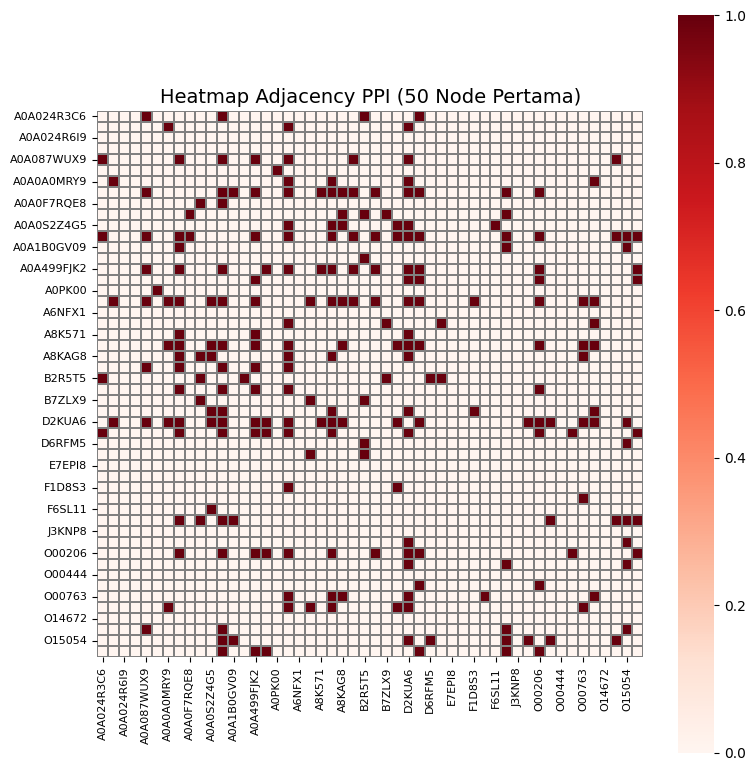

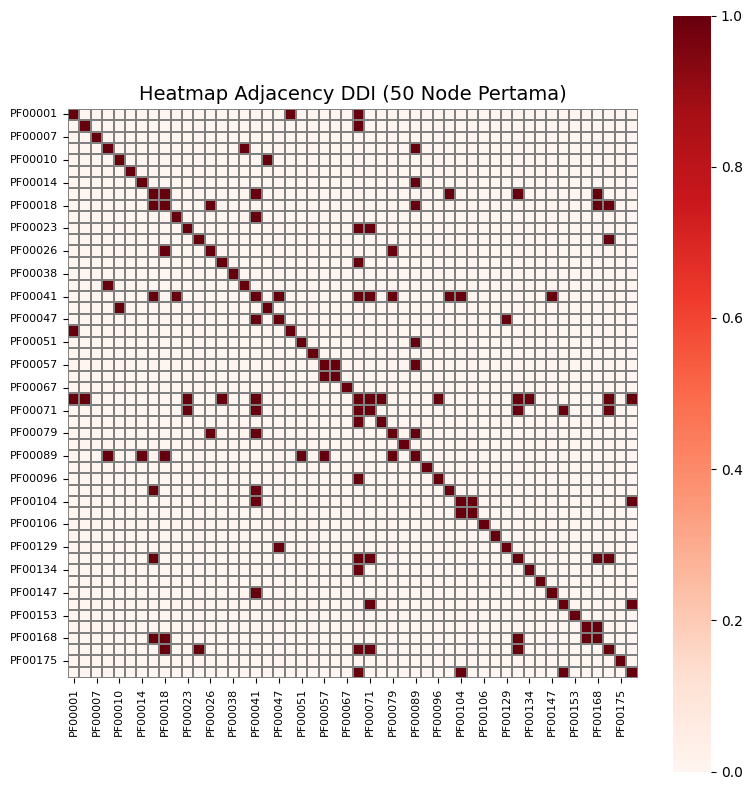

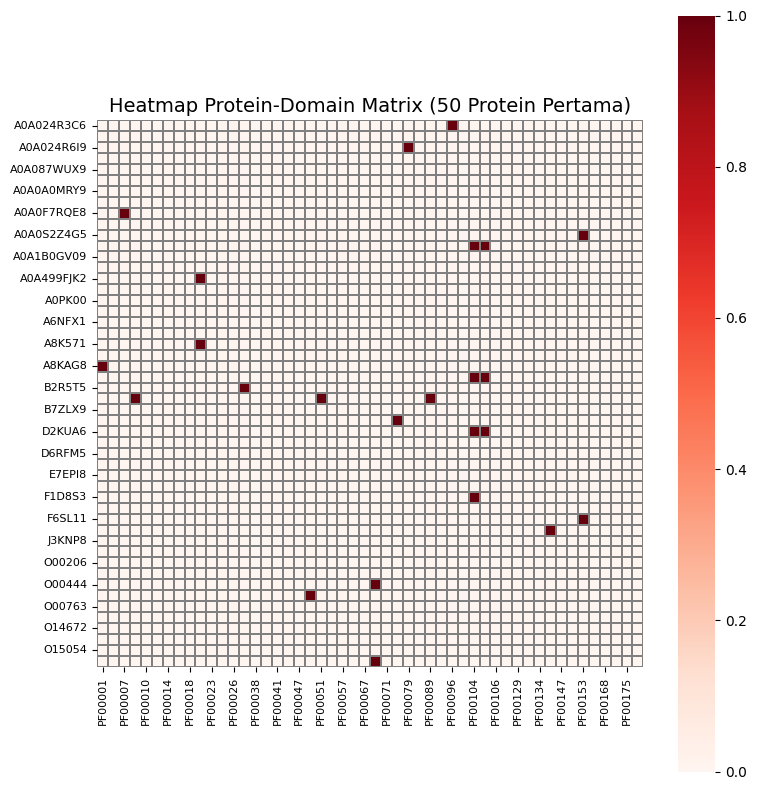

In [60]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# === 1. Baca data ===
ppi_df = pd.read_excel(
    "D:/semhas/Data/PPI_filtered_targets_full.xlsx",
    sheet_name="PPI_with_UniProt"
)[['node1_UniProt', 'node2_UniProt']].dropna()

ddi_df = pd.read_excel(
    "D:/semhas/Data/DDI_relevan.xlsx",
    sheet_name=0
)[['Domain_1', 'Domain_2']].dropna()

pda_df = pd.read_excel(
    "D:/semhas/Data/PDA_results.xlsx",
    sheet_name="Protein_Domain_Matrix",
    index_col=0
)

# Bersihkan string
ppi_df['node1_UniProt'] = ppi_df['node1_UniProt'].map(str).str.strip()
ppi_df['node2_UniProt'] = ppi_df['node2_UniProt'].map(str).str.strip()
ddi_df['Domain_1'] = ddi_df['Domain_1'].map(str).str.strip()
ddi_df['Domain_2'] = ddi_df['Domain_2'].map(str).str.strip()
pda_df.columns = pda_df.columns.map(str).str.strip()
pda_df.index = pda_df.index.map(str).str.strip()

# === 2. Buat adjacency PPI ===
ppi_nodes = sorted(set(ppi_df['node1_UniProt']).union(ppi_df['node2_UniProt']))
ppi_adj = pd.DataFrame(0, index=ppi_nodes, columns=ppi_nodes)

for _, row in ppi_df.iterrows():
    ppi_adj.at[row['node1_UniProt'], row['node2_UniProt']] = 1
    ppi_adj.at[row['node2_UniProt'], row['node1_UniProt']] = 1  # symmetric

# === 3. Buat adjacency DDI ===
ddi_nodes = sorted(set(ddi_df['Domain_1']).union(ddi_df['Domain_2']))
ddi_adj = pd.DataFrame(0, index=ddi_nodes, columns=ddi_nodes)

for _, row in ddi_df.iterrows():
    ddi_adj.at[row['Domain_1'], row['Domain_2']] = 1
    ddi_adj.at[row['Domain_2'], row['Domain_1']] = 1

# === 4. Buat adjacency PDA (Protein × Domain) ===
pda_nodes_protein = pda_df.index.tolist()
pda_nodes_domain = pda_df.columns.tolist()
pda_adj = pda_df.copy()  # sudah berupa 0/1 matrix, rows=protein, cols=domain

# === 5. Fungsi plot heatmap ===
def plot_heatmap(df, title, figsize=(8,8), save_path=None):
    plt.figure(figsize=figsize)
    sns.heatmap(df, cmap="Reds", linewidths=0.1, linecolor='gray', cbar=True, square=True)
    plt.title(title, fontsize=14)
    plt.xticks(rotation=90, fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Heatmap disimpan ke: {save_path}")
    plt.show()

# === 6. Plot heatmap ===
# PPI
plot_heatmap(ppi_adj.iloc[:50, :50], "Heatmap Adjacency PPI (50 Node Pertama)")

# DDI
plot_heatmap(ddi_adj.iloc[:50, :50], "Heatmap Adjacency DDI (50 Node Pertama)")

# PDA
plot_heatmap(pda_adj.iloc[:50, :50], "Heatmap Protein-Domain Matrix (50 Protein Pertama)")


#MNC

In [ ]:
*Inisialisasi H dan H1

Domain cocok : 163
Protein cocok: 209


C:\Users\puspitasariindah\AppData\Local\Temp\ipykernel_7104\1307141475.py:53: RuntimeWarning: invalid value encountered in divide
  H_ppi = H_ppi / H_ppi.sum(axis=1, keepdims=True)
D:\Python\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
D:\Python\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


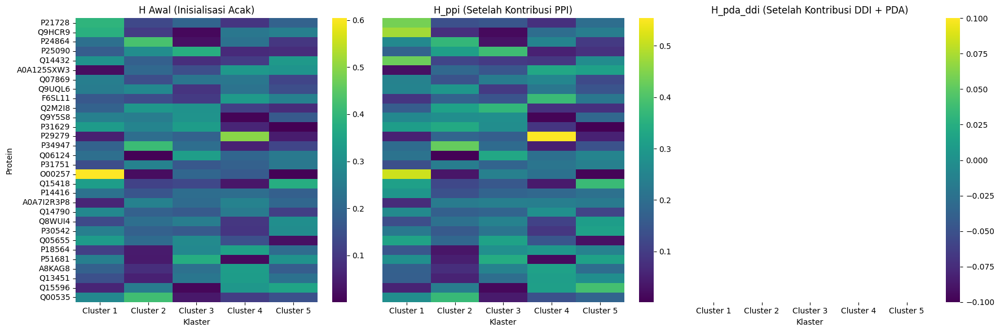

OSError: Cannot save file into a non-existent directory: 'D:\semhas\Output'

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# === 1️⃣ Load data adjacency dari file Excel
# ============================================================

ppi_file = "D:/semhas/Data/PPI_Adjacency.xlsx"
ddi_file = "D:/semhas/Data/DDI_Adjacency.xlsx"
pda_file = "D:/semhas/Data/PDA_Adjacency.xlsx"

A1_df = pd.read_excel(ppi_file, index_col=0)   # PPI
A2_df = pd.read_excel(ddi_file, index_col=0)   # DDI
F_df  = pd.read_excel(pda_file, index_col=0)   # PDA

# ============================================================
# === 2️⃣ Sinkronisasi domain dan protein di semua matriks
# ============================================================

common_domains  = list(set(A2_df.index) & set(F_df.index))
common_proteins = list(set(A1_df.index) & set(F_df.columns))

A1_filtered = A1_df.loc[common_proteins, common_proteins].values
A2_filtered = A2_df.loc[common_domains, common_domains].values
F_filtered  = F_df.loc[common_domains, common_proteins].values

print(f"Domain cocok : {len(common_domains)}")
print(f"Protein cocok: {len(common_proteins)}")

# ============================================================
# === 3️⃣ Inisialisasi H secara acak
# ============================================================

k_clusters = 5
n_proteins = len(common_proteins)

H = np.random.rand(n_proteins, k_clusters)
H = H / H.sum(axis=1, keepdims=True)
H_init = H.copy()  # Simpan versi awal untuk perbandingan

# ============================================================
# === 4️⃣ Satu langkah pembaruan H (untuk visualisasi)
# ============================================================

epsilon = 1e-9

# --- Kontribusi dari PPI ---
numerator_ppi = A1_filtered @ H
denominator_ppi = (H @ H.T) @ H + epsilon
H_ppi = H * (numerator_ppi / denominator_ppi)
H_ppi = H_ppi / H_ppi.sum(axis=1, keepdims=True)

# --- Kontribusi dari DDI + PDA ---
numerator_ddi_pda = F_filtered.T @ A2_filtered @ F_filtered @ H_ppi
denominator_ddi_pda = (F_filtered.T @ F_filtered @ H_ppi @ H_ppi.T @ 
                       F_filtered.T @ F_filtered @ H_ppi) + epsilon
H_pda_ddi = H_ppi * (numerator_ddi_pda / denominator_ddi_pda)
H_pda_ddi = H_pda_ddi / H_pda_ddi.sum(axis=1, keepdims=True)

# ============================================================
# === 5️⃣ Visualisasi Heatmap 3 Tahap: H, H_ppi, H_pda_ddi
# ============================================================

subset_size = min(30, len(common_proteins))
cluster_labels = [f"Cluster {i+1}" for i in range(k_clusters)]
protein_labels = common_proteins[:subset_size]

plt.figure(figsize=(18, 6))

# --- H awal ---
plt.subplot(1, 3, 1)
sns.heatmap(H_init[:subset_size, :], cmap="viridis", cbar=True,
            xticklabels=cluster_labels, yticklabels=protein_labels)
plt.title("H Awal (Inisialisasi Acak)")
plt.xlabel("Klaster")
plt.ylabel("Protein")

# --- H_ppi ---
plt.subplot(1, 3, 2)
sns.heatmap(H_ppi[:subset_size, :], cmap="viridis", cbar=True,
            xticklabels=cluster_labels, yticklabels=False)
plt.title("H_ppi (Setelah Kontribusi PPI)")
plt.xlabel("Klaster")

# --- H_pda_ddi ---
plt.subplot(1, 3, 3)
sns.heatmap(H_pda_ddi[:subset_size, :], cmap="viridis", cbar=True,
            xticklabels=cluster_labels, yticklabels=False)
plt.title("H_pda_ddi (Setelah Kontribusi DDI + PDA)")
plt.xlabel("Klaster")

plt.tight_layout()
plt.show()

# ============================================================
# === 6️⃣ Simpan hasil ke Excel
# ============================================================

H_init_df     = pd.DataFrame(H_init, index=common_proteins, columns=[f"Cluster_{i+1}" for i in range(k_clusters)])
H_ppi_df      = pd.DataFrame(H_ppi, index=common_proteins, columns=[f"Cluster_{i+1}" for i in range(k_clusters)])
H_pda_ddi_df  = pd.DataFrame(H_pda_ddi, index=common_proteins, columns=[f"Cluster_{i+1}" for i in range(k_clusters)])

output_file = "D:/semhas/Output/H_Heatmap_Comparison.xlsx"
with pd.ExcelWriter(output_file) as writer:
    H_init_df.to_excel(writer, sheet_name="H_awal")
    H_ppi_df.to_excel(writer, sheet_name="H_ppi")
    H_pda_ddi_df.to_excel(writer, sheet_name="H_pda_ddi")

print(f"\n✅ Semua hasil disimpan ke: {output_file}")


In [ ]:
#Heatmap H1

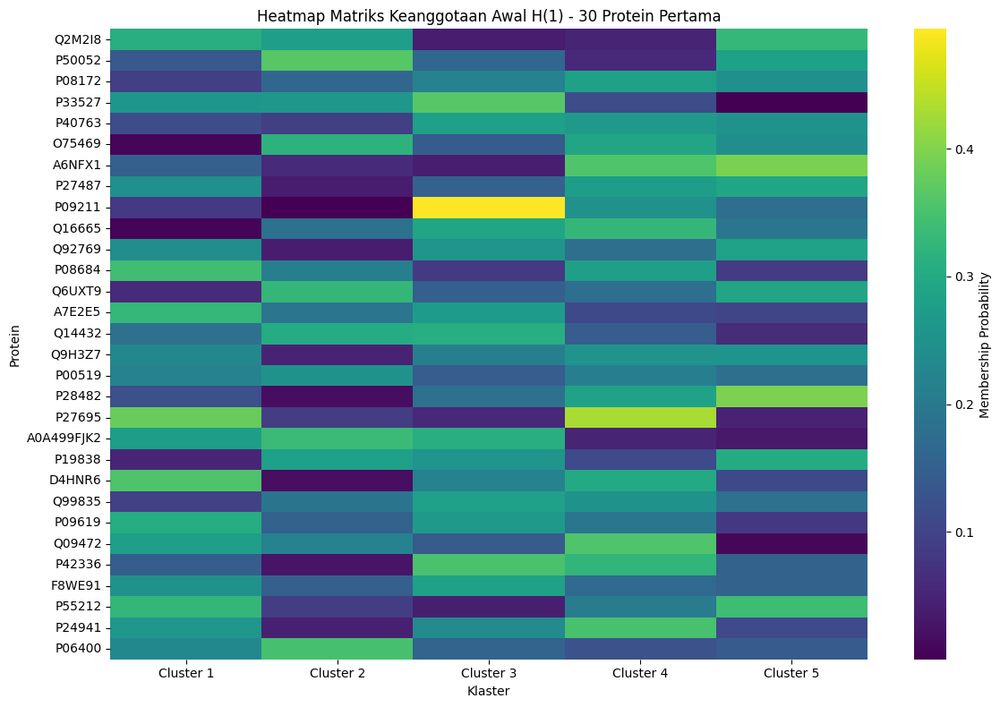

In [8]:
# === 5. Buat DataFrame untuk heatmap, hanya 50 protein pertama ===
H_df = pd.DataFrame(H[:30, :], index=proteins[:30], columns=[f'Cluster {i+1}' for i in range(k_clusters)])

# === 6. Plot heatmap ===
plt.figure(figsize=(12, 8))
sns.heatmap(H_df, cmap='viridis', cbar_kws={'label': 'Membership Probability'})
plt.title('Heatmap Matriks Keanggotaan Awal H(1) - 30 Protein Pertama')
plt.xlabel('Klaster')
plt.ylabel('Protein')
plt.tight_layout()
plt.show()

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# === 1. Load data adjacency PPI (A1), DDI (A2), dan PDA (F)
# ============================================================

ppi_file = "D:/semhas/Data/PPI_Adjacency.xlsx"
ddi_file = "D:/semhas/Data/DDI_Adjacency.xlsx"
pda_file = "D:/semhas/Data/PDA_Adjacency.xlsx"

A1_df = pd.read_excel(ppi_file, index_col=0)
A2_df = pd.read_excel(ddi_file, index_col=0)
F_df = pd.read_excel(pda_file, index_col=0)

# ============================================================
# === 2. Filter domain dan protein agar konsisten
# ============================================================

common_domains = list(set(A2_df.index) & set(F_df.index))
common_proteins = list(set(A1_df.index) & set(F_df.columns))

print(f"Jumlah domain common : {len(common_domains)}")
print(f"Jumlah protein common: {len(common_proteins)}")

A1_filtered = A1_df.loc[common_proteins, common_proteins].values
A2_filtered = A2_df.loc[common_domains, common_domains].values
F_filtered = F_df.loc[common_domains, common_proteins].values

# ============================================================
# === 3. Inisialisasi H acak (n_protein x k)
# ============================================================

k = 5
n_proteins = len(common_proteins)
H = np.random.rand(n_proteins, k)
H = H / H.sum(axis=1, keepdims=True)

# ============================================================
# === 4. Iterasi update H dan tampilkan H_ppi & H_pda_ddi
# ============================================================

max_iter = 10   # cukup 10 iterasi biar bisa lihat progres
tol = 1e-6
epsilon = 1e-9

for it in range(max_iter):
    H_old = H.copy()

    # --- Kontribusi dari PPI ---
    numerator_ppi = A1_filtered @ H
    denominator_ppi = (H @ H.T) @ H + epsilon
    H_ppi = H * (numerator_ppi / denominator_ppi)
    H_ppi = H_ppi / H_ppi.sum(axis=1, keepdims=True)

    # --- Kontribusi dari DDI & PDA ---
    numerator_ddi_pda = F_filtered.T @ A2_filtered @ F_filtered @ H_ppi
    denominator_ddi_pda = (F_filtered.T @ F_filtered @ H_ppi @ H_ppi.T @ 
                           F_filtered.T @ F_filtered @ H_ppi) + epsilon

    H_pda_ddi = H_ppi * (numerator_ddi_pda / denominator_ddi_pda)
    H_pda_ddi = H_pda_ddi / H_pda_ddi.sum(axis=1, keepdims=True)

    # Update H
    H = H_pda_ddi.copy()

    diff = np.linalg.norm(H - H_old, ord='fro')
    print(f"Iterasi {it+1:02d}: diff = {diff:.4e}")

    # === Tampilkan sebagian isi matriks tiap iterasi ===
    if (it + 1) % 5 == 0 or it == 0:
        print("\n--- Contoh nilai (5 protein pertama) ---")
        H_df = pd.DataFrame(H[:5], columns=[f'C{i+1}' for i in range(k)])
        H_ppi_df = pd.DataFrame(H_ppi[:5], columns=[f'C{i+1}' for i in range(k)])
        H_pda_ddi_df = pd.DataFrame(H_pda_ddi[:5], columns=[f'C{i+1}' for i in range(k)])

        print("H (awal):")
        print(H_df.round(4))
        print("\nH_ppi (setelah kontribusi PPI):")
        print(H_ppi_df.round(4))
        print("\nH_pda_ddi (setelah kontribusi DDI+PDA):")
        print(H_pda_ddi_df.round(4))
        print("====================================\n")

    if diff < tol:
        print(f"\n✅ Konvergen setelah {it+1} iterasi (diff={diff:.2e})")
        break
else:
    print(f"\n⚠ Tidak konvergen setelah {max_iter} iterasi (diff={diff:.2e})")

# ============================================================
# === 5. Simpan hasil ke Excel untuk diperiksa lebih detail
# ============================================================

H_df_final = pd.DataFrame(H, index=common_proteins, columns=[f'Cluster_{i+1}' for i in range(k)])
H_ppi_df_final = pd.DataFrame(H_ppi, index=common_proteins, columns=[f'Cluster_{i+1}' for i in range(k)])
H_pda_ddi_df_final = pd.DataFrame(H_pda_ddi, index=common_proteins, columns=[f'Cluster_{i+1}' for i in range(k)])

with pd.ExcelWriter("D:/semhas/Output/H_matrices_detailed.xlsx") as writer:
    H_df_final.to_excel(writer, sheet_name="H_final")
    H_ppi_df_final.to_excel(writer, sheet_name="H_ppi")
    H_pda_ddi_df_final.to_excel(writer, sheet_name="H_pda_ddi")

print("\n✅ Semua matriks (H, H_ppi, H_pda_ddi) disimpan ke:")
print("   D:/semhas/Output/H_matrices_detailed.xlsx")

# ============================================================
# === 6. Visualisasi Heatmap H final
# ============================================================

subset_size = min(30, len(common_proteins))
plt.figure(figsize=(8, 6))
sns.heatmap(
    H[:subset_size, :], cmap="viridis", cbar=True,
    xticklabels=[f"Cluster {i+1}" for i in range(k)],
    yticklabels=common_proteins[:subset_size]
)
plt.title("Heatmap Matriks Keanggotaan H Final (30 Protein Pertama)")
plt.xlabel("Klaster")
plt.ylabel("Protein")
plt.tight_layout()
plt.show()


Jumlah domain common : 163
Jumlah protein common: 209


C:\Users\puspitasariindah\AppData\Local\Temp\ipykernel_7104\2234356484.py:56: RuntimeWarning: invalid value encountered in divide
  H_ppi = H_ppi / H_ppi.sum(axis=1, keepdims=True)


Iterasi 01: diff = nan

--- Contoh nilai (5 protein pertama) ---
H (awal):
   C1  C2  C3  C4  C5
0 NaN NaN NaN NaN NaN
1 NaN NaN NaN NaN NaN
2 NaN NaN NaN NaN NaN
3 NaN NaN NaN NaN NaN
4 NaN NaN NaN NaN NaN

H_ppi (setelah kontribusi PPI):
       C1      C2      C3      C4      C5
0  0.2294  0.2269  0.2899  0.1188  0.1350
1  0.2963  0.3076  0.0105  0.1458  0.2399
2  0.2648  0.2946  0.2540  0.0304  0.1561
3  0.2712  0.3035  0.1285  0.2284  0.0684
4  0.3289  0.2601  0.0685  0.1313  0.2112

H_pda_ddi (setelah kontribusi DDI+PDA):
   C1  C2  C3  C4  C5
0 NaN NaN NaN NaN NaN
1 NaN NaN NaN NaN NaN
2 NaN NaN NaN NaN NaN
3 NaN NaN NaN NaN NaN
4 NaN NaN NaN NaN NaN

Iterasi 02: diff = nan
Iterasi 03: diff = nan
Iterasi 04: diff = nan
Iterasi 05: diff = nan

--- Contoh nilai (5 protein pertama) ---
H (awal):
   C1  C2  C3  C4  C5
0 NaN NaN NaN NaN NaN
1 NaN NaN NaN NaN NaN
2 NaN NaN NaN NaN NaN
3 NaN NaN NaN NaN NaN
4 NaN NaN NaN NaN NaN

H_ppi (setelah kontribusi PPI):
   C1  C2  C3  C4  C5
0 N

OSError: Cannot save file into a non-existent directory: 'D:\semhas\Output'

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# === 1. Load data adjacency PPI (A1), DDI (A2), dan PDA (F)
# ============================================================

ppi_file = "D:/semhas/Data/PPI_Adjacency.xlsx"
ddi_file = "D:/semhas/Data/DDI_Adjacency.xlsx"
pda_file = "D:/semhas/Data/PDA_Adjacency.xlsx"

A1_df = pd.read_excel(ppi_file, index_col=0)
A2_df = pd.read_excel(ddi_file, index_col=0)
F_df = pd.read_excel(pda_file, index_col=0)

# ============================================================
# === 2. Filter domain dan protein agar konsisten
# ============================================================

common_domains = list(set(A2_df.index) & set(F_df.index))
common_proteins = list(set(A1_df.index) & set(F_df.columns))

print(f"Jumlah domain common : {len(common_domains)}")
print(f"Jumlah protein common: {len(common_proteins)}")

A1_filtered = A1_df.loc[common_proteins, common_proteins].values
A2_filtered = A2_df.loc[common_domains, common_domains].values
F_filtered = F_df.loc[common_domains, common_proteins].values

# ============================================================
# === 3. Inisialisasi H acak (n_protein x k)
# ============================================================

k = 5
n_proteins = len(common_proteins)
H = np.random.rand(n_proteins, k)
H = H / H.sum(axis=1, keepdims=True)

# ============================================================
# === 4. Iterasi update H dan tampilkan H_ppi & H_pda_ddi
# ============================================================

max_iter = 10   # cukup 10 iterasi biar bisa lihat progres
tol = 1e-6
epsilon = 1e-9

for it in range(max_iter):
    H_old = H.copy()

    # --- Kontribusi dari PPI ---
    numerator_ppi = A1_filtered @ H
    denominator_ppi = (H @ H.T) @ H + epsilon
    H_ppi = H * (numerator_ppi / denominator_ppi)
    H_ppi = H_ppi / H_ppi.sum(axis=1, keepdims=True)

    # --- Kontribusi dari DDI & PDA ---
    numerator_ddi_pda = F_filtered.T @ A2_filtered @ F_filtered @ H_ppi
    denominator_ddi_pda = (F_filtered.T @ F_filtered @ H_ppi @ H_ppi.T @ 
                           F_filtered.T @ F_filtered @ H_ppi) + epsilon

    H_pda_ddi = H_ppi * (numerator_ddi_pda / denominator_ddi_pda)
    H_pda_ddi = H_pda_ddi / H_pda_ddi.sum(axis=1, keepdims=True)

    # Update H
    H = H_pda_ddi.copy()

    diff = np.linalg.norm(H - H_old, ord='fro')
    print(f"Iterasi {it+1:02d}: diff = {diff:.4e}")

    # === Tampilkan sebagian isi matriks tiap iterasi ===
    if (it + 1) % 5 == 0 or it == 0:
        print("\n--- Contoh nilai (5 protein pertama) ---")
        H_df = pd.DataFrame(H[:5], columns=[f'C{i+1}' for i in range(k)])
        H_ppi_df = pd.DataFrame(H_ppi[:5], columns=[f'C{i+1}' for i in range(k)])
        H_pda_ddi_df = pd.DataFrame(H_pda_ddi[:5], columns=[f'C{i+1}' for i in range(k)])

        print("H (awal):")
        print(H_df.round(4))
        print("\nH_ppi (setelah kontribusi PPI):")
        print(H_ppi_df.round(4))
        print("\nH_pda_ddi (setelah kontribusi DDI+PDA):")
        print(H_pda_ddi_df.round(4))
        print("====================================\n")

    if diff < tol:
        print(f"\n✅ Konvergen setelah {it+1} iterasi (diff={diff:.2e})")
        break
else:
    print(f"\n⚠ Tidak konvergen setelah {max_iter} iterasi (diff={diff:.2e})")

# ============================================================
# === 5. Simpan hasil ke Excel untuk diperiksa lebih detail
# ============================================================

H_df_final = pd.DataFrame(H, index=common_proteins, columns=[f'Cluster_{i+1}' for i in range(k)])
H_ppi_df_final = pd.DataFrame(H_ppi, index=common_proteins, columns=[f'Cluster_{i+1}' for i in range(k)])
H_pda_ddi_df_final = pd.DataFrame(H_pda_ddi, index=common_proteins, columns=[f'Cluster_{i+1}' for i in range(k)])

with pd.ExcelWriter("D:/semhas/Output/H_matrices_detailed.xlsx") as writer:
    H_df_final.to_excel(writer, sheet_name="H_final")
    H_ppi_df_final.to_excel(writer, sheet_name="H_ppi")
    H_pda_ddi_df_final.to_excel(writer, sheet_name="H_pda_ddi")

print("\n✅ Semua matriks (H, H_ppi, H_pda_ddi) disimpan ke:")
print("   D:/semhas/Output/H_matrices_detailed.xlsx")

# ============================================================
# === 6. Visualisasi Heatmap H final
# ============================================================

subset_size = min(30, len(common_proteins))
plt.figure(figsize=(8, 6))
sns.heatmap(
    H[:subset_size, :], cmap="viridis", cbar=True,
    xticklabels=[f"Cluster {i+1}" for i in range(k)],
    yticklabels=common_proteins[:subset_size]
)
plt.title("Heatmap Matriks Keanggotaan H Final (30 Protein Pertama)")
plt.xlabel("Klaster")
plt.ylabel("Protein")
plt.tight_layout()
plt.show()


In [25]:
# === 5. Update H1* menggunakan DDI & PDA ===
# --- Load A2 (DDI) dan F (protein-domain) ---
# Asumsi A2: n_domains x n_domains, F: n_domains x n_proteins
# Contoh dummy, ganti dengan data asli
# A2 = np.load("path_to_A2.npy") atau pd.read_excel(...)
# F = np.load("path_to_F.npy") atau pd.read_excel(...)

epsilon = 1e-9
numerator_ddi_pda = F.T @ A2 @ F @ H1_updated
denominator_ddi_pda = (F.T @ F @ H1_updated @ H1_updated.T @ F.T @ F @ H1_updated) + epsilon

H1_star = H1_updated * (numerator_ddi_pda / denominator_ddi_pda)
H1_star = H1_star / H1_star.sum(axis=1, keepdims=True)  # normalisasi per baris

# --- DataFrame untuk H1* ---
H1_star_df = pd.DataFrame(H1_star, index=proteins, columns=[f'Cluster_{i+1}' for i in range(k)])
print("H^(*) setelah kontribusi DDI & PDA (5 protein pertama):")
print(H1_star_df.head(5).round(6))

# --- 6. Visualisasi Heatmap H1* ---
H_display = H1_star[:30, :]
protein_labels = proteins[:30]

plt.figure(figsize=(8, 6))
sns.heatmap(H_display, annot=False, cmap="viridis", cbar=True,
            xticklabels=[f"Cluster {i+1}" for i in range(H_display.shape[1])],
            yticklabels=protein_labels)
plt.title("Heatmap Matriks Keanggotaan H(*) - 30 Protein Pertama")
plt.xlabel("Klaster")
plt.ylabel("Protein")
plt.tight_layout()
plt.show()

NameError: name 'A2' is not defined

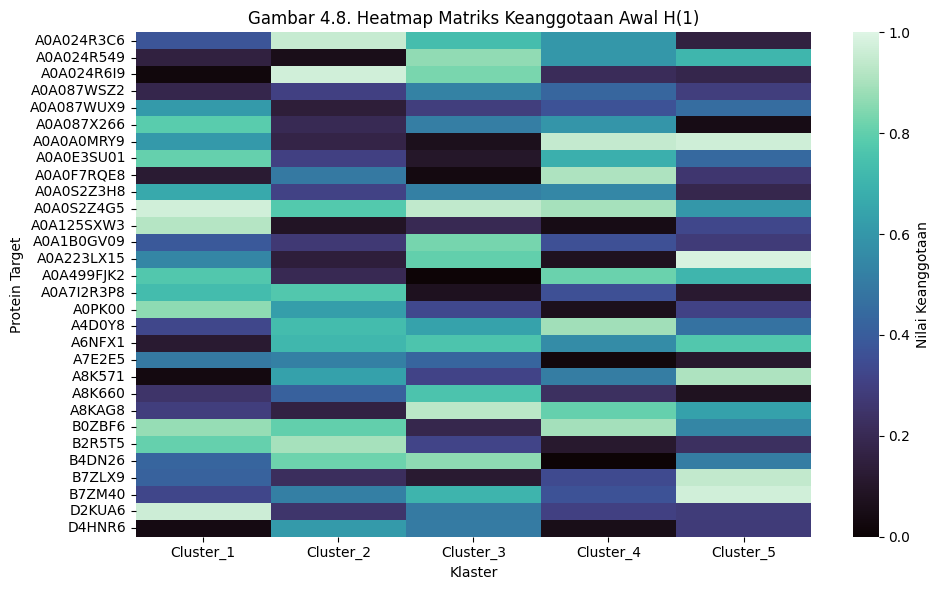

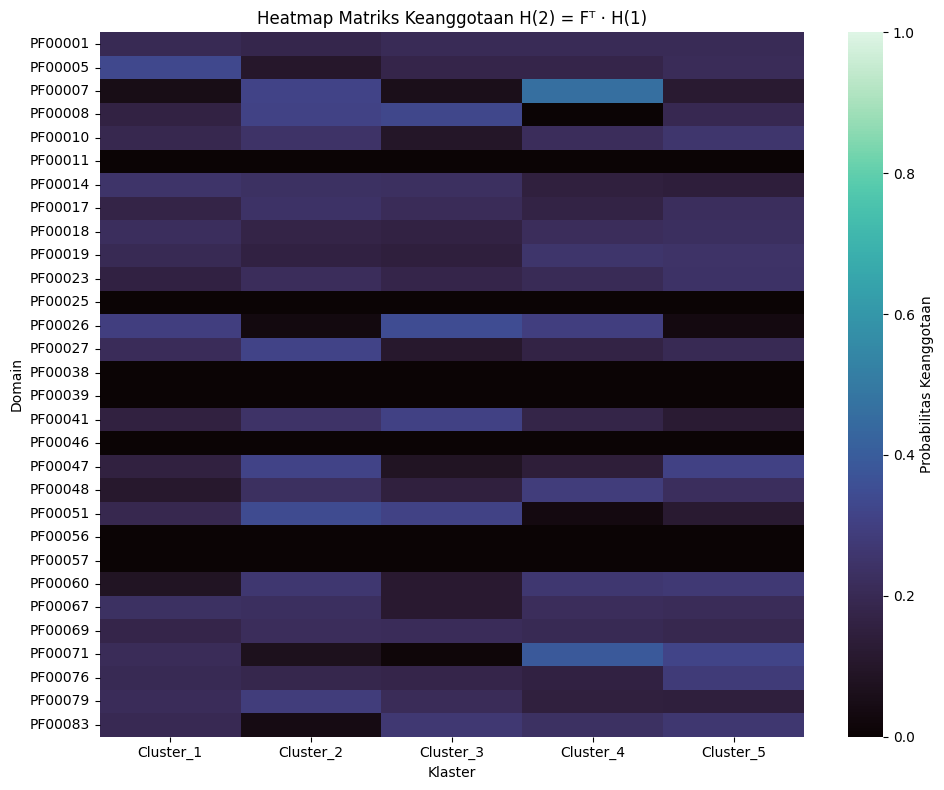

In [62]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === 1. Baca daftar protein dari file PPI ===
ppi_df = pd.read_excel(
    "D:/semhas/Data/PPI_filtered_targets_full.xlsx",
    sheet_name="PPI_with_UniProt"
)[['node1_UniProt', 'node2_UniProt']].dropna()

# Ambil daftar protein unik
proteins = sorted(set(ppi_df['node1_UniProt']).union(ppi_df['node2_UniProt']))

# === 2. Tentukan jumlah cluster (misalnya 5 untuk MNC) ===
k_clusters = 5

# === 3. Inisialisasi H(1) dengan nilai acak 0–1 ===
np.random.seed(42)  # biar hasilnya konsisten
H1 = np.random.rand(len(proteins), k_clusters)

# === 4. Buat DataFrame dengan label protein ===
H1_df = pd.DataFrame(H1, index=proteins, columns=[f"Cluster_{i+1}" for i in range(k_clusters)])

# === 5. Visualisasi Heatmap H1 ===
plt.figure(figsize=(10, 6))
sns.heatmap(
    H1_df.head(30), 
    cmap="mako",
    vmin=0.0, vmax=1.0,
    cbar_kws={'label': 'Nilai Keanggotaan'}
)
plt.title("Gambar 4.8. Heatmap Matriks Keanggotaan Awal H(1)", fontsize=12)
plt.xlabel("Klaster")
plt.ylabel("Protein Target")
plt.tight_layout()
plt.show()

# === 6. Baca matriks Protein-Domain F ===
F = pd.read_excel(
    "D:/semhas/Data/PDA_results.xlsx",
    sheet_name="Protein_Domain_Matrix",
    index_col=0
)

# Bersihkan index/columns
F.index = F.index.map(str).str.strip()
F.columns = F.columns.map(str).str.strip()

# Konversi ke numerik
F = F.apply(pd.to_numeric, errors='coerce').fillna(0)

# Filter protein di F agar sesuai dengan H1
F_matched = F.loc[H1_df.index]

# === 7. Hitung H2 = Fᵀ · H1 ===
H2_mat = np.dot(F_matched.values.T, H1_df.values)  # domain x cluster

# Buat DataFrame untuk H2
H2_df = pd.DataFrame(H2_mat, index=F_matched.columns, columns=H1_df.columns)

# Normalisasi per baris H2 (opsional)
H2_normalized = H2_df.div(H2_df.sum(axis=1), axis=0).fillna(0)

# === 8. Visualisasi Heatmap H2 ===
plt.figure(figsize=(10, 8))
sns.heatmap(
    H2_normalized.head(30),  # tampilkan 30 domain pertama
    cmap="mako",
    vmin=0.0, vmax=1.0,
    cbar_kws={'label': 'Probabilitas Keanggotaan'}
)
plt.title("Heatmap Matriks Keanggotaan H(2) = Fᵀ · H(1)", fontsize=12)
plt.xlabel("Klaster")
plt.ylabel("Domain")
plt.tight_layout()
plt.show()


In [61]:
import numpy as np
import pandas as pd

# === 1. Seed dan data H(1) ===
np.random.seed(42)

# Baca PPI untuk daftar protein
ppi_df = pd.read_excel(
    "D:/semhas/Data/PPI_filtered_targets_full.xlsx",
    sheet_name="PPI_with_UniProt"
)[['node1_UniProt', 'node2_UniProt']].dropna()

proteins = sorted(set(ppi_df['node1_UniProt']).union(ppi_df['node2_UniProt']))
k_clusters = 5
H1 = np.random.rand(len(proteins), k_clusters)

# DataFrame dengan label protein
H1_df = pd.DataFrame(H1, index=proteins, columns=[f"Cluster_{i+1}" for i in range(k_clusters)])

# Normalisasi baris
H1_normalized = H1_df.div(H1_df.sum(axis=1), axis=0)

# Tampilkan 5 protein pertama
print("H(1) - 5 protein pertama:")
print(H1_normalized.head(5))

# === 2. Baca matriks Protein-Domain F ===
F = pd.read_excel(
    "D:/semhas/Data/PDA_results.xlsx",
    sheet_name="Protein_Domain_Matrix",
    index_col=0
)

# Bersihkan index/columns
F.index = F.index.map(str).str.strip()
F.columns = F.columns.map(str).str.strip()

# Konversi ke numerik
F = F.apply(pd.to_numeric, errors='coerce').fillna(0)

# Filter protein di F agar sesuai dengan H1
F_matched = F.loc[H1_normalized.index]

# === 3. Hitung H2 = F @ H1 ===
H2_mat = np.dot(F_matched.values.T, H1_normalized.values)  # ukuran: domain x cluster

# Buat DataFrame untuk H2
H2_df = pd.DataFrame(H2_mat, index=F_matched.columns, columns=H1_normalized.columns)

# Normalisasi baris H2 agar total per domain = 1
H2_normalized = H2_df.div(H2_df.sum(axis=1), axis=0)

# Tampilkan 5 domain pertama
print("\nH(2) - 5 domain pertama:")
print(H2_normalized.head(5))


H(1) - 5 protein pertama:
            Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5
A0A024R3C6   0.133197   0.338101   0.260318   0.212900   0.055485
A0A024R549   0.065285   0.024308   0.362501   0.251571   0.296334
A0A024R6I9   0.009284   0.437468   0.375464   0.095773   0.082010
A0A087WSZ2   0.105673   0.175297   0.302353   0.248877   0.167800
A0A087WUX9   0.327909   0.074759   0.156568   0.196343   0.244421

H(2) - 5 domain pertama:
         Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5
PF00001   0.204904   0.182758   0.203141   0.206363   0.202833
PF00005   0.331310   0.104663   0.177805   0.176655   0.209568
PF00007   0.049277   0.312096   0.058719   0.460651   0.119257
PF00008   0.162797   0.311797   0.328078   0.002650   0.194678
PF00010   0.190573   0.238452   0.091068   0.223152   0.256755


In [43]:
# Implementasi pembaruan H dan lambda_k sesuai permintaan
import numpy as np
import pandas as pd

# -----------------------
# Fungsi util
# -----------------------
def safe_exp_minus(X):
    # mengembalikan exp(-X) stabil
    return np.exp(-np.clip(X, a_min=None, a_max=700))

def bernoulli_loglik_from_p_and_A(A, P):
    # A dan P sama ukuran, P dalam (0,1)
    eps = 1e-12
    P = np.clip(P, eps, 1 - eps)
    # sum over i<j if symmetric adjacency; to be general sum over all entries
    # jika A simetris (undirected), sebaiknya /2 agar tidak menggandakan.
    # di sini kita asumsikan A simetris: hitung sum_{i<j}
    if (A.shape[0] == A.shape[1]) and np.allclose(A, A.T, atol=1e-8):
        # ambil i<j
        iu = np.triu_indices(A.shape[0], k=1)
        return np.sum(A[iu] * np.log(P[iu]) + (1 - A[iu]) * np.log(1 - P[iu]))
    else:
        return np.sum(A * np.log(P) + (1 - A) * np.log(1 - P))

# -----------------------
# Input: muat/miliki A1, A2, F
# -----------------------
# Contoh: muat dari file jika tersedia, atau gunakan dummy untuk test
# A1 = pd.read_excel("D:/semhas/Data/A1_PPI.xlsx", index_col=0).to_numpy()
# A2 = pd.read_excel("D:/semhas/Data/A2_DDI.xlsx", index_col=0).to_numpy()
# F  = pd.read_excel("D:/semhas/Data/F_PDA.xlsx",  index_col=0).to_numpy()

# --- untuk demonstrasi, jika belum ada file, buat dummy kecil ---
# (ganti bagian ini dengan pembacaan file nyata)
np.random.seed(0)
N1 = 100    # ganti dengan 411 pada data nyata
N2 = 60     # ganti dengan jumlah domain (mis. 186)
K  = 5      # jumlah klaster yang diharapkan

# Dummy symmetric adjacency (bernilai 0/1)
A1 = (np.random.rand(N1, N1) + np.random.rand(N1, N1) > 1.8).astype(float)
A1 = np.triu(A1, 1)
A1 = A1 + A1.T

A2 = (np.random.rand(N2, N2) + np.random.rand(N2, N2) > 1.9).astype(float)
A2 = np.triu(A2, 1)
A2 = A2 + A2.T

# Dummy F (N2 x N1)
F = (np.random.rand(N2, N1) > 0.97).astype(float)  # sparse mapping

# -----------------------
# Hyperparameter prior untuk lambda (Gamma prior)
# -----------------------
a = 1.0
b = 1.0

# -----------------------
# Inisialisasi H (N1 x K) dan lambda_k (K,)
# -----------------------
H = np.random.rand(N1, K)
H = H / (H.sum(axis=1, keepdims=True) + 1e-12)

# -----------------------
# Iterasi pembaruan
# -----------------------
max_iter = 500
tol = 1e-6
prev_loss = np.inf
eps = 1e-12

for it in range(max_iter):
    # Precompute HH^T dan fungsi terkait
    HHt = H @ H.T                      # (N1 x N1)
    P1 = 1.0 - safe_exp_minus(HHt)     # p^{(1)}_{ij}
    P1 = np.clip(P1, eps, 1 - eps)
    M1 = A1 / np.clip(1.0 - np.exp(-HHt), eps, None)   # A1 / (1-exp(-HHt)) safe

    # For A2 term compute temp = F H H^T F^T
    FH = F @ H                         # (N2 x K)
    temp2 = FH @ FH.T                  # (N2 x N2) equals F H H^T F^T
    P2 = 1.0 - safe_exp_minus(temp2)
    P2 = np.clip(P2, eps, 1 - eps)
    M2 = A2 / np.clip(1.0 - np.exp(-temp2), eps, None)  # A2 / (1-exp(-temp2))

    # Update lambda_k (vector length K) per formula
    lambda_k = (2.0 * b + np.sum(H**2, axis=0)) / (N1 + 2.0 * a + 2.0)
    # ensure positive
    lambda_k = np.clip(lambda_k, 1e-12, None)

    # Precompute some reusable quantities per cluster k
    H_new = np.zeros_like(H)

    # Precompute A1/den1 matrix for numerator PPI: M1 = A1 / (1-exp(-HHt))
    # We'll use M1 @ H[:,k] for numerator1
    # For DDI part: for each k compute v_k = F @ H[:,k], then B = M2 @ v_k, then F.T @ B
    # Denominator: denom = sum_j H_jk  + F.T @ (A2 @ v_k)  + (1/(2*lambda_k))*H_ik

    AtA2 = A2  # we reuse A2 (symmetric)
    for k in range(K):
        h_k = H[:, k]                          # (N1,)
        numerator1 = M1 @ h_k                  # (N1,)
        v_k = F @ h_k                          # (N2,)
        B = M2 @ v_k                           # (N2,)
        numerator2 = F.T @ B                   # (N1,)

        numerator = numerator1 + numerator2    # (N1,)

        # Denominator components:
        denom_const = np.sum(h_k)              # scalar sum_j H_jk
        denom2_vec = F.T @ (AtA2 @ v_k)       # (N1,)
        denom_reg = (1.0 / (2.0 * lambda_k[k])) * h_k  # (N1,)

        denom = denom_const + denom2_vec + denom_reg
        # avoid zeros
        denom = np.clip(denom, eps, None)

        # update H_ik using given formula:
        # H_ik_new = H_ik/2 + H_ik/2 * (numerator / denom)
        ratio = numerator / denom
        H_new[:, k] = h_k * (0.5 + 0.5 * ratio)

    # Normalize rows of H_new
    H_new = H_new / (H_new.sum(axis=1, keepdims=True) + 1e-12)
    H = H_new

    # --- Hitung fungsi objektif (neg-log posterior) ---
    # loglik A1:
    loglik1 = bernoulli_loglik_from_p_and_A(A1, P1)
    # loglik A2:
    loglik2 = bernoulli_loglik_from_p_and_A(A2, P2)
    # prior on H: 0.5 * sum_i,k lambda_k * H_ik^2
    prior_H = 0.5 * np.sum((H**2) * lambda_k[np.newaxis, :])
    # prior on lambda: -log P(lambda) ; Gamma(a,b) -> -[(a-1)logλ - b λ] (drop const)
    prior_lambda = -((a - 1.0) * np.sum(np.log(lambda_k + eps)) - b * np.sum(lambda_k))

    loss = - (loglik1 + loglik2) + prior_H + prior_lambda

    if it % 10 == 0 or it == max_iter - 1:
        print(f"Iter {it:03d} | loss={loss:.6f} | minH={H.min():.4e} maxH={H.max():.4e}")

    # konvergensi
    if np.abs(prev_loss - loss) < tol:
        print(f"Konvergen pada iterasi ke-{it}")
        break
    prev_loss = loss

# Simpan hasil H* dan lambda_k
H_star = H.copy()
np.save("D:/semhas/Data/H_star.npy", H_star)
pd.DataFrame(H_star, columns=[f"Cluster_{i+1}" for i in range(K)]).to_excel("D:/semhas/Data/H_star.xlsx", index=False)
pd.DataFrame(lambda_k, index=[f"Cluster_{i+1}" for i in range(K)], columns=["lambda"]).to_excel("D:/semhas/Data/lambda_k.xlsx")

print("Selesai. H* disimpan ke D:/semhas/Data/H_star.npy dan H_star.xlsx")


Iter 000 | loss=4512.342606 | minH=3.4363e-03 maxH=5.0385e-01
Iter 010 | loss=4499.740841 | minH=2.3737e-03 maxH=6.6304e-01
Iter 020 | loss=4535.829778 | minH=6.3283e-04 maxH=8.9841e-01
Iter 030 | loss=4642.812081 | minH=9.1267e-05 maxH=9.8281e-01
Iter 040 | loss=4738.872664 | minH=1.0507e-05 maxH=9.9762e-01
Iter 050 | loss=4760.777590 | minH=1.0684e-06 maxH=9.9975e-01
Iter 060 | loss=4731.099198 | minH=9.8820e-08 maxH=9.9997e-01
Iter 070 | loss=4700.770770 | minH=8.4933e-09 maxH=9.9999e-01
Iter 080 | loss=4687.330524 | minH=6.8387e-10 maxH=1.0000e+00
Iter 090 | loss=4670.386601 | minH=4.5976e-11 maxH=1.0000e+00
Iter 100 | loss=4634.835241 | minH=1.8079e-12 maxH=1.0000e+00
Iter 110 | loss=4610.550016 | minH=7.8501e-14 maxH=1.0000e+00
Iter 120 | loss=4597.559198 | minH=3.8116e-15 maxH=1.0000e+00
Iter 130 | loss=4589.087171 | minH=1.9714e-16 maxH=1.0000e+00
Iter 140 | loss=4582.227694 | minH=1.0317e-17 maxH=1.0000e+00
Iter 150 | loss=4578.291206 | minH=5.3089e-19 maxH=1.0000e+00
Iter 160

In [ ]:
#iterasi dn pembaharuan

In [21]:
import pandas as pd
import numpy as np

# === 1. Baca data PPI dan PDA ===
ppi_adj_df = pd.read_excel("D:/semhas/Data/PPI_Adjacency.xlsx", index_col=0)
pda_df = pd.read_excel("D:/semhas/Data/PDA_results.xlsx")

# === 2. Ambil daftar protein & domain unik dari PDA ===
proteins_pda = pd.unique(pda_df[['Protein_1', 'Protein_2']].values.ravel('K'))
domains_pda = pd.unique(pda_df[['Domain_1', 'Domain_2']].values.ravel('K'))

# Buang nilai NaN
proteins_pda = [p for p in proteins_pda if pd.notna(p)]
domains_pda = [d for d in domains_pda if pd.notna(d)]

# === 3. Inisialisasi F (domain × protein) ===
F_df = pd.DataFrame(0, index=domains_pda, columns=proteins_pda, dtype=int)

# === 4. Isi 1 jika domain–protein terhubung ===
for _, row in pda_df.iterrows():
    if pd.notna(row['Protein_1']) and pd.notna(row['Domain_1']):
        F_df.at[row['Domain_1'], row['Protein_1']] = 1
    if pd.notna(row['Protein_2']) and pd.notna(row['Domain_2']):
        F_df.at[row['Domain_2'], row['Protein_2']] = 1

print(f"Ukuran awal F: {F_df.shape[0]} domain × {F_df.shape[1]} protein (dari PDA)")

# === 5. Sinkronisasi dengan protein di PPI ===
proteins_ppi = ppi_adj_df.columns.tolist()
# Reindex kolom sesuai urutan protein PPI; isi 0 jika protein tidak punya domain
F_df = F_df.reindex(columns=proteins_ppi, fill_value=0)

# === 6. Cek statistik keterhubungan ===
domain_counts = (F_df.sum(axis=0) > 0)  # True jika protein punya minimal 1 domain
n_connected = domain_counts.sum()
n_total = len(domain_counts)

print(f"Jumlah protein total di PPI: {n_total}")
print(f"Jumlah protein terhubung ke domain (PDA): {n_connected}")
print(f"Persentase protein dengan domain: {100 * n_connected / n_total:.2f}%")

# === 7. Simpan hasil sinkronisasi ===
F_df.to_excel("D:/semhas/Data/F_Protein_Domain_Sinkron.xlsx")
print("✅ Matriks F tersinkronisasi disimpan ke D:/semhas/Data/F_Protein_Domain_Sinkron.xlsx")

# === 8. Siap untuk algoritma Ouyang ===
F = F_df.values  # domain × protein
A1 = ppi_adj_df.values


Ukuran awal F: 186 domain × 281 protein (dari PDA)
Jumlah protein total di PPI: 411
Jumlah protein terhubung ke domain (PDA): 281
Persentase protein dengan domain: 68.37%
✅ Matriks F tersinkronisasi disimpan ke D:/semhas/Data/F_Protein_Domain_Sinkron.xlsx


In [22]:
# Threshold keanggotaan
threshold = 0.3
H_star_check = (H1_df > threshold).astype(int)

# Berapa banyak protein yang masuk ke setidaknya 1 klaster
print("Jumlah protein dengan H_ik > threshold:", (H_star_check.sum(axis=1) > 0).sum())
print("Jumlah total elemen > threshold:", H_star_check.sum().sum())


print("=== H* (berdasarkan H_ik > 0.3) ===")
print(H_star_threshold.head())

# Simpan ke Excel
H_star_threshold.to_excel("D:/semhas/Data/H_star_threshold.xlsx")
print("H* dengan threshold 0.3 disimpan ke D:/semhas/Data/H_star_threshold.xlsx")


Jumlah protein dengan H_ik > threshold: 408
Jumlah total elemen > threshold: 1419
=== H* (berdasarkan H_ik > 0.3) ===


NameError: name 'H_star_threshold' is not defined

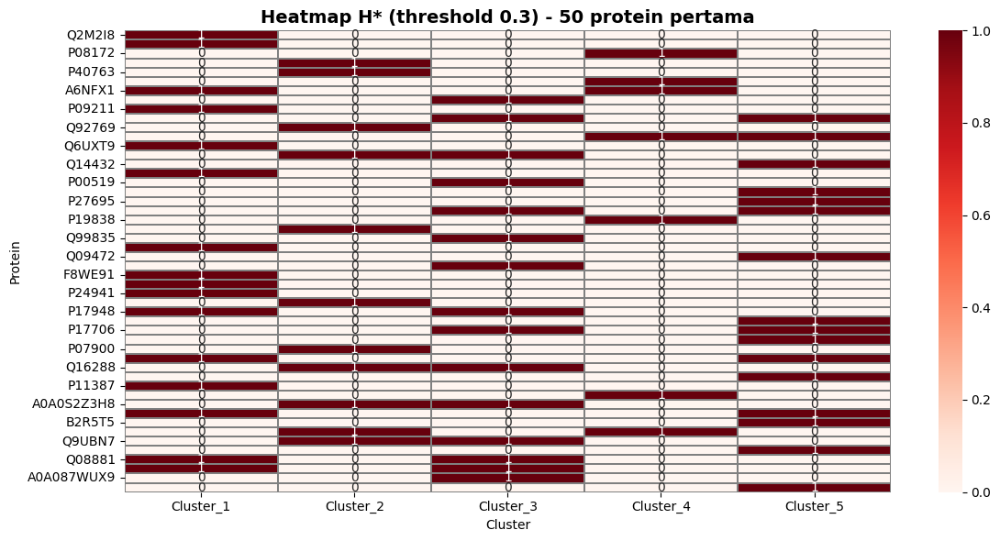

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pilih subset protein agar heatmap terlihat
subset_proteins = 50  # misal 50 protein pertama
H_star_subset = H_star_threshold.iloc[:subset_proteins]

plt.figure(figsize=(12,6))
sns.heatmap(
    H_star_subset,
    cmap="Reds",
    cbar=True,
    linewidths=0.3,
    linecolor='gray',
    annot=True,   # tampilkan 1/0
    fmt='d'
)
plt.title(f"Heatmap H* (threshold 0.3) - {subset_proteins} protein pertama", fontsize=14, fontweight='bold')
plt.ylabel("Protein")
plt.xlabel("Cluster")
plt.tight_layout()
plt.show()


In [103]:

import numpy as np
import pandas as pd
from scipy.sparse import lil_matrix

# --- 1. Baca data jaringan ---
ppi_df = pd.read_excel("D:/semhas/Data/PPI_filtered_targets_full.xlsx",
                       sheet_name="PPI_with_UniProt")[['node1_UniProt', 'node2_UniProt']].dropna()
ddi_df = pd.read_excel("D:/semhas/Data/DDI_relevan.xlsx",
                       sheet_name=0)[['Domain_1', 'Domain_2']].dropna()
pda_df = pd.read_excel("D:/semhas/Data/PDA_results.xlsx",
                       sheet_name=0)[['Protein_1','Protein_2','Domain_1','Domain_2']].dropna()

# --- 2. Buat daftar unik protein dan domain ---
proteins = sorted(set(ppi_df['node1_UniProt']).union(ppi_df['node2_UniProt']))
domains = sorted(set(ddi_df['Domain_1']).union(ddi_df['Domain_2']))
N1, N2 = len(proteins), len(domains)
protein_idx = {p:i for i,p in enumerate(proteins)}
domain_idx = {d:i for i,d in enumerate(domains)}

print(f"Jumlah protein unik: {N1}")
print(f"Jumlah domain unik: {N2}")


Jumlah protein unik: 411
Jumlah domain unik: 396


In [42]:
# --- 3. Buat matriks adjacency gabungan ---
Adj = lil_matrix((N1+N2, N1+N2))

In [110]:
# --- Tampilkan matriks adjacency PPI (A1) ---
print("Matriks adjacency PPI (A1) - 10 baris pertama:")
print(pd.DataFrame(A1, index=proteins, columns=proteins).iloc[:10, :10])

# --- Tampilkan matriks adjacency DDI (A2) ---
print("\nMatriks adjacency DDI (A2) - 10 baris pertama:")
print(pd.DataFrame(A2, index=domains, columns=domains).iloc[:10, :10])

# --- Tampilkan matriks asosiasi Protein-Domain (F) ---
print("\nMatriks asosiasi Protein-Domain (F) - 10 domain x 10 protein pertama:")
print(pd.DataFrame(F, index=domains, columns=proteins).iloc[:10, :10])

# --- Opsional: simpan ke Excel untuk analisis lebih lanjut ---
with pd.ExcelWriter("D:/semhas/Data/MNC_Adjacency.xlsx") as writer:
    pd.DataFrame(A1, index=proteins, columns=proteins).to_excel(writer, sheet_name="PPI_A1")
    pd.DataFrame(A2, index=domains, columns=domains).to_excel(writer, sheet_name="DDI_A2")
    pd.DataFrame(F, index=domains, columns=proteins).to_excel(writer, sheet_name="PDA_F")

print("\nMatriks adjacency telah disimpan ke 'D:/semhas/Data/MNC_Adjacency.xlsx'")


Matriks adjacency PPI (A1) - 10 baris pertama:
            A0A024R3C6  A0A024R549  A0A024R6I9  A0A087WSZ2  A0A087WUX9  \
A0A024R3C6         0.0         0.0         0.0         0.0         1.0   
A0A024R549         0.0         0.0         0.0         0.0         0.0   
A0A024R6I9         0.0         0.0         0.0         0.0         0.0   
A0A087WSZ2         0.0         0.0         0.0         0.0         0.0   
A0A087WUX9         1.0         0.0         0.0         0.0         0.0   
A0A087X266         0.0         0.0         0.0         0.0         0.0   
A0A0A0MRY9         0.0         1.0         0.0         0.0         0.0   
A0A0E3SU01         0.0         0.0         0.0         0.0         1.0   
A0A0F7RQE8         0.0         0.0         0.0         0.0         0.0   
A0A0S2Z3H8         0.0         0.0         0.0         0.0         0.0   

            A0A087X266  A0A0A0MRY9  A0A0E3SU01  A0A0F7RQE8  A0A0S2Z3H8  
A0A024R3C6         0.0         0.0         0.0         0.0       

In [90]:
pip install seaborn



[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


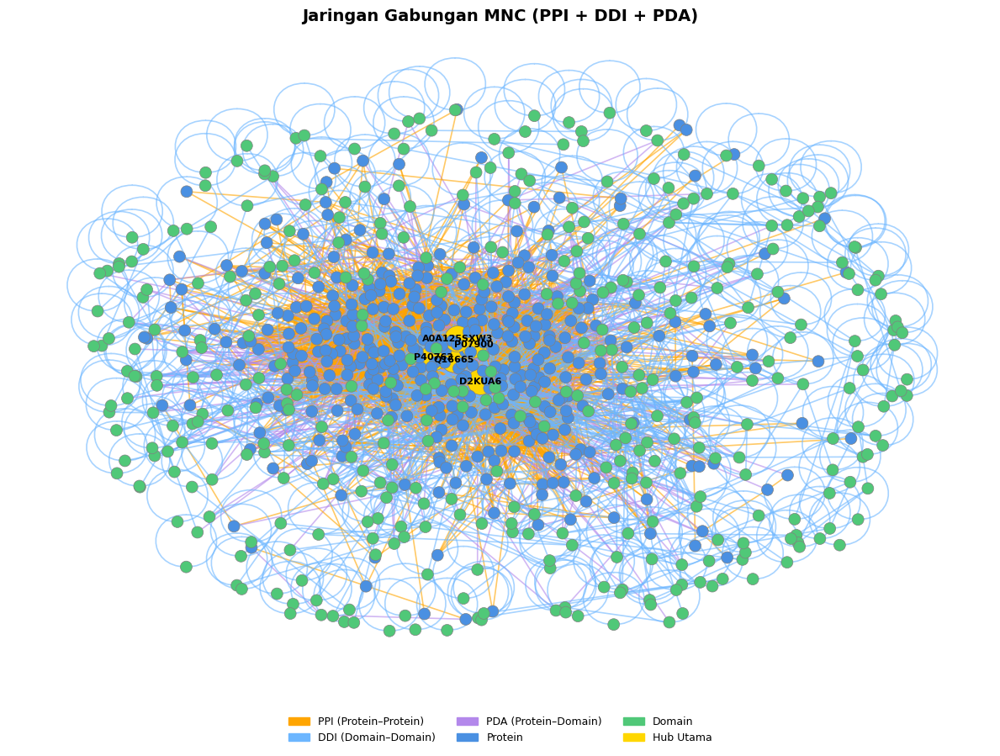

In [20]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# === 1. Baca semua data ===
ppi_df = pd.read_excel("D:/semhas/Data/PPI_filtered_targets_full.xlsx")[['node1_UniProt','node2_UniProt']].dropna()
ddi_df = pd.read_excel("D:/semhas/Data/DDI_relevan.xlsx")[['Domain_1','Domain_2']].dropna()
pda_df = pd.read_excel("D:/semhas/Data/PDA_results.xlsx")[['Protein_1','Protein_2','Domain_1','Domain_2']].dropna()

# === 2. Buat jaringan masing-masing ===
G_ppi = nx.from_pandas_edgelist(ppi_df, 'node1_UniProt', 'node2_UniProt', create_using=nx.Graph())
G_ddi = nx.from_pandas_edgelist(ddi_df, 'Domain_1', 'Domain_2', create_using=nx.Graph())

# PDA: koneksi protein–domain
edges_pda = []
for _, row in pda_df.iterrows():
    edges_pda.append((row['Protein_1'], row['Domain_1']))
    edges_pda.append((row['Protein_2'], row['Domain_2']))
G_pda = nx.Graph()
G_pda.add_edges_from(edges_pda)

# === 3. Gabungkan semua jaringan ===
G_mnc = nx.compose_all([G_ppi, G_ddi, G_pda])

# === 4. Identifikasi jenis node ===
protein_nodes = set(ppi_df['node1_UniProt']).union(ppi_df['node2_UniProt']).union(pda_df['Protein_1']).union(pda_df['Protein_2'])
domain_nodes = set(ddi_df['Domain_1']).union(ddi_df['Domain_2']).union(pda_df['Domain_1']).union(pda_df['Domain_2'])

# === 5. Simpan hub utama semua jaringan ===
hub_ppi = sorted(G_ppi.degree, key=lambda x: x[1], reverse=True)[:10]
hub_ddi = sorted(G_ddi.degree, key=lambda x: x[1], reverse=True)[:10]
hub_pda = sorted(G_pda.degree, key=lambda x: x[1], reverse=True)[:10]

all_hubs = pd.DataFrame({
    'PPI_Hub': [n for n, _ in hub_ppi],
    'DDI_Hub': [n for n, _ in hub_ddi],
    'PDA_Hub': [n for n, _ in hub_pda]
})
all_hubs.to_excel("D:/semhas/Data/Hubs_All_Jaringan.xlsx", index=False)

# === 6. Ambil 5 hub tertinggi untuk ditampilkan di visualisasi ===
hub_top5 = [n for n, d in sorted(G_mnc.degree, key=lambda x: x[1], reverse=True)[:5]]

# === 7. Tentukan warna node ===
node_colors = []
for n in G_mnc.nodes():
    if n in hub_top5:
        node_colors.append("gold")  # hub utama
    elif n in protein_nodes:
        node_colors.append("#4A90E2")  # biru untuk protein
    elif n in domain_nodes:
        node_colors.append("#50C878")  # hijau untuk domain
    else:
        node_colors.append("lightgray")

# === 8. Tentukan warna edge berdasarkan tipe ===
edge_colors = []
for u, v in G_mnc.edges():
    if (u in protein_nodes and v in protein_nodes):
        edge_colors.append("#FFA500")  # oranye untuk PPI
    elif (u in domain_nodes and v in domain_nodes):
        edge_colors.append("#6CB6FF")  # biru muda untuk DDI
    else:
        edge_colors.append("#B388EB")  # ungu untuk PDA

# === 9. Visualisasi ===
plt.figure(figsize=(12, 9))
pos = nx.spring_layout(G_mnc, k=0.35, iterations=60, seed=42)

nx.draw_networkx_edges(G_mnc, pos, edge_color=edge_colors, width=1.2, alpha=0.6)
nx.draw_networkx_nodes(
    G_mnc, pos,
    node_color=node_colors,
    node_size=[500 if n in hub_top5 else 100 for n in G_mnc.nodes()],
    edgecolors="gray", linewidths=0.5
)

nx.draw_networkx_labels(G_mnc, pos, labels={n: n for n in hub_top5}, font_size=8, font_weight='bold')

# === 10. Tambahkan Legend ===
ppi_patch = mpatches.Patch(color='#FFA500', label='PPI (Protein–Protein)')
ddi_patch = mpatches.Patch(color='#6CB6FF', label='DDI (Domain–Domain)')
pda_patch = mpatches.Patch(color='#B388EB', label='PDA (Protein–Domain)')
prot_patch = mpatches.Patch(color='#4A90E2', label='Protein')
dom_patch = mpatches.Patch(color='#50C878', label='Domain')
hub_patch = mpatches.Patch(color='gold', label='Hub Utama')

plt.legend(handles=[ppi_patch, ddi_patch, pda_patch, prot_patch, dom_patch, hub_patch],
           loc='lower center', bbox_to_anchor=(0.5, -0.1),
           ncol=3, fontsize=9, frameon=False)

plt.title("Jaringan Gabungan MNC (PPI + DDI + PDA)", fontsize=14, fontweight='bold')
plt.axis("off")
plt.tight_layout()
plt.savefig("D:/semhas/Data/Combined_MNC_Network_with_Legend.png", dpi=400, bbox_inches='tight')
plt.show()


In [112]:
import numpy as np
import pandas as pd

# Asumsikan A1, A2, F sudah dibuat sebelumnya
# N1 = jumlah protein, N2 = jumlah domain

# --- 1. Buat matriks gabungan kosong ---
N_total = N1 + N2
Adj_gabungan = np.zeros((N_total, N_total))

# --- 2. Tambahkan PPI (protein ↔ protein) ---
Adj_gabungan[:N1, :N1] = A1

# --- 3. Tambahkan DDI (domain ↔ domain) ---
Adj_gabungan[N1:, N1:] = A2

# --- 4. Tambahkan PDA (protein ↔ domain) ---
Adj_gabungan[:N1, N1:] = F.T   # protein row, domain col
Adj_gabungan[N1:, :N1] = F     # domain row, protein col

print(f"Ukuran matriks gabungan: {Adj_gabungan.shape}")
print(f"Jumlah edge total: {np.sum(Adj_gabungan)}")


Ukuran matriks gabungan: (807, 807)
Jumlah edge total: 10379.0


In [114]:
import pandas as pd
import numpy as np

# Asumsikan Adj_gabungan, proteins, domains sudah ada
N1 = len(proteins)
N2 = len(domains)

# Buat label gabungan
all_nodes = proteins + domains

# Konversi ke DataFrame agar mudah dibaca
Adj_df = pd.DataFrame(Adj_gabungan, index=all_nodes, columns=all_nodes)

# Tampilkan sebagian (misal 10x10 pertama) jika terlalu besar
print("Matriks adjacency gabungan (10x10 pertama):")
print(Adj_df.iloc[:10, :10])

# Jika ingin menampilkan keseluruhan (jika tidak terlalu besar):
# print(Adj_df)


Matriks adjacency gabungan (10x10 pertama):
            A0A024R3C6  A0A024R549  A0A024R6I9  A0A087WSZ2  A0A087WUX9  \
A0A024R3C6         0.0         0.0         0.0         0.0         1.0   
A0A024R549         0.0         0.0         0.0         0.0         0.0   
A0A024R6I9         0.0         0.0         0.0         0.0         0.0   
A0A087WSZ2         0.0         0.0         0.0         0.0         0.0   
A0A087WUX9         1.0         0.0         0.0         0.0         0.0   
A0A087X266         0.0         0.0         0.0         0.0         0.0   
A0A0A0MRY9         0.0         1.0         0.0         0.0         0.0   
A0A0E3SU01         0.0         0.0         0.0         0.0         1.0   
A0A0F7RQE8         0.0         0.0         0.0         0.0         0.0   
A0A0S2Z3H8         0.0         0.0         0.0         0.0         0.0   

            A0A087X266  A0A0A0MRY9  A0A0E3SU01  A0A0F7RQE8  A0A0S2Z3H8  
A0A024R3C6         0.0         0.0         0.0         0.0         0

Ukuran matriks gabungan: (807, 807)
Jumlah edge total: 10379.0


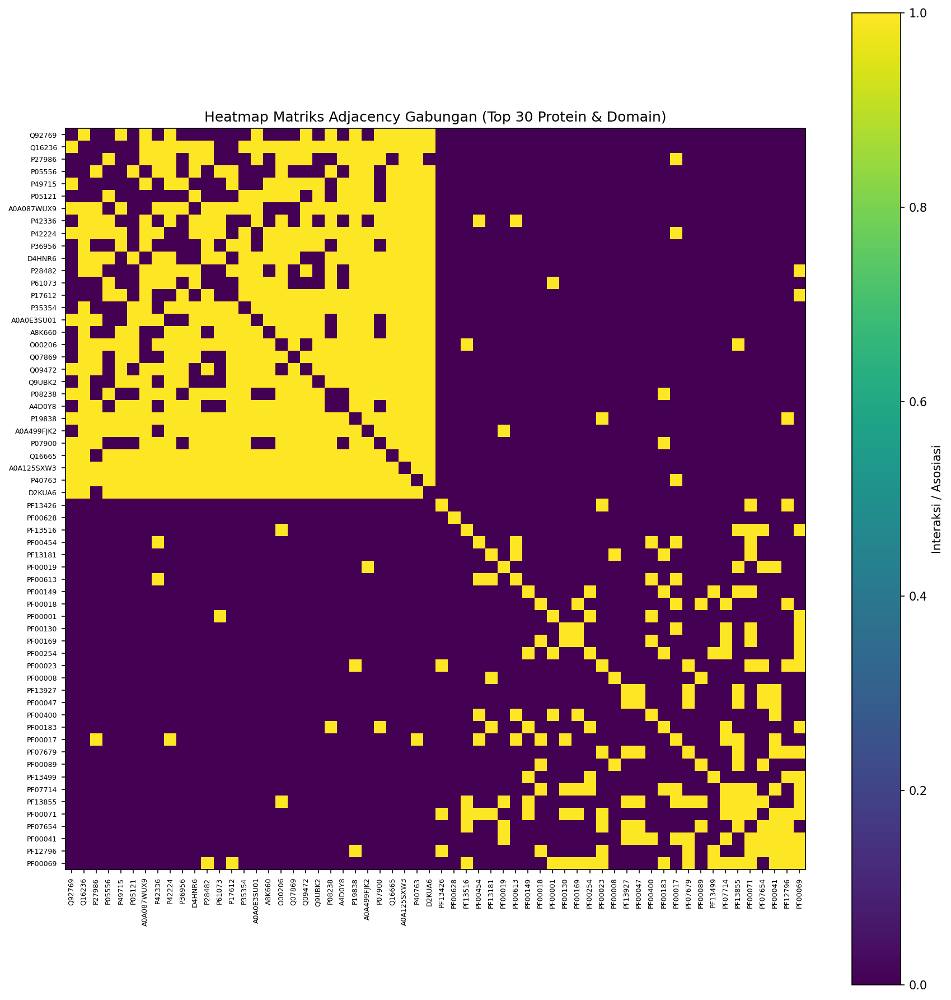

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix

# --- 1. Baca data jaringan ---
ppi_df = pd.read_excel("D:/semhas/Data/PPI_filtered_targets_full.xlsx", 
                       sheet_name="PPI_with_UniProt")[['node1_UniProt', 'node2_UniProt']].dropna()
ddi_df = pd.read_excel("D:/semhas/Data/DDI_relevan.xlsx", sheet_name=0)[['Domain_1', 'Domain_2']].dropna()
pda_df = pd.read_excel("D:/semhas/Data/PDA_results.xlsx")[['Protein_1', 'Protein_2', 'Domain_1', 'Domain_2']].dropna()

# --- 2. Buat daftar unik protein dan domain ---
proteins = sorted(set(ppi_df['node1_UniProt']).union(ppi_df['node2_UniProt']))
domains = sorted(set(ddi_df['Domain_1']).union(ddi_df['Domain_2']))
N1, N2 = len(proteins), len(domains)
protein_idx = {p: i for i, p in enumerate(proteins)}
domain_idx = {d: i for i, d in enumerate(domains)}
N_total = N1 + N2

# --- 3. Buat matriks sparse gabungan ---
Adj_sparse = lil_matrix((N_total, N_total))

# PPI
for _, row in ppi_df.iterrows():
    i, j = protein_idx[row['node1_UniProt']], protein_idx[row['node2_UniProt']]
    Adj_sparse[i, j] = 1
    Adj_sparse[j, i] = 1

# DDI
for _, row in ddi_df.iterrows():
    x, y = domain_idx[row['Domain_1']], domain_idx[row['Domain_2']]
    Adj_sparse[N1+x, N1+y] = 1
    Adj_sparse[N1+y, N1+x] = 1

# PDA
for _, row in pda_df.iterrows():
    if row['Protein_1'] in protein_idx and row['Domain_1'] in domain_idx:
        i, x = protein_idx[row['Protein_1']], domain_idx[row['Domain_1']]
        Adj_sparse[i, N1+x] = 1
        Adj_sparse[N1+x, i] = 1
    if row['Protein_2'] in protein_idx and row['Domain_2'] in domain_idx:
        j, y = protein_idx[row['Protein_2']], domain_idx[row['Domain_2']]
        Adj_sparse[j, N1+y] = 1
        Adj_sparse[N1+y, j] = 1

print(f"Ukuran matriks gabungan: {Adj_sparse.shape}")
print(f"Jumlah edge total: {Adj_sparse.sum()}")

# --- 4. Pilih subset top protein & domain untuk heatmap ---
top_protein_idx = np.argsort(Adj_sparse[:N1,:N1].sum(axis=1).A1)[-30:]  # top 50 protein
top_domain_idx = np.argsort(Adj_sparse[N1:,N1:].sum(axis=1).A1)[-30:]   # top 50 domain
subset_idx = np.concatenate([top_protein_idx, N1 + top_domain_idx])

Adj_subset = Adj_sparse[subset_idx,:][:,subset_idx].toarray()
subset_nodes = [proteins[i] for i in top_protein_idx] + [domains[i] for i in top_domain_idx]

# --- 5. Visualisasi heatmap subset ---
plt.figure(figsize=(12,12), dpi=150)
plt.imshow(Adj_subset, cmap='viridis', interpolation='none')
plt.colorbar(label='Interaksi / Asosiasi')
plt.xticks(ticks=np.arange(len(subset_nodes)), labels=subset_nodes, rotation=90, fontsize=6)
plt.yticks(ticks=np.arange(len(subset_nodes)), labels=subset_nodes, fontsize=6)
plt.title("Heatmap Matriks Adjacency Gabungan (Top 30 Protein & Domain)")
plt.tight_layout()
plt.show()


In [ ]:
#inisialisasi matriks keanggotaan awal H(1)

In [25]:
import pandas as pd
import numpy as np

# Misal N1 = 411, K = 5
K = 5
np.random.seed(0)
H = np.random.rand(N1, K)
H = H / H.sum(axis=1, keepdims=True)  # normalisasi tiap baris

# Tampilkan 5 baris pertama
df_H = pd.DataFrame(H[:5], columns=[f'K{i+1}' for i in range(K)])
print("5 baris pertama H1 (Protein → Klaster):")
print(df_H.to_string(index=False))

# Jika ingin menyimpan seluruh H ke Excel
df_H_all = pd.DataFrame(H, columns=[f'K{i+1}' for i in range(K)])
df_H_all.to_excel("D:/semhas/Data/H1_initial.xlsx", index=False)
print("\nMatriks H1 berhasil disimpan ke 'H1_initial.xlsx'")


5 baris pertama H1 (Protein → Klaster):
      K1       K2       K3       K4       K5
0.193564 0.252244 0.212592 0.192178 0.149421
0.194408 0.131710 0.268416 0.290054 0.115412
0.274400 0.183307 0.196876 0.320798 0.024620
0.033665 0.007812 0.321706 0.300663 0.336154
0.311855 0.254666 0.147059 0.248730 0.037690

Matriks H1 berhasil disimpan ke 'H1_initial.xlsx'


#Iterasi Pembaruan H dan Parameter λ

Iterasi H: 100%|███████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.87it/s]


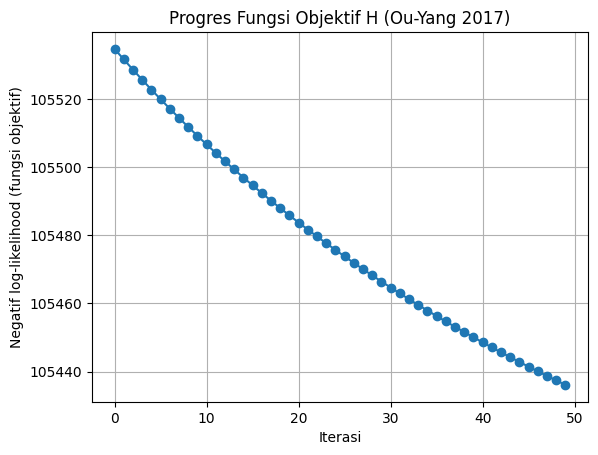

In [132]:
import numpy as np
import pandas as pd
from tqdm import trange

# --- Misal data sudah siap ---
# N1, N2, proteins, domains
# A1 (PPI), A2 (DDI), F (domain-protein), H (inisialisasi)
# parameter regulasi
K = H.shape[1]
a, b = 1.0, 1.0
lambda_k = np.ones(K)

# Fungsi hitung nilai objektif
def compute_objective(H, F, A1, A2, lambda_k):
    HHt = H @ H.T
    FHHF = F @ H @ H.T @ F.T
    
    # Likelihood PPI
    term_ppi = A1 * np.log(1 - np.exp(-HHt) + 1e-12) + (1-A1) * np.log(np.exp(-HHt) + 1e-12)
    logP1 = np.sum(term_ppi)
    
    # Likelihood DDI
    FH = F @ H
    term_ddi = A2 * np.log(1 - np.exp(-FHHF) + 1e-12) + (1-A2) * np.log(np.exp(-FHHF) + 1e-12)
    logP2 = np.sum(term_ddi)
    
    # Regularisasi H
    logP_H = -0.5 * np.sum(H**2 / lambda_k)  # asumsi gaussian per klaster
    
    # Regularisasi lambda
    logP_lambda = - np.sum(lambda_k)  # sederhana
    
    # Fungsi objektif (negatif log-likelihood)
    return -(logP1 + logP2 + logP_H + logP_lambda)

# ----- Iterasi H dengan progress -----
max_iter = 50
tol = 1e-5
objectives = []

for it in trange(max_iter, desc="Iterasi H"):
    H_old = H.copy()
    
    # --- Update H (sama seperti sebelumnya) ---
    HHt = H @ H.T
    tmp_ppi = 1 - np.exp(-HHt) + 1e-8
    contrib_ppi = (A1 @ H) / tmp_ppi.sum(axis=1, keepdims=True)
    
    FH = F @ H
    FHHF = F @ H @ H.T @ F.T
    tmp_ddi = 1 - np.exp(-FHHF) + 1e-8
    contrib_ddi = A2 @ FH / tmp_ddi.sum(axis=1, keepdims=True)
    contrib_ddi_protein = F.T @ contrib_ddi
    
    numerator = contrib_ppi + contrib_ddi_protein
    denominator = H.sum(axis=0) + (F @ H).sum(axis=0) + 1/(2*lambda_k)
    H = 0.5*H + 0.5*(numerator / denominator)
    H = H / (H.sum(axis=1, keepdims=True) + 1e-8)
    
    lambda_k = (2*b + np.sum(H**2, axis=0)) / (N1 + 2*a + 2)
    
    # --- Hitung fungsi objektif ---
    obj_val = compute_objective(H, F, A1, A2, lambda_k)
    objectives.append(obj_val)
    
    # Cek konvergensi
    delta = np.linalg.norm(H - H_old)
    if delta < tol:
        print(f"\nKonvergen setelah {it+1} iterasi")
        break

# ----- Visualisasi progres objektif -----
import matplotlib.pyplot as plt
plt.plot(objectives, marker='o')
plt.xlabel("Iterasi")
plt.ylabel("Negatif log-likelihood (fungsi objektif)")
plt.title("Progres Fungsi Objektif H (Ou-Yang 2017)")
plt.grid(True)
plt.show()


Iterasi H:   8%|█████▊                                                                  | 4/50 [00:00<00:02, 16.32it/s]

Iterasi  1, Fungsi Objektif: 105387.7168


Iterasi H:  16%|███████████▌                                                            | 8/50 [00:00<00:02, 15.23it/s]

Iterasi  5, Fungsi Objektif: 105385.0411


Iterasi H:  24%|█████████████████                                                      | 12/50 [00:00<00:02, 14.98it/s]

Iterasi 10, Fungsi Objektif: 105381.8520


Iterasi H:  36%|█████████████████████████▌                                             | 18/50 [00:01<00:02, 15.50it/s]

Iterasi 15, Fungsi Objektif: 105378.8240


Iterasi H:  44%|███████████████████████████████▏                                       | 22/50 [00:01<00:01, 15.48it/s]

Iterasi 20, Fungsi Objektif: 105375.9459


Iterasi H:  56%|███████████████████████████████████████▊                               | 28/50 [00:01<00:01, 15.63it/s]

Iterasi 25, Fungsi Objektif: 105373.2073


Iterasi H:  64%|█████████████████████████████████████████████▍                         | 32/50 [00:02<00:01, 15.60it/s]

Iterasi 30, Fungsi Objektif: 105370.5990


Iterasi H:  72%|███████████████████████████████████████████████████                    | 36/50 [00:02<00:00, 15.45it/s]

Iterasi 35, Fungsi Objektif: 105368.1125


Iterasi H:  84%|███████████████████████████████████████████████████████████▋           | 42/50 [00:02<00:00, 14.28it/s]

Iterasi 40, Fungsi Objektif: 105365.7400


Iterasi H:  96%|████████████████████████████████████████████████████████████████████▏  | 48/50 [00:03<00:00, 15.38it/s]

Iterasi 45, Fungsi Objektif: 105363.4746


Iterasi H: 100%|███████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.10it/s]


Iterasi 50, Fungsi Objektif: 105361.3098

5 baris pertama H (Protein → Klaster):
   Protein       K1       K2       K3       K4       K5
A0A024R3C6 0.194725 0.235844 0.209015 0.185282 0.175134
A0A024R549 0.192584 0.142400 0.256012 0.284555 0.124449
A0A024R6I9 0.265279 0.187340 0.192342 0.306671 0.048368
A0A087WSZ2 0.038236 0.014026 0.318633 0.296514 0.332591
A0A087WUX9 0.254296 0.235039 0.164508 0.222729 0.123428

5 baris pertama H2 (Domain → Klaster):
 Domain       K1       K2       K3       K4       K5
PF00001 0.216310 0.181359 0.176736 0.196315 0.229280
PF00005 0.193344 0.118350 0.128577 0.107450 0.452278
PF00007 0.212365 0.208027 0.179916 0.129212 0.270480
PF00008 0.265811 0.100413 0.173218 0.279454 0.181104
PF00010 0.098918 0.232097 0.213281 0.120751 0.334953

Matriks H dan H2 iteratif berhasil disimpan ke 'H_matrices_iterative_progress.xlsx'


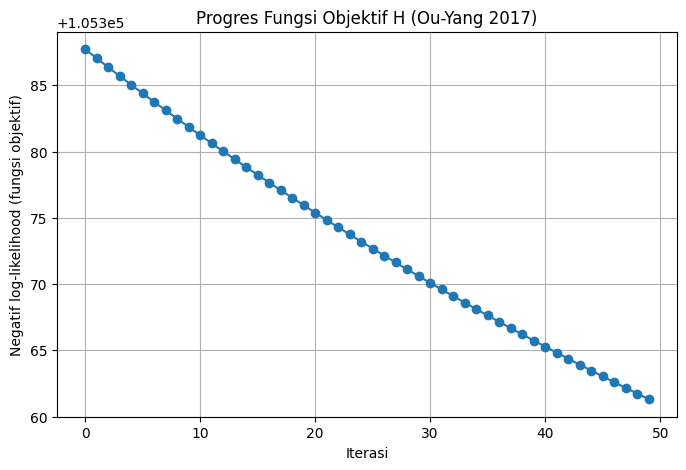

In [135]:
import numpy as np
import pandas as pd
from tqdm import trange
import matplotlib.pyplot as plt

# --- Misal data sudah siap ---
# N1, N2, proteins, domains
# A1 (PPI), A2 (DDI), F (domain-protein), H (inisialisasi)
# parameter regulasi
K = H.shape[1]
a, b = 1.0, 1.0
lambda_k = np.ones(K)

# Fungsi hitung nilai objektif
def compute_objective(H, F, A1, A2, lambda_k):
    HHt = H @ H.T
    FHHF = F @ H @ H.T @ F.T
    
    # Likelihood PPI
    term_ppi = A1 * np.log(1 - np.exp(-HHt) + 1e-12) + (1-A1) * np.log(np.exp(-HHt) + 1e-12)
    logP1 = np.sum(term_ppi)
    
    # Likelihood DDI
    FH = F @ H
    term_ddi = A2 * np.log(1 - np.exp(-FHHF) + 1e-12) + (1-A2) * np.log(np.exp(-FHHF) + 1e-12)
    logP2 = np.sum(term_ddi)
    
    # Regularisasi H
    logP_H = -0.5 * np.sum(H**2 / lambda_k)
    
    # Regularisasi lambda
    logP_lambda = - np.sum(lambda_k)
    
    # Fungsi objektif (negatif log-likelihood)
    return -(logP1 + logP2 + logP_H + logP_lambda)

# ----- Iterasi H dengan progress + cetak nilai fungsi objektif -----
max_iter = 50
tol = 1e-5
objectives = []

for it in trange(max_iter, desc="Iterasi H"):
    H_old = H.copy()
    
    # --- Update H ---
    HHt = H @ H.T
    tmp_ppi = 1 - np.exp(-HHt) + 1e-8
    contrib_ppi = (A1 @ H) / tmp_ppi.sum(axis=1, keepdims=True)
    
    FH = F @ H
    FHHF = F @ H @ H.T @ F.T
    tmp_ddi = 1 - np.exp(-FHHF) + 1e-8
    contrib_ddi = A2 @ FH / tmp_ddi.sum(axis=1, keepdims=True)
    contrib_ddi_protein = F.T @ contrib_ddi
    
    numerator = contrib_ppi + contrib_ddi_protein
    denominator = H.sum(axis=0) + (F @ H).sum(axis=0) + 1/(2*lambda_k)
    H = 0.5*H + 0.5*(numerator / denominator)
    H = H / (H.sum(axis=1, keepdims=True) + 1e-8)
    
    lambda_k = (2*b + np.sum(H**2, axis=0)) / (N1 + 2*a + 2)
    
    # --- Hitung fungsi objektif ---
    obj_val = compute_objective(H, F, A1, A2, lambda_k)
    objectives.append(obj_val)
    
    # Cetak nilai objektif setiap 5 iterasi
    if (it+1) % 5 == 0 or it == 0:
        print(f"Iterasi {it+1:2d}, Fungsi Objektif: {obj_val:.4f}")
    
    # Cek konvergensi
    delta = np.linalg.norm(H - H_old)
    if delta < tol:
        print(f"\nKonvergen setelah {it+1} iterasi")
        break

# ----- Matriks domain H2 -----
H2 = F @ H
H2 = H2 / (H2.sum(axis=1, keepdims=True) + 1e-8)

# ----- Tampilkan 5 baris pertama -----
df_H1 = pd.DataFrame(H[:5], columns=[f'K{i+1}' for i in range(K)])
df_H1.insert(0, 'Protein', proteins[:5])
print("\n5 baris pertama H (Protein → Klaster):")
print(df_H1.to_string(index=False))

df_H2 = pd.DataFrame(H2[:5], columns=[f'K{i+1}' for i in range(K)])
df_H2.insert(0, 'Domain', domains[:5])
print("\n5 baris pertama H2 (Domain → Klaster):")
print(df_H2.to_string(index=False))

# ----- Simpan ke Excel -----
with pd.ExcelWriter("D:/semhas/Data/H_matrices_iterative_progress.xlsx") as writer:
    df_H1_all = pd.DataFrame(H, columns=[f'K{i+1}' for i in range(K)])
    df_H1_all.insert(0, 'Protein', proteins)
    df_H1_all.to_excel(writer, sheet_name="H_Protein", index=False)
    
    df_H2_all = pd.DataFrame(H2, columns=[f'K{i+1}' for i in range(K)])
    df_H2_all.insert(0, 'Domain', domains)
    df_H2_all.to_excel(writer, sheet_name="H_Domain", index=False)

print("\nMatriks H dan H2 iteratif berhasil disimpan ke 'H_matrices_iterative_progress.xlsx'")

# ----- Visualisasi progres fungsi objektif -----
plt.figure(figsize=(8,5))
plt.plot(objectives, marker='o')
plt.xlabel("Iterasi")
plt.ylabel("Negatif log-likelihood (fungsi objektif)")
plt.title("Progres Fungsi Objektif H (Ou-Yang 2017)")
plt.grid(True)
plt.show()


Klaster K1: 39 protein
Klaster K2: 31 protein
Klaster K3: 34 protein
Klaster K4: 49 protein
Klaster K5: 48 protein
H* dan daftar protein per klaster berhasil disimpan ke 'D:/semhas/Data/Protein_per_Klaster.xlsx'


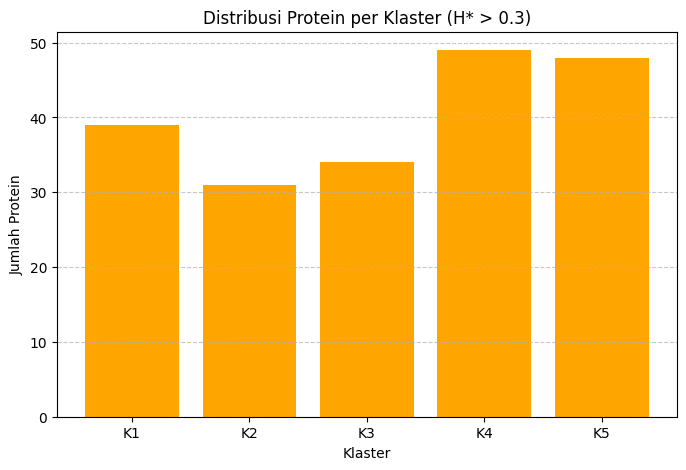

In [145]:
import numpy as np
import pandas as pd

# Misal H, proteins, K sudah tersedia dari proses sebelumnya
threshold = 0.3

# --- 1. Buat H* dengan threshold ---
H_star = (H > threshold).astype(int)

# --- 2. Hitung jumlah protein per klaster ---
protein_counts = H_star.sum(axis=0)
for k in range(K):
    print(f"Klaster K{k+1}: {protein_counts[k]} protein")

# --- 3. Buat DataFrame H* (Protein vs Klaster) ---
df_H_star = pd.DataFrame(H_star, columns=[f'K{i+1}' for i in range(K)])
df_H_star.insert(0, 'Protein', proteins)

# --- 4. Simpan ke Excel dengan sheet berbeda per klaster ---
with pd.ExcelWriter("D:/semhas/Data/Protein_per_Klaster.xlsx") as writer:
    # Sheet utama: semua protein vs semua klaster
    df_H_star.to_excel(writer, sheet_name="H_star_Proteins", index=False)
    
    # Sheet per klaster: hanya protein yang masuk klaster tersebut
    for k in range(K):
        proteins_in_cluster = df_H_star[df_H_star[f'K{k+1}'] == 1][['Protein']]
        proteins_in_cluster.to_excel(writer, sheet_name=f'K{k+1}', index=False)

print("H* dan daftar protein per klaster berhasil disimpan ke 'D:/semhas/Data/Protein_per_Klaster.xlsx'")

# ----- Visualisasi bar plot -----
plt.figure(figsize=(8,5))
plt.bar(cluster_df['Klaster'], cluster_df['Jumlah_Protein'], color='orange')
plt.xlabel("Klaster")
plt.ylabel("Jumlah Protein")
plt.title("Distribusi Protein per Klaster (H* > 0.3)")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [146]:
predicted_proteins_idx = np.where(H_star.sum(axis=1) > 0)[0]
predicted_proteins = [proteins[i] for i in predicted_proteins_idx]

print(f"Jumlah protein yang diprediksi: {len(predicted_proteins)}")
print("5 protein pertama yang diprediksi:", predicted_proteins[:5])


Jumlah protein yang diprediksi: 165
5 protein pertama yang diprediksi: ['A0A024R6I9', 'A0A087WSZ2', 'A0A087X266', 'A0A0A0MRY9', 'A0A0S2Z4G5']


In [147]:
protein_clusters = [f"K{np.argmax(H[i])+1}" for i in range(N1)]
for protein, cluster in zip(proteins, protein_clusters):
    print(f"{protein}: {cluster}")


A0A024R3C6: K2
A0A024R549: K4
A0A024R6I9: K4
A0A087WSZ2: K5
A0A087WUX9: K1
A0A087X266: K3
A0A0A0MRY9: K2
A0A0E3SU01: K4
A0A0F7RQE8: K3
A0A0S2Z3H8: K1
A0A0S2Z4G5: K3
A0A125SXW3: K2
A0A1B0GV09: K3
A0A223LX15: K4
A0A499FJK2: K1
A0A7I2R3P8: K2
A0PK00: K4
A4D0Y8: K5
A6NFX1: K4
A7E2E5: K4
A8K571: K4
A8K660: K5
A8KAG8: K5
B0ZBF6: K2
B2R5T5: K3
B4DN26: K4
B7ZLX9: K1
B7ZM40: K3
D2KUA6: K5
D4HNR6: K5
D6RFM5: K2
E7EMD6: K1
E7EPI8: K5
E9PGQ0: K1
F1D8S3: K5
F5H5A1: K3
F6SL11: K5
F8WE91: K4
J3KNP8: K4
M0QXA0: K1
O00206: K2
O00257: K5
O00444: K1
O00585: K5
O00763: K4
O00767: K1
O14672: K3
O14686: K5
O15054: K1
O15111: K2
O15118: K2
O15151: K4
O15164: K4
O15240: K1
O15379: K1
O43320: K1
O60341: K2
O75385: K2
O75460: K3
O75469: K5
O75762: K1
O94925: K4
O95136: K1
O95140: K4
O95180: K4
O95551: K3
O95665: K5
O95819: K1
P00488: K5
P00519: K5
P00734: K1
P00746: K5
P02545: K5
P02708: K4
P02766: K3
P02775: K3
P04066: K3
P04070: K1
P05106: K4
P05121: K1
P05186: K4
P05556: K4
P06213: K2
P06400: K5
P06493: K2
P

In [150]:
import pandas as pd
from collections import defaultdict

# Tentukan klaster tiap protein
protein_clusters = [f"K{np.argmax(H[i])+1}" for i in range(N1)]

# Buat dictionary untuk menampung protein per klaster
clusters_dict = defaultdict(list)
for protein, cluster in zip(proteins, protein_clusters):
    clusters_dict[cluster].append(protein)

# Tampilkan hasil
for protein, cluster in zip(proteins, protein_clusters):
    print(f"{protein}: {cluster}")

# Simpan ke Excel, satu sheet per klaster
excel_file = "D:/semhas/Data/Protein_per_Klaster.xlsx"
with pd.ExcelWriter(excel_file) as writer:
    for cluster_name, protein_list in clusters_dict.items():
        df = pd.DataFrame(protein_list, columns=['Protein'])
        df.to_excel(writer, sheet_name=cluster_name, index=False)

print(f"Hasil protein per klaster berhasil disimpan di '{excel_file}'")


A0A024R3C6: K2
A0A024R549: K4
A0A024R6I9: K4
A0A087WSZ2: K5
A0A087WUX9: K1
A0A087X266: K3
A0A0A0MRY9: K2
A0A0E3SU01: K4
A0A0F7RQE8: K3
A0A0S2Z3H8: K1
A0A0S2Z4G5: K3
A0A125SXW3: K2
A0A1B0GV09: K3
A0A223LX15: K4
A0A499FJK2: K1
A0A7I2R3P8: K2
A0PK00: K4
A4D0Y8: K5
A6NFX1: K4
A7E2E5: K4
A8K571: K4
A8K660: K5
A8KAG8: K5
B0ZBF6: K2
B2R5T5: K3
B4DN26: K4
B7ZLX9: K1
B7ZM40: K3
D2KUA6: K5
D4HNR6: K5
D6RFM5: K2
E7EMD6: K1
E7EPI8: K5
E9PGQ0: K1
F1D8S3: K5
F5H5A1: K3
F6SL11: K5
F8WE91: K4
J3KNP8: K4
M0QXA0: K1
O00206: K2
O00257: K5
O00444: K1
O00585: K5
O00763: K4
O00767: K1
O14672: K3
O14686: K5
O15054: K1
O15111: K2
O15118: K2
O15151: K4
O15164: K4
O15240: K1
O15379: K1
O43320: K1
O60341: K2
O75385: K2
O75460: K3
O75469: K5
O75762: K1
O94925: K4
O95136: K1
O95140: K4
O95180: K4
O95551: K3
O95665: K5
O95819: K1
P00488: K5
P00519: K5
P00734: K1
P00746: K5
P02545: K5
P02708: K4
P02766: K3
P02775: K3
P04066: K3
P04070: K1
P05106: K4
P05121: K1
P05186: K4
P05556: K4
P06213: K2
P06400: K5
P06493: K2
P

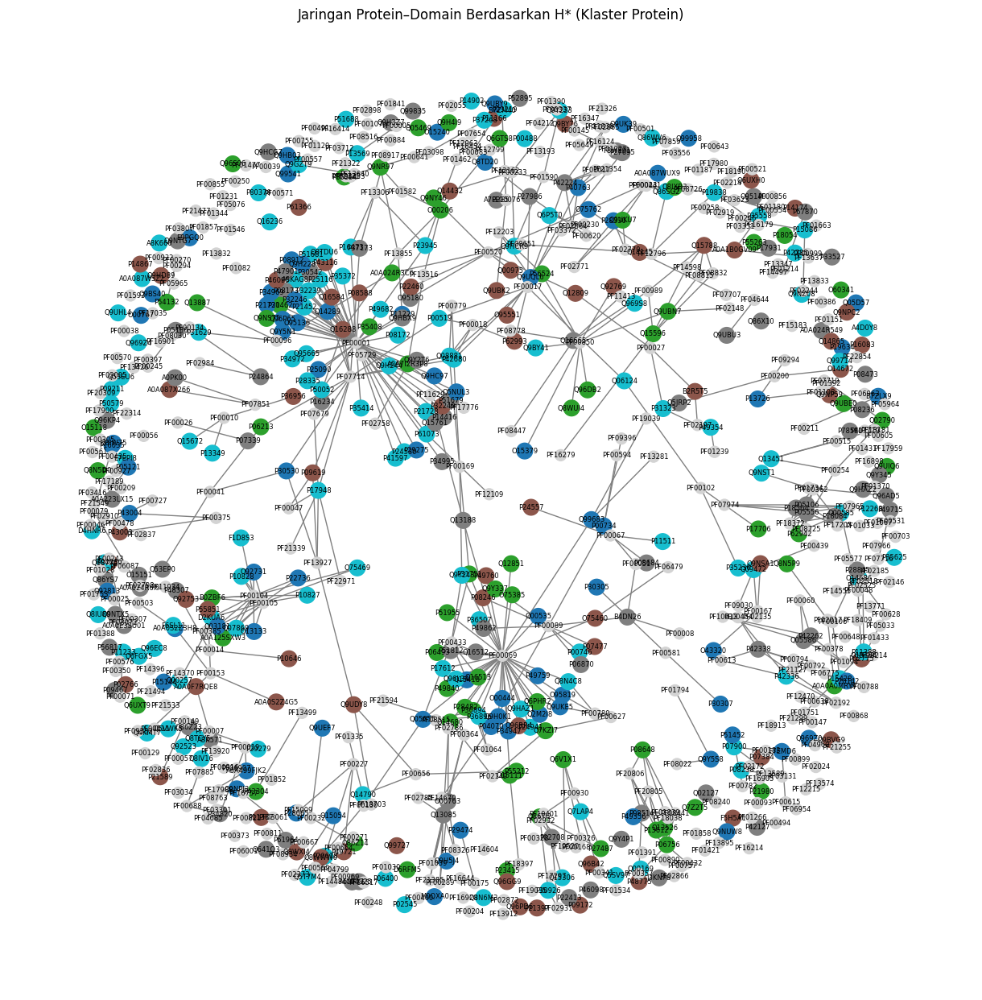

In [151]:
import networkx as nx

# Tentukan klaster dominan per protein
protein_clusters = [f"K{np.argmax(H[i])+1}" for i in range(N1)]

# Warna klaster
cluster_colors = plt.cm.tab10(np.linspace(0,1,K))  # maksimal 10 warna
protein_color_map = {f"K{i+1}": cluster_colors[i] for i in range(K)}

# Buat graph
G = nx.Graph()

# Tambahkan node protein dengan warna klaster
for i, protein in enumerate(proteins):
    G.add_node(protein, type='protein', color=protein_color_map[protein_clusters[i]])

# Tambahkan node domain (warna netral)
for domain in domains:
    G.add_node(domain, type='domain', color='lightgray')

# Tambahkan edge dari matriks F (protein-domain)
for x in range(N2):
    for i in range(N1):
        if F[x,i] > 0:
            G.add_edge(proteins[i], domains[x])

# Visualisasi jaringan
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k=0.15, seed=42)  # tata letak spring

node_colors = [G.nodes[n]['color'] for n in G.nodes]
node_sizes = [100 if G.nodes[n]['type']=='domain' else 200 for n in G.nodes]

nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=node_sizes, font_size=6, edge_color='gray')
plt.title("Jaringan Protein–Domain Berdasarkan H* (Klaster Protein)")
plt.show()


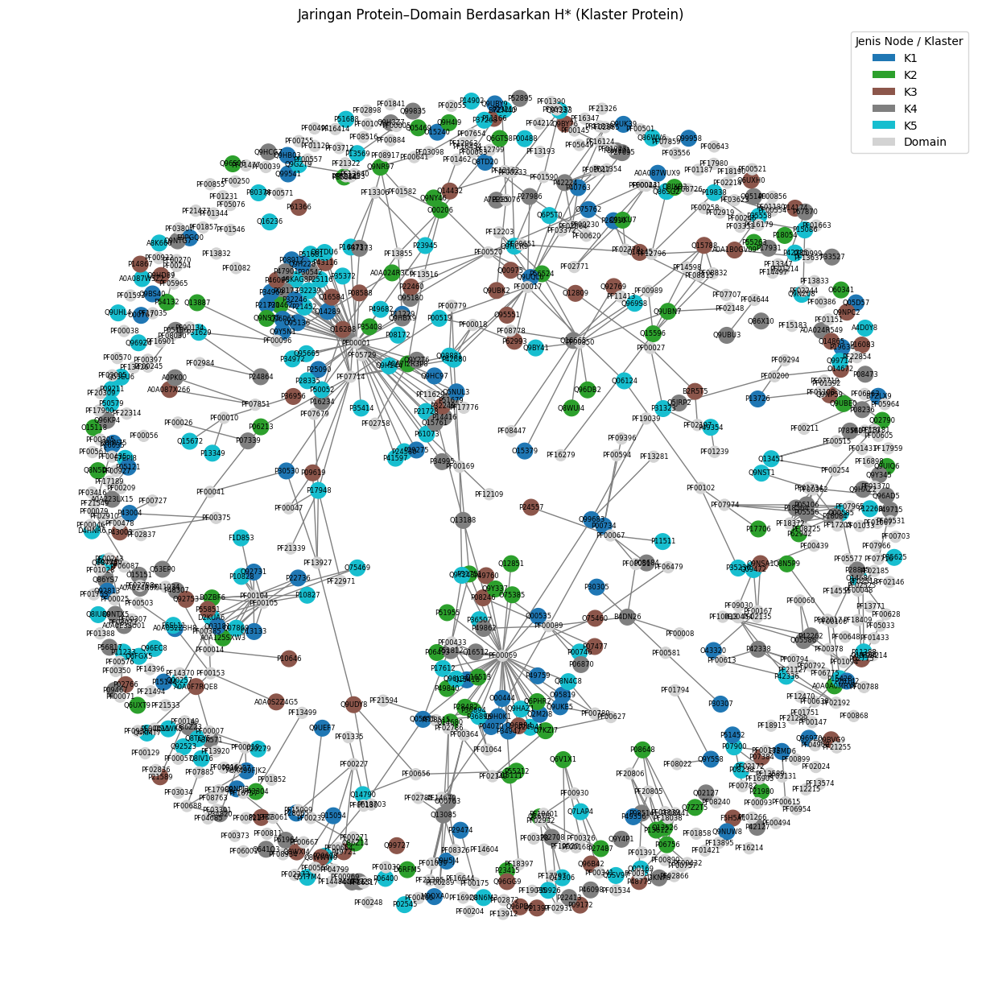

In [152]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

# --- Tentukan klaster dominan per protein ---
protein_clusters = [f"K{np.argmax(H[i])+1}" for i in range(N1)]

# Warna klaster
cluster_colors = plt.cm.tab10(np.linspace(0,1,K))  # maksimal 10 warna
protein_color_map = {f"K{i+1}": cluster_colors[i] for i in range(K)}

# Buat graph
G = nx.Graph()

# Tambahkan node protein dengan warna klaster
for i, protein in enumerate(proteins):
    G.add_node(protein, type='protein', color=protein_color_map[protein_clusters[i]])

# Tambahkan node domain (warna netral)
for domain in domains:
    G.add_node(domain, type='domain', color='lightgray')

# Tambahkan edge dari matriks F (protein-domain)
for x in range(N2):
    for i in range(N1):
        if F[x,i] > 0:
            G.add_edge(proteins[i], domains[x])

# Visualisasi jaringan
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k=0.15, seed=42)

node_colors = [G.nodes[n]['color'] for n in G.nodes]
node_sizes = [100 if G.nodes[n]['type']=='domain' else 200 for n in G.nodes]

nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=node_sizes, font_size=6, edge_color='gray')

# --- Tambahkan legend ---
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=protein_color_map[f"K{i+1}"], label=f"K{i+1}") for i in range(K)]
legend_elements.append(Patch(facecolor='lightgray', label='Domain'))
plt.legend(handles=legend_elements, loc='upper right', fontsize=10, title="Jenis Node / Klaster")

plt.title("Jaringan Protein–Domain Berdasarkan H* (Klaster Protein)")
plt.show()


In [1]:
import pandas as pd
import numpy as np

# === 1. --- Baca Data dari File ===
ppi_df = pd.read_excel(
    "D:/semhas/Data/PPI_filtered_targets_full.xlsx",
    sheet_name="PPI_with_UniProt"
)[['node1_UniProt', 'node2_UniProt']].dropna()

ddi_df = pd.read_excel(
    "D:/semhas/Data/DDI_relevan.xlsx",
    sheet_name=0
)[['Domain_1', 'Domain_2']].dropna()

pda_df = pd.read_excel(
    "D:/semhas/Data/PDA_results.xlsx"
)[['Protein_1', 'Protein_2', 'Domain_1', 'Domain_2']].dropna()

# === 2. --- Daftar unik protein dan domain ===
proteins = sorted(set(ppi_df['node1_UniProt']).union(ppi_df['node2_UniProt']))
domains  = sorted(set(ddi_df['Domain_1']).union(ddi_df['Domain_2']))

print(f"Jumlah protein: {len(proteins)}")
print(f"Jumlah domain : {len(domains)}\n")

# === 3. --- Matriks PPI (A1) ===
A1 = pd.DataFrame(0, index=proteins, columns=proteins)
for a, b in zip(ppi_df['node1_UniProt'], ppi_df['node2_UniProt']):
    if a in A1.index and b in A1.columns:
        A1.loc[a, b] = 1
        A1.loc[b, a] = 1  # simetris

print("✅ Matriks A1 (PPI) selesai dibuat")

# === 4. --- Matriks DDI (A2) ===
A2 = pd.DataFrame(0, index=domains, columns=domains)
for d1, d2 in zip(ddi_df['Domain_1'], ddi_df['Domain_2']):
    if d1 in A2.index and d2 in A2.columns:
        A2.loc[d1, d2] = 1
        A2.loc[d2, d1] = 1  # simetris

print("✅ Matriks A2 (DDI) selesai dibuat")

# === 5. --- Matriks PDA (F) ===
# Ambil pasangan domain–protein dari kedua kolom dalam pda_df
pda_pairs = pd.concat([
    pda_df[['Domain_1', 'Protein_1']].rename(columns={'Domain_1': 'Domain', 'Protein_1': 'Protein'}),
    pda_df[['Domain_2', 'Protein_2']].rename(columns={'Domain_2': 'Domain', 'Protein_2': 'Protein'})
]).dropna().drop_duplicates()

# Buat matriks F: baris = domain, kolom = protein
F = pd.DataFrame(0, index=domains, columns=proteins)
for d, p in zip(pda_pairs['Domain'], pda_pairs['Protein']):
    if d in F.index and p in F.columns:
        F.loc[d, p] = 1

print("✅ Matriks F (PDA) selesai dibuat")

# === 6. --- Integrasi DDI → PDA → Protein ===
F_np = F.values
A2_np = A2.values

# Hitung pengaruh domain ke protein: F^T * A2 * F
interaction_matrix = F_np.T @ A2_np @ F_np
interaction_df = pd.DataFrame(interaction_matrix, index=proteins, columns=proteins)

print("✅ Matriks FᵀA²F selesai dihitung\n")

# === 7. --- Ringkasan hasil ===
print("=== Ukuran Matriks ===")
print(f"A1 (PPI): {A1.shape}")
print(f"A2 (DDI): {A2.shape}")
print(f"F  (PDA): {F.shape}")
print(f"FᵀA²F   : {interaction_df.shape}\n")

# Simpan hasil untuk analisis atau visualisasi lanjutan
#A1.to_csv("D:/semhas/Hasil/A1_PPI.csv")
#A2.to_csv("D:/semhas/Hasil/A2_DDI.csv")
#F.to_csv("D:/semhas/Hasil/F_PDA.csv")
#interaction_df.to_csv("D:/semhas/Hasil/FtA2F_matrix.csv")

print("✅ Semua matriks telah disimpan ke folder D:/semhas/Hasil/")


Jumlah protein: 411
Jumlah domain : 396

✅ Matriks A1 (PPI) selesai dibuat
✅ Matriks A2 (DDI) selesai dibuat
✅ Matriks F (PDA) selesai dibuat
✅ Matriks FᵀA²F selesai dihitung

=== Ukuran Matriks ===
A1 (PPI): (411, 411)
A2 (DDI): (396, 396)
F  (PDA): (396, 411)
FᵀA²F   : (411, 411)

✅ Semua matriks telah disimpan ke folder D:/semhas/Hasil/
